<img src="2000px-Schlumberger.svg.png" height=20% width=20%>

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

## Import Data

In [4]:
df = pd.read_csv('Prestack_Event_Points_AVA_Fix.csv', sep=',')
df.head(15)

,X,Y,Z,TWT,RMO,RMO Range,Peak Frequency,Gamma,Confidence,Amplitude,Angle,Gradient,Intercept,DHI,Distance,Roughness
0,765825,7833050,-2182.46,-2182.46,0,0,34.25,136.42,96,4768.08,8.0,-967851.00,4285.52,-4.147749e+09,0,0.56
1,765850,7833049,-2184.92,-2184.92,0,0,32.22,-277.49,96,5117.47,8.0,-1117273.75,4532.27,-5.063783e+09,0,0.20
2,765875,7833049,-2187.66,-2187.66,0,0,30.88,-492.01,97,4861.35,8.0,-649076.69,4340.48,-2.817305e+09,0,0.75
3,765825,7833031,-2182.97,-2182.97,0,0,34.98,-53.50,96,5399.43,8.0,-4985664.00,4908.58,-2.450000e+10,0,0.32
4,765850,7833030,-2185.36,-2185.36,0,0,32.66,-309.41,97,5020.46,8.0,-3062386.75,4713.01,-1.440000e+10,0,0.39
5,765875,7833030,-2188.24,-2188.24,0,0,30.94,-560.97,97,4971.50,8.0,-3317123.50,4544.53,-1.510000e+10,0,0.97
6,765900,7833029,-2190.21,-2190.21,0,0,31.59,-552.96,98,4349.96,8.0,-231623.77,4327.44,-1.002338e+09,0,1.16
7,765824,7833012,-2182.98,-2182.98,0,0,35.49,-182.07,96,5823.63,8.0,-8966026.00,5241.92,-4.700000e+10,0,0.34
8,765849,7833012,-2185.46,-2185.46,0,0,32.97,-364.89,97,5194.95,8.0,-7560481.00,5135.40,-3.880000e+10,0,0.54
9,765874,7833011,-2188.23,-2188.23,0,0,32.35,-563.36,97,4985.14,8.0,-7163479.00,4754.94,-3.410000e+10,0,1.20


## Describing Data

In [5]:
print('Data shape: ', df.shape)
print('Data columns: ', df.columns)
print(df.info())


Data shape:  (136, 16)
Data columns:  Index(['X', 'Y', 'Z', 'TWT', 'RMO', 'RMO Range', 'Peak Frequency', 'Gamma',
       'Confidence', 'Amplitude', 'Angle', 'Gradient', 'Intercept', 'DHI',
       'Distance', 'Roughness'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136 entries, 0 to 135
Data columns (total 16 columns):
X                 136 non-null int64
Y                 136 non-null int64
Z                 136 non-null float64
TWT               136 non-null float64
RMO               136 non-null int64
RMO Range         136 non-null int64
Peak Frequency    136 non-null float64
Gamma             136 non-null float64
Confidence        136 non-null int64
Amplitude         136 non-null float64
Angle             136 non-null float64
Gradient          136 non-null float64
Intercept         136 non-null float64
DHI               136 non-null float64
Distance          136 non-null int64
Roughness         136 non-null float64
dtypes: float64(10), int64(6)
memory us

In [6]:
df.describe()

,X,Y,Z,TWT,RMO,RMO Range,Peak Frequency,Gamma,Confidence,Amplitude,Angle,Gradient,Intercept,DHI,Distance,Roughness
count,136.000000,1.360000e+02,136.000000,136.000000,136.0,136.0,136.000000,136.000000,136.000000,136.000000,136.000000,1.360000e+02,136.000000,1.360000e+02,136.0,136.000000
mean,765859.705882,7.833014e+06,-2185.487206,-2185.487206,0.0,0.0,26.555147,-422.205294,96.955882,4310.507500,28.500000,-5.220463e+06,4791.197059,-2.586654e+10,0.0,0.608235
std,25.858337,2.415491e+01,2.255889,2.255889,0.0,0.0,5.481021,219.605505,0.941769,620.008091,13.470014,3.069582e+06,301.144427,1.591666e+10,0.0,0.335075
min,765824.000000,7.832974e+06,-2190.680000,-2190.680000,0.0,0.0,18.690000,-694.090000,94.000000,3200.120000,8.000000,-9.032334e+06,4285.520000,-4.700000e+10,0.0,0.160000
25%,765849.000000,7.832993e+06,-2187.522500,-2187.522500,0.0,0.0,21.195000,-577.120000,96.000000,3765.562500,18.247500,-8.234606e+06,4544.530000,-4.070000e+10,0.0,0.340000
50%,765850.000000,7.833012e+06,-2185.320000,-2185.320000,0.0,0.0,26.170000,-498.480000,97.000000,4277.335000,28.500000,-5.618342e+06,4754.940000,-2.720000e+10,0.0,0.510000
75%,765875.000000,7.833030e+06,-2183.680000,-2183.680000,0.0,0.0,32.220000,-309.410000,98.000000,4768.080000,38.752500,-3.062387e+06,5069.490000,-1.440000e+10,0.0,0.850000
max,765900.000000,7.833050e+06,-2181.250000,-2181.250000,0.0,0.0,35.490000,136.420000,98.000000,5823.630000,49.000000,-2.316238e+05,5241.920000,-1.002338e+09,0.0,1.210000


## Sorting Data

### Sorting data by X and Y

In [7]:
df.sort_values(by=['X', 'Y'], ascending=[True, True]).head(16)

,X,Y,Z,TWT,RMO,RMO Range,Peak Frequency,Gamma,Confidence,Amplitude,Angle,Gradient,Intercept,DHI,Distance,Roughness
11,765824,7832993,-2183.06,-2183.06,0,0,35.37,-369.75,96,5813.01,8.00,-9032334.0,5164.04,-4.660000e+10,0,0.48
28,765824,7832993,-2182.90,-2182.90,0,0,35.37,-369.75,96,5813.01,13.86,-9032334.0,5164.04,-4.660000e+10,0,0.48
45,765824,7832993,-2182.70,-2182.70,0,0,31.46,-369.75,97,4463.58,19.71,-9032334.0,5164.04,-4.660000e+10,0,0.48
62,765824,7832993,-2183.96,-2183.96,0,0,27.40,-369.75,96,3922.73,25.57,-9032334.0,5164.04,-4.660000e+10,0,0.48
79,765824,7832993,-2183.68,-2183.68,0,0,23.65,-369.75,95,3512.09,31.43,-9032334.0,5164.04,-4.660000e+10,0,1.04
96,765824,7832993,-2183.10,-2183.10,0,0,21.82,-369.75,97,3634.97,37.29,-9032334.0,5164.04,-4.660000e+10,0,1.04
113,765824,7832993,-2181.25,-2181.25,0,0,20.16,-369.75,97,3727.70,43.14,-9032334.0,5164.04,-4.660000e+10,0,1.04
130,765824,7832993,-2181.47,-2181.47,0,0,19.95,-369.75,98,3771.80,49.00,-9032334.0,5164.04,-4.660000e+10,0,1.04
7,765824,7833012,-2182.98,-2182.98,0,0,35.49,-182.07,96,5823.63,8.00,-8966026.0,5241.92,-4.700000e+10,0,0.34
24,765824,7833012,-2182.91,-2182.91,0,0,35.49,-182.07,96,5823.63,13.86,-8966026.0,5241.92,-4.700000e+10,0,0.34



### Sorting data by Angle

In [8]:
df.sort_values(by='Angle', ascending=True).head(16)

,X,Y,Z,TWT,RMO,RMO Range,Peak Frequency,Gamma,Confidence,Amplitude,Angle,Gradient,Intercept,DHI,Distance,Roughness
0,765825,7833050,-2182.46,-2182.46,0,0,34.25,136.42,96,4768.08,8.0,-967851.00,4285.52,-4.147749e+09,0,0.56
16,765874,7832974,-2188.10,-2188.10,0,0,34.42,-694.09,97,5300.05,8.0,-8325701.50,5069.49,-4.220000e+10,0,1.14
15,765849,7832974,-2185.78,-2185.78,0,0,32.88,-594.81,97,4912.48,8.0,-6757281.50,4741.60,-3.200000e+10,0,0.38
14,765899,7832992,-2190.08,-2190.08,0,0,34.68,-577.12,96,4755.24,8.0,-5618342.50,4840.33,-2.720000e+10,0,1.13
13,765874,7832992,-2188.18,-2188.18,0,0,33.42,-643.95,98,5114.15,8.0,-8234606.00,4938.16,-4.070000e+10,0,1.21
11,765824,7832993,-2183.06,-2183.06,0,0,35.37,-369.75,96,5813.01,8.0,-9032334.00,5164.04,-4.660000e+10,0,0.48
10,765899,7833011,-2190.31,-2190.31,0,0,34.01,-579.05,97,4697.96,8.0,-4352520.00,4746.26,-2.070000e+10,0,1.19
9,765874,7833011,-2188.23,-2188.23,0,0,32.35,-563.36,97,4985.14,8.0,-7163479.00,4754.94,-3.410000e+10,0,1.20
12,765849,7832993,-2185.68,-2185.68,0,0,33.02,-498.48,98,5214.61,8.0,-8406092.00,5166.38,-4.340000e+10,0,0.46
7,765824,7833012,-2182.98,-2182.98,0,0,35.49,-182.07,96,5823.63,8.0,-8966026.00,5241.92,-4.700000e+10,0,0.34


## Aggregation & Grouping Data

In [9]:
df[['X', 'Y']].nunique()

X     8
Y    10
dtype: int64

In [10]:
df.groupby(['X', 'Y'])['Angle', 'Amplitude'].nunique()

Angle  Amplitude
X      Y                        
765824 7832993      8          7
       7833012      8          7
765825 7833031      8          7
       7833050      8          7
765849 7832974      8          7
       7832993      8          7
       7833012      8          7
765850 7833030      8          7
       7833049      8          7
765874 7832974      8          7
       7832992      8          7
       7833011      8          7
765875 7833030      8          7
       7833049      8          7
765899 7832992      8          7
       7833011      8          7
765900 7833029      8          7

There 17 groups, that devided by the coordinats. There are:
1. C1 = (765824, 7832993)
2. C2 = (765824, 7833012)
3. C3 = (765825, 7833031)
4. C4 = (765825, 7833050)
5. C5 = (765849, 7832974)
6. C6 = (765849, 7832993)
7. C7 = (765849, 7833012)
8. C8 = (765850, 7833030)
9. C9 = (765850, 7833049)
10. C10 = (765874, 7832974)
11. C11 = (765874, 7832992)
12. C12 = (765874, 7833011)
13. C13 = (765875, 7833030)
14. C14 = (765875, 7833049)
15. C15 = (765899, 7832992)
16. C16 = (765899, 7833011)
17. C17 = (765900, 7833029)

In [11]:
C1 = df.loc[(df['X'] == 765824) & (df['Y'] == 7832993)]
C2 = df.loc[(df['X'] == 765824) & (df['Y'] == 7833012)]
C3 = df.loc[(df['X'] == 765825) & (df['Y'] == 7833031)]
C4 = df.loc[(df['X'] == 765825) & (df['Y'] == 7833050)]
C5 = df.loc[(df['X'] == 765849) & (df['Y'] == 7832974)]
C6 = df.loc[(df['X'] == 765849) & (df['Y'] == 7832993)]
C7 = df.loc[(df['X'] == 765849) & (df['Y'] == 7833012)]
C8 = df.loc[(df['X'] == 765850) & (df['Y'] == 7833030)]
C9 = df.loc[(df['X'] == 765850) & (df['Y'] == 7833049)]
C10 = df.loc[(df['X'] == 765874) & (df['Y'] == 7832974)]
C11 = df.loc[(df['X'] == 765874) & (df['Y'] == 7832992)]
C12 = df.loc[(df['X'] == 765874) & (df['Y'] == 7833011)]
C13 = df.loc[(df['X'] == 765875) & (df['Y'] == 7833030)]
C14 = df.loc[(df['X'] == 765875) & (df['Y'] == 7833049)]
C15 = df.loc[(df['X'] == 765899) & (df['Y'] == 7832992)]
C16 = df.loc[(df['X'] == 765899) & (df['Y'] == 7833011)]
C17 = df.loc[(df['X'] == 765900) & (df['Y'] == 7833029)]

### Amplitude

In [12]:
Amp1 = np.array(C1['Amplitude'])
Amp2 = np.array(C2['Amplitude'])
Amp3 = np.array(C3['Amplitude'])
Amp4 = np.array(C4['Amplitude'])
Amp5 = np.array(C5['Amplitude'])
Amp6 = np.array(C6['Amplitude'])
Amp7 = np.array(C7['Amplitude'])
Amp8 = np.array(C8['Amplitude'])
Amp9 = np.array(C9['Amplitude'])
Amp10 = np.array(C10['Amplitude'])
Amp11 = np.array(C11['Amplitude'])
Amp12 = np.array(C12['Amplitude'])
Amp13 = np.array(C13['Amplitude'])
Amp14 = np.array(C14['Amplitude'])
Amp15 = np.array(C15['Amplitude'])
Amp16 = np.array(C16['Amplitude'])
Amp17 = np.array(C17['Amplitude'])

# C = C1, C2, C3, C4, C5, C6, C7, C8, C9, C10, C11, C12, C13, C14, C15, C16, C17
# Amp = []
# for am in C:
#     amp = am['Amplitude']
#     Amp.append(amp)
# print(Amp)

### Angle

In [13]:
Ang = np.array(C1['Angle'])


### Intercept

In [14]:
C = C1, C2, C3, C4, C5, C6, C7, C8, C9, C10, C11, C12, C13, C14, C15, C16, C17
A = []
B = []
for c in C:
    Aint = c['Intercept'].mean()
#     Aint = np.around(Aint, decimals=2)
    A.append(Aint)
    Bgra = c['Gradient'].mean()
    B.append(Bgra)
print('Intercept: ', A)
print('Gradient: ', B)

Intercept:  [5164.04, 5241.919999999999, 4908.580000000001, 4285.52, 4741.599999999999, 5166.38, 5135.400000000001, 4713.010000000001, 4532.27, 5069.489999999999, 4938.16, 4754.94, 4544.53, 4340.48, 4840.330000000001, 4746.260000000001, 4327.44]
Gradient:  [-9032334.0, -8966026.0, -4985664.0, -967851.0, -6757281.5, -8406092.0, -7560481.0, -3062386.75, -1117273.75, -8325701.5, -8234606.0, -7163479.0, -3317123.5, -649076.69, -5618342.5, -4352520.0, -231623.77]


### Gradient

In [15]:
# B = np.mean(np.array(G1['Gradient']))


## Plotting Data

### Plotting one by one

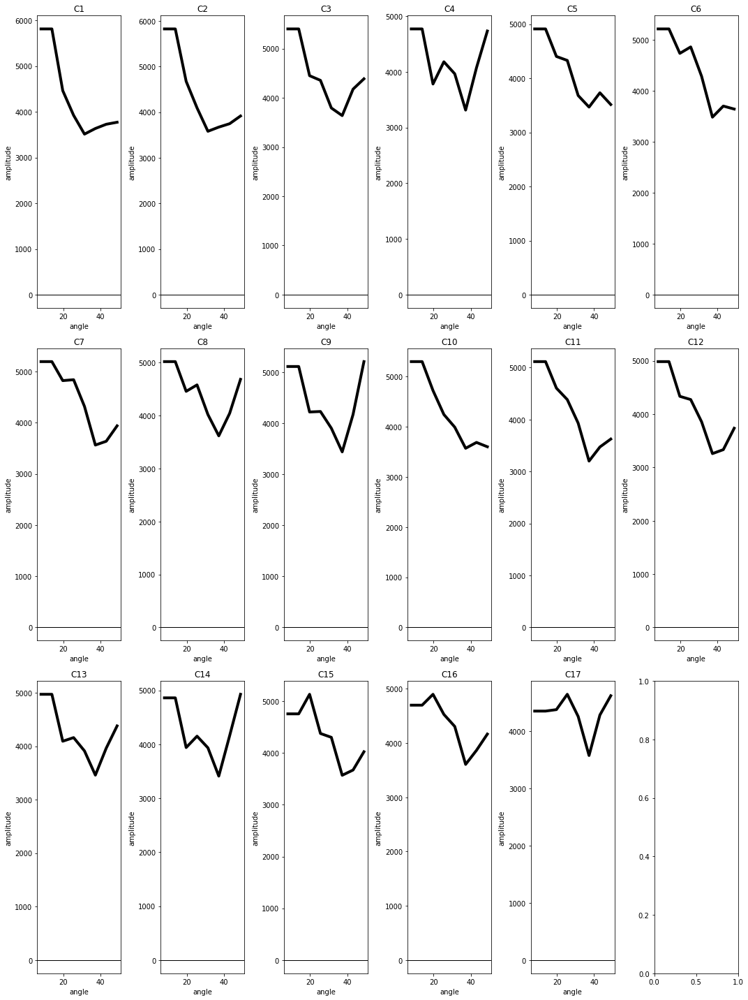

In [16]:
fig, ((ax1, ax2, ax3, ax4, ax5, ax6), (ax7, ax8, ax9, ax10, ax11, ax12), (ax13, ax14, ax15, ax16, ax17, ax18)) \
    = plt.subplots(nrows=3, ncols=6,  figsize=(15, 20))

# C1
ax1.plot(Ang, Amp1,'-k', lw=4)
ax1.axhline(0, color='k', lw=1)
ax1.set_xlabel('angle')
ax1.set_ylabel('amplitude')
ax1.set_title("C1")

# C2
ax2.plot(Ang, Amp2,'-k', lw=4)
ax2.axhline(0, color='k', lw=1)
ax2.set_xlabel('angle')
ax2.set_ylabel('amplitude')
ax2.set_title("C2")

# C3
ax3.plot(Ang, Amp3,'-k', lw=4)
ax3.axhline(0, color='k', lw=1)
ax3.set_xlabel('angle')
ax3.set_ylabel('amplitude')
ax3.set_title("C3")

# C4
ax4.plot(Ang, Amp4,'-k', lw=4)
ax4.axhline(0, color='k', lw=1)
ax4.set_xlabel('angle')
ax4.set_ylabel('amplitude')
ax4.set_title("C4")

# C5
ax5.plot(Ang, Amp5,'-k', lw=4)
ax5.axhline(0, color='k', lw=1)
ax5.set_xlabel('angle')
ax5.set_ylabel('amplitude')
ax5.set_title("C5")

# C6
ax6.plot(Ang, Amp6,'-k', lw=4)
ax6.axhline(0, color='k', lw=1)
ax6.set_xlabel('angle')
ax6.set_ylabel('amplitude')
ax6.set_title("C6")

# C7
ax7.plot(Ang, Amp7,'-k', lw=4)
ax7.axhline(0, color='k', lw=1)
ax7.set_xlabel('angle')
ax7.set_ylabel('amplitude')
ax7.set_title("C7")

# C8
ax8.plot(Ang, Amp8,'-k', lw=4)
ax8.axhline(0, color='k', lw=1)
ax8.set_xlabel('angle')
ax8.set_ylabel('amplitude')
ax8.set_title("C8")

# C9
ax9.plot(Ang, Amp9,'-k', lw=4)
ax9.axhline(0, color='k', lw=1)
ax9.set_xlabel('angle')
ax9.set_ylabel('amplitude')
ax9.set_title("C9")

# C10
ax10.plot(Ang, Amp10,'-k', lw=4)
ax10.axhline(0, color='k', lw=1)
ax10.set_xlabel('angle')
ax10.set_ylabel('amplitude')
ax10.set_title("C10")

# C11
ax11.plot(Ang, Amp11,'-k', lw=4)
ax11.axhline(0, color='k', lw=1)
ax11.set_xlabel('angle')
ax11.set_ylabel('amplitude')
ax11.set_title("C11")

# C12
ax12.plot(Ang, Amp12,'-k', lw=4)
ax12.axhline(0, color='k', lw=1)
ax12.set_xlabel('angle')
ax12.set_ylabel('amplitude')
ax12.set_title("C12")

# C13
ax13.plot(Ang, Amp13,'-k', lw=4)
ax13.axhline(0, color='k', lw=1)
ax13.set_xlabel('angle')
ax13.set_ylabel('amplitude')
ax13.set_title("C13")

# C14
ax14.plot(Ang, Amp14,'-k', lw=4)
ax14.axhline(0, color='k', lw=1)
ax14.set_xlabel('angle')
ax14.set_ylabel('amplitude')
ax14.set_title("C14")

# C5
ax15.plot(Ang, Amp15,'-k', lw=4)
ax15.axhline(0, color='k', lw=1)
ax15.set_xlabel('angle')
ax15.set_ylabel('amplitude')
ax15.set_title("C15")

# C16
ax16.plot(Ang, Amp16,'-k', lw=4)
ax16.axhline(0, color='k', lw=1)
ax16.set_xlabel('angle')
ax16.set_ylabel('amplitude')
ax16.set_title("C16")

# C17
ax17.plot(Ang, Amp17,'-k', lw=4)
ax17.axhline(0, color='k', lw=1)
ax17.set_xlabel('angle')
ax17.set_ylabel('amplitude')
ax17.set_title("C17")

plt.tight_layout()

# ax4.plot(A, B,'ko',ms=10,mfc='none',mew=2)
# ax4.axhline(0, color='k', lw=1), ax4.axvline(0, color='k', lw=1)
# ax4.set_xlabel('intercept'), ax4.set_ylabel('gradient')

# ax4.xaxis.set_label_position('top'), ax4.xaxis.tick_top()
# ax4.yaxis.set_label_position('right'), ax4.yaxis.tick_right()
# ax4.set_xlim(-10e4, 10e4), ax4.set_ylim(-10e6,10e6)

# plt.tight_layout()

### Plot in one graph

In [17]:
avo = pd.DataFrame({'Angle': Ang, 'C1': Amp1, 'C2': Amp2, 'C3': Amp3, 'C4': Amp4, 'C5': Amp5, 'C6': Amp6, 'C7': Amp7, 'C8': Amp8, \
                    'C9': Amp9, 'C10': Amp10, 'C11': Amp11, 'C12': Amp12, 'C13': Amp13, 'C14': Amp14, 'C15': Amp15, 'C16': Amp16, 'C17': Amp17})
avo.head()

,Angle,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,C15,C16,C17
0,8.00,5813.01,5823.63,5399.43,4768.08,4912.48,5214.61,5194.95,5020.46,5117.47,5300.05,5114.15,4985.14,4971.50,4861.35,4755.24,4697.96,4349.96
1,13.86,5813.01,5823.63,5399.43,4768.08,4912.48,5214.61,5194.95,5020.46,5117.47,5300.05,5114.15,4985.14,4971.50,4861.35,4755.24,4697.96,4349.96
2,19.71,4463.58,4674.95,4449.44,3779.87,4403.57,4735.21,4823.54,4458.91,4225.40,4723.22,4603.56,4333.89,4093.68,3940.16,5133.13,4898.28,4375.78
3,25.57,3922.73,4093.34,4354.52,4178.69,4330.15,4861.56,4841.02,4580.73,4234.86,4245.23,4382.85,4273.30,4161.21,4150.82,4376.05,4527.67,4643.45
4,31.43,3512.09,3580.65,3793.21,3962.94,3681.62,4285.89,4318.45,4020.51,3907.18,3992.65,3930.04,3856.73,3911.81,3935.41,4301.83,4305.71,4256.30


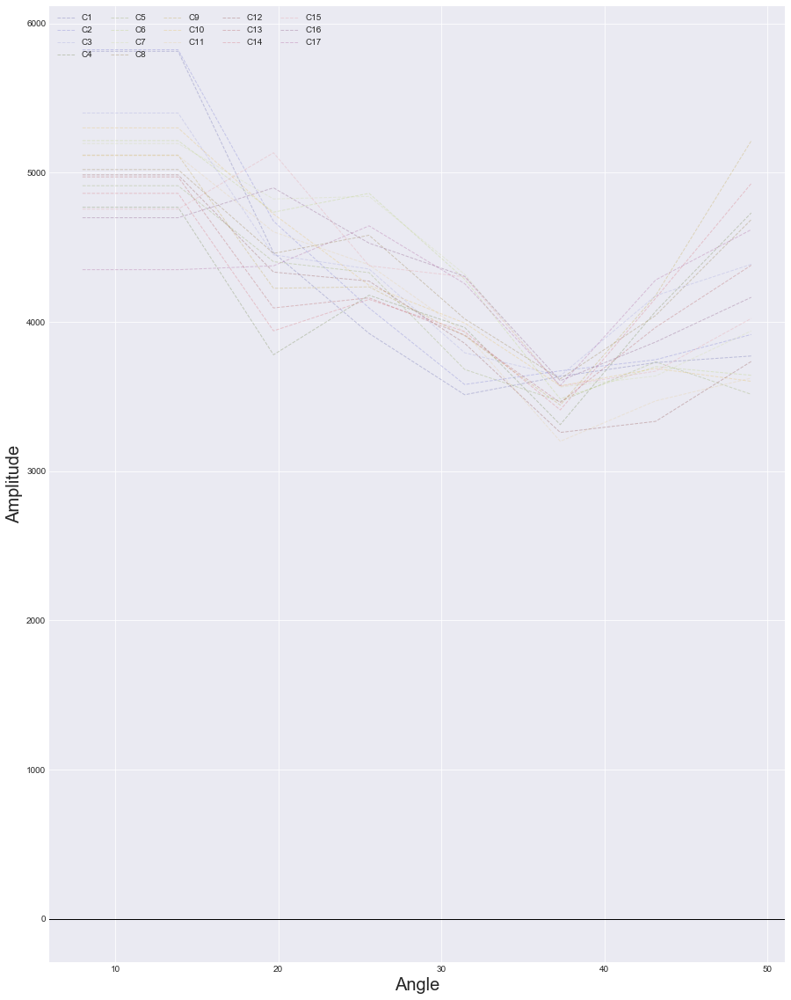

In [18]:
fig = plt.gcf()
fig.set_size_inches(15, 20)

# style
plt.style.use('seaborn-darkgrid')
 
# create a color palette
palette = plt.get_cmap('tab20b')

num=0
for column in avo.drop('Angle', axis=1):
    num += 1

    # plt.plot(avo['Angle'], avo[column], marker='', color='black', linewidth=1, alpha=0.5)
    plt.plot(avo['Angle'], avo[column], marker='', color=palette(num), ls='--', lw = 1, alpha=0.3, label=column)
    plt.xlabel('Angle', size=20)
    plt.ylabel('Amplitude', size=20)
    plt.axhline(0, color='k', lw=1)



    
 
# # Add legend
plt.legend(loc=2, ncol=5)

## Data Modelling

In [19]:
import operator
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures


### Linear Regression

In [20]:
np.random.seed(0)
x = df['Angle']
y = df['Amplitude']

# transforming the data to include another axis
x = x[:, np.newaxis]
y = y[:, np.newaxis]

polynomial_features= PolynomialFeatures(degree=1)
x_lin = polynomial_features.fit_transform(x)

model = LinearRegression()
model.fit(x_lin, y)
y_lin_pred = model.predict(x_lin)

rmse = np.sqrt(mean_squared_error(y,y_lin_pred))
r2 = r2_score(y,y_lin_pred)
print(rmse)
print(r2)

# sort the values of x before line plot
sort_axis = operator.itemgetter(0)
sorted_zip = sorted(zip(x,y_lin_pred), key=sort_axis)
x, y_lin_pred = zip(*sorted_zip)

442.28969370240515
0.48734633681157513


### Polynomial Regression

In [21]:
np.random.seed(0)
x = df['Angle']
y = df['Amplitude']

# transforming the data to include another axis
x = x[:, np.newaxis]
y = y[:, np.newaxis]

polynomial_features= PolynomialFeatures(degree=2)
x_poly = polynomial_features.fit_transform(x)

model = LinearRegression()
model.fit(x_poly, y)
y_poly_pred = model.predict(x_poly)

rmse = np.sqrt(mean_squared_error(y,y_poly_pred))
r2 = r2_score(y,y_poly_pred)
print(rmse)
print(r2)

# sort the values of x before line plot
sort_axis = operator.itemgetter(0)
sorted_zip = sorted(zip(x,y_poly_pred), key=sort_axis)
x, y_poly_pred = zip(*sorted_zip)

384.17387830395114
0.6132181468891217


In [22]:
# fig = plt.gcf()
# fig.set_size_inches(15, 20)

# # style
# plt.style.use('seaborn-darkgrid')
 
# # create a color palette
# palette = plt.get_cmap('tab20b')

# num=0
# for column in avo.drop('Angle', axis=1):
#     num += 1

#     # plt.plot(avo['Angle'], avo[column], marker='', color='black', linewidth=1, alpha=0.5)
#     plt.plot(avo['Angle'], avo[column], marker='', color=palette(num), ls='--', lw = 1, alpha=0.3, label=column)
#     plt.plot(x, y_poly_pred, marker='', color='red', ls='-', lw = 1, alpha=0.7)
#     plt.xlabel('Angle', size=20)
#     plt.ylabel('Amplitude', size=20)
#     plt.axhline(0, color='k', lw=1)

    
# plt.plot(x, y_poly_pred, marker='', color='red', ls='-', lw = 1, alpha=0.7, label='Polynomial Regression')
# plt.plot(x, y_lin_pred, marker='', color='cyan', ls='-', lw = 1, alpha=0.7, label='Linear Regression')


    

#Add legend
# plt.legend()

In [23]:
amax = []
amin = []
amean = []
astd = []
for i in avo['Angle']:
    aa = avo.loc[avo['Angle'] == i]
    aa = aa.drop('Angle', axis=1)
    aa = np.array(aa)
    amax.append(aa.max())
    amin.append(aa.min())
    amean.append(aa.mean())
    astd.append(aa.std())


In [24]:
amean = np.array(amean)
amean = np.around(amean, decimals=2)
astd = np.array(astd)

astdp1 = amean - 1*astd
astdm1 = amean + 1*astd

astdp2 = amean - 2*astd
astdm2 = amean + 2*astd

astdp3 = amean - 3*astd
astdm3 = amean + 3*astd
print(amean)
print(astd)

[5076.44 5076.44 4477.42 4362.25 3973.71 3499.01 3849.72 4169.08]
[364.31219492 364.31219492 337.14874705 249.29846181 245.84942249
 134.82746003 262.27351923 505.82499566]


In [25]:
import scipy.interpolate as interpolate
x = avo['Angle']
y = amean
t, c, k = interpolate.splrep(x, y, s=0, k=1)

N = 40
xmin, xmax = x.min(), x.max()
xx = np.linspace(xmin, xmax, N)
spline = interpolate.BSpline(t, c, k, extrapolate=False)
yy = spline(xx)

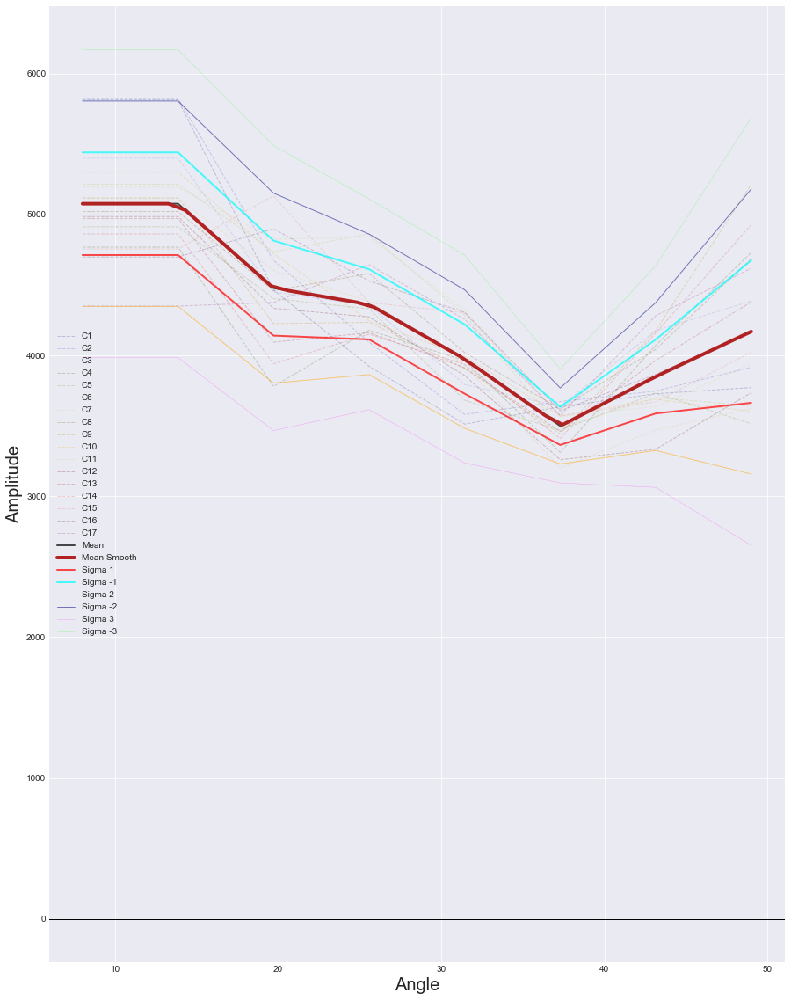

In [26]:
fig = plt.gcf()
fig.set_size_inches(15, 20)

# style
plt.style.use('seaborn-darkgrid')
 
# create a color palette
palette = plt.get_cmap('tab20b')

num=0
for column in avo.drop('Angle', axis=1):
    num += 1

    # plt.plot(avo['Angle'], avo[column], marker='', color='black', linewidth=1, alpha=0.5)
    plt.plot(avo['Angle'], avo[column], marker='', color=palette(num), ls='--', lw = 1, alpha=0.3, label=column)
    plt.xlabel('Angle', size=20)
    plt.ylabel('Amplitude', size=20)
    plt.axhline(0, color='k', lw=1)

    
plt.plot(avo['Angle'], amean, marker='', color='black', ls='-', lw = 2, alpha=0.7, label='Mean')
plt.plot(xx, yy, marker='', color='firebrick', ls='-', lw = 4, alpha=3, label='Mean Smooth')
plt.plot(avo['Angle'], astdp1, marker='', color='red', ls='-', lw = 2, alpha=0.7, label='Sigma 1')
plt.plot(avo['Angle'], astdm1, marker='', color='cyan', ls='-', lw = 2, alpha=0.7, label='Sigma -1')
plt.plot(avo['Angle'], astdp2, marker='', color='orange', ls='-', lw = 1, alpha=0.5, label='Sigma 2')
plt.plot(avo['Angle'], astdm2, marker='', color='navy', ls='-', lw = 1, alpha=0.5, label='Sigma -2')
plt.plot(avo['Angle'], astdp3, marker='', color='magenta', ls='-', lw = 0.5, alpha=0.3, label='Sigma 3')
plt.plot(avo['Angle'], astdm3, marker='', color='lime', ls='-', lw = 0.5, alpha=0.3, label='Sigma -3')

    
 
# # Add legend
plt.legend()

In [27]:
from scipy.stats import pearsonr
AMP = [Amp1, Amp2, Amp3, Amp4, Amp5, Amp6, Amp7, Amp8, Amp9, Amp10, Amp11, Amp12, Amp13, Amp14, Amp15, Amp16, Amp17]
Corr = []
# calculate Pearson's correlation
for am in AMP:
    corr, _ = np.array(pearsonr(amean, am))
    Corr.append(corr)
for cr in Corr:
    print('Correlation: ', cr)

Correlation:  0.9221498983087488
Correlation:  0.9404897675107918
Correlation:  0.9605772233808995
Correlation:  0.7603205046982924
Correlation:  0.9393126643859278
Correlation:  0.9046402043034297
Correlation:  0.9265347519874991
Correlation:  0.9407759602205411
Correlation:  0.7803415657630112
Correlation:  0.9398122254059903
Correlation:  0.9654584109761617
Correlation:  0.977408752004415
Correlation:  0.9462108962107725
Correlation:  0.7461221148387356
Correlation:  0.8149597534567444
Correlation:  0.854572437033076
Correlation:  0.520920735610454


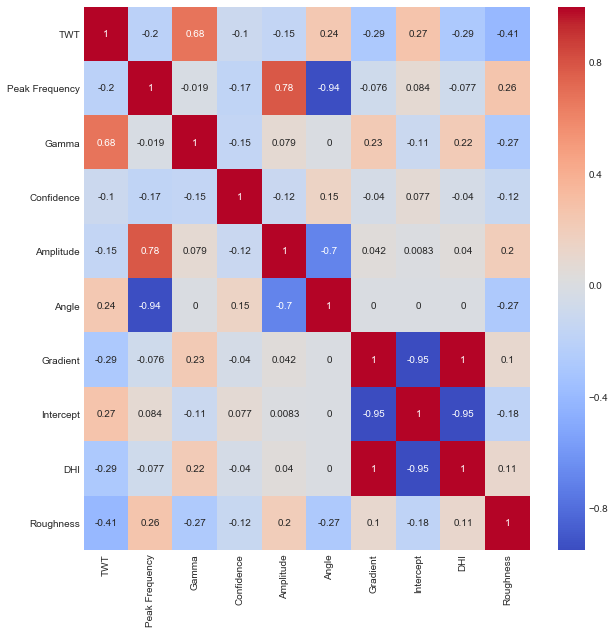

In [28]:
train_data = df.drop(['X','Y','Z','RMO', 'RMO Range', 'Distance'], axis=1)

import seaborn as sns
def drawheatmap(df):
    '''Builds the heat map for the given data'''
    f, ax = plt.subplots(figsize=(10, 10))
    sns.heatmap(df.corr(method='spearman'), annot=True, cmap='coolwarm')
drawheatmap(train_data)

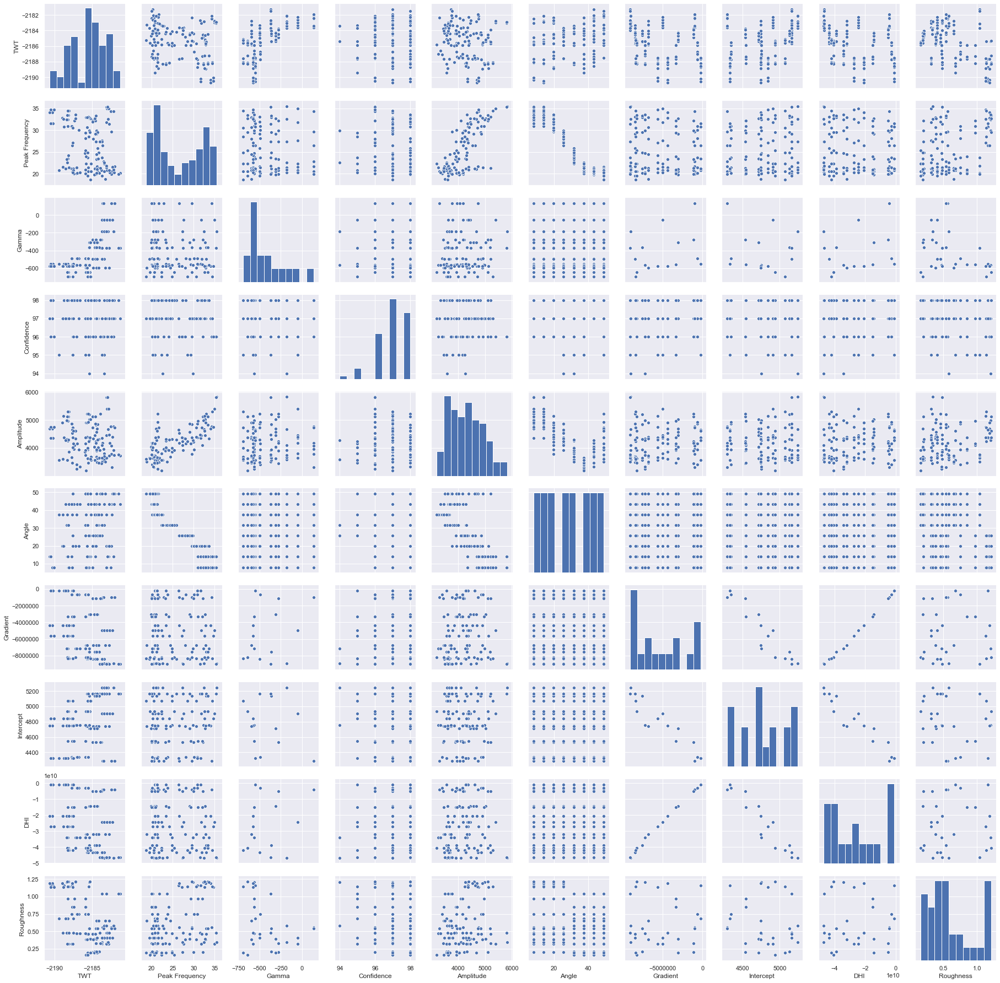

In [29]:
#save plot display settings to change back to when done plotting with seaborn
# inline_rc = dict(mpl.rcParams)

import seaborn as sns
sns.set()
sns.pairplot(train_data)

#switch back to default matplotlib plot style
# mpl.rcParams.update(inline_rc)

In [30]:
df2 = df[['X', 'Y']]
df2 = df2.drop_duplicates()
df2['Correlate'] = Corr
df2

,X,Y,Correlate
0,765825,7833050,0.922150
1,765850,7833049,0.940490
2,765875,7833049,0.960577
3,765825,7833031,0.760321
4,765850,7833030,0.939313
5,765875,7833030,0.904640
6,765900,7833029,0.926535
7,765824,7833012,0.940776
8,765849,7833012,0.780342
9,765874,7833011,0.939812


In [31]:
x = df2['X'].values
y = df2['Y'].values
c = df2['Correlate'].values


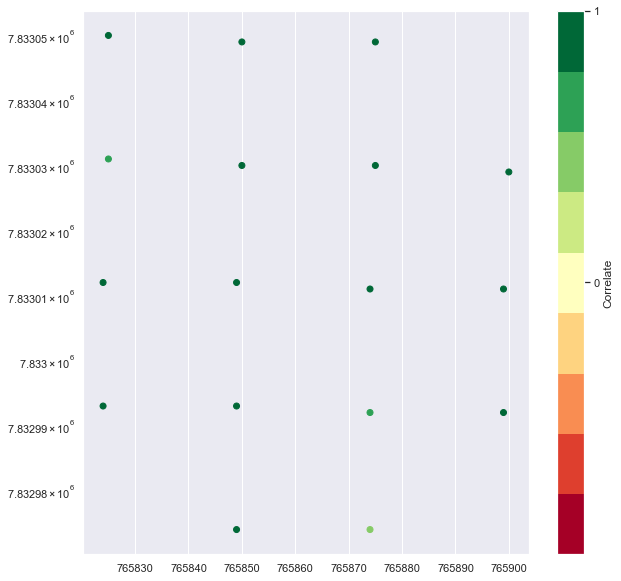

In [32]:
fig = plt.gcf()
fig.set_size_inches(10, 10)
plt.scatter(x, y,
            c=c, cmap=plt.cm.get_cmap('RdYlGn', 9))
plt.yscale('log')
plt.colorbar(ticks=range(9), label='Correlate')
plt.clim(-1.00, 1.00)

# ALL DATA

In [33]:
df = pd.read_csv('Prestack_Event_Points_AVA_All_Fix.csv', sep=',')
df.head(15)
print(df.shape)

(458370, 16)


In [34]:
dfwell = pd.read_csv('Polygon_Well_Fix.csv', sep=',')
dfp = pd.read_csv('Prestack_Event_Points_AVA_Fix.csv', sep=',')
dfwell.head(15)
print(dfwell.shape)

(33, 3)


In [35]:
dfall = df[['X', 'Y']]
dfall = dfall.drop_duplicates()
x = dfall['X'].values
y = dfall['Y'].values

dfwell = dfwell[['X', 'Y']]
dfwell = dfwell.drop_duplicates()
xw = dfwell['X'].values
yw = dfwell['Y'].values

dfp = dfp[['X', 'Y']]
dfp = dfp.drop_duplicates()
xp = dfp['X'].values
yp = dfp['Y'].values
len(y)

58256

In [36]:

CMP = []
for i,j in (zip(x,y)):
    
    C = df.loc[(df['X'] == i) & (df['Y'] == j)]
    CMP.append(C)


In [37]:
# index = [23998,23999,24000,24001,24003,24004,24005,24007,24008,24009,24010,24011,24013,24125,24016,24017,24128,24129,241
index = np.arange(len(x))

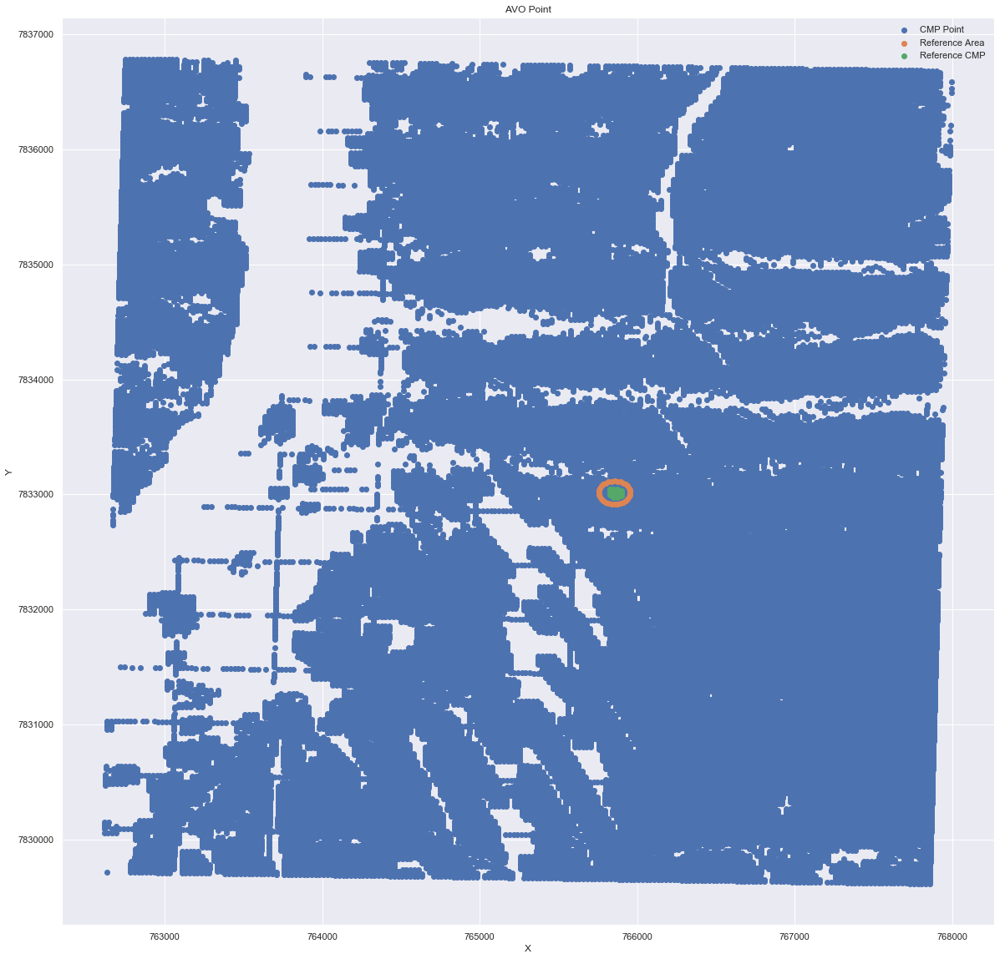

In [38]:
fig = plt.gcf()
fig.set_size_inches(20, 20)
plt.scatter(x, y, label='CMP Point')
plt.scatter(xw, yw, label='Reference Area')
plt.scatter(xp, yp, label='Reference CMP')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('AVO Point')
plt.legend()
# for ind in index:

#     plt.scatter(CMP[ind]['X'], CMP[ind]['Y'], color='cyan')

## Similarity

In [39]:
from sklearn.metrics import mean_absolute_error
Similarity = []
for ind in index:
    if len(CMP[ind]['Amplitude'].values) == len(amean):
        err = np.sqrt(mean_absolute_error(amean, CMP[ind]['Amplitude']))
        sim = 100 - err
        print('Similarity between AVO CMP{} and AVO reference is: {}'.format(ind,sim)) 
    elif len(CMP[ind]['Amplitude'].values) == (len(amean)-1):
        err = np.sqrt(mean_absolute_error(amean[0:7], CMP[ind]['Amplitude']))
        sim = 100 - err
        print('Similarity between AVO CMP{} and AVO reference is: {}'.format(ind,sim))
    elif len(CMP[ind]['Amplitude'].values) == (len(amean)-2):
        err = np.sqrt(mean_absolute_error(amean[0:6], CMP[ind]['Amplitude']))
        sim = 100 - err
        print('Similarity between AVO CMP{} and AVO reference is: {}'.format(ind,sim))
    elif len(CMP[ind]['Amplitude'].values) == (len(amean)-3):
        err = np.sqrt(mean_absolute_error(amean[0:5], CMP[ind]['Amplitude']))
        sim = 100 - err
        print('Similarity between AVO CMP{} and AVO reference is: {}'.format(ind,sim))
    elif len(CMP[ind]['Amplitude'].values) == (len(amean)-4):
        err = np.sqrt(mean_absolute_error(amean[0:4], CMP[ind]['Amplitude']))
        sim = 100 - err
        print('Similarity between AVO CMP{} and AVO reference is: {}'.format(ind,sim))
    elif len(CMP[ind]['Amplitude'].values) == (len(amean)-5):
        err = np.sqrt(mean_absolute_error(amean[0:3], CMP[ind]['Amplitude']))
        sim = 100 - err
        print('Similarity between AVO CMP{} and AVO reference is: {}'.format(ind,sim))
    elif len(CMP[ind]['Amplitude'].values) == (len(amean)-6):
        err = np.sqrt(mean_absolute_error(amean[0:2], CMP[ind]['Amplitude']))
        sim = 100 - err
        print('Similarity between AVO CMP{} and AVO reference is: {}'.format(ind,sim))
    elif len(CMP[ind]['Amplitude'].values) == (len(amean)-7):
        err = np.sqrt(mean_absolute_error(amean[0:1], CMP[ind]['Amplitude']))
        sim = 100 - err
        print('Similarity between AVO CMP{} and AVO reference is: {}'.format(ind,sim))
    else: 
        sim = np.nan
    Similarity.append(sim)
print(Similarity)

Similarity between AVO CMP0 and AVO reference is: 74.32783608653139
Similarity between AVO CMP1 and AVO reference is: 70.62686176112604
Similarity between AVO CMP2 and AVO reference is: 68.02276200169877
Similarity between AVO CMP3 and AVO reference is: 64.38585253020929
Similarity between AVO CMP4 and AVO reference is: 63.28476133810376
Similarity between AVO CMP5 and AVO reference is: 65.38800785854706
Similarity between AVO CMP6 and AVO reference is: 62.99743252151278
Similarity between AVO CMP7 and AVO reference is: 61.75604622950185
Similarity between AVO CMP8 and AVO reference is: 62.6309620139881
Similarity between AVO CMP9 and AVO reference is: 60.307525902256984
Similarity between AVO CMP10 and AVO reference is: 58.39179768362973
Similarity between AVO CMP11 and AVO reference is: 55.84808894283284
Similarity between AVO CMP12 and AVO reference is: 53.9519951572275
Similarity between AVO CMP13 and AVO reference is: 50.922561191521005
Similarity between AVO CMP14 and AVO referen

Similarity between AVO CMP260 and AVO reference is: 69.4673740074654
Similarity between AVO CMP261 and AVO reference is: 73.16294539261061
Similarity between AVO CMP262 and AVO reference is: 64.83531601165738
Similarity between AVO CMP263 and AVO reference is: 61.03038042269337
Similarity between AVO CMP264 and AVO reference is: 64.20619816225161
Similarity between AVO CMP265 and AVO reference is: 65.85981107257899
Similarity between AVO CMP266 and AVO reference is: 68.7012779813616
Similarity between AVO CMP267 and AVO reference is: 74.7223418806251
Similarity between AVO CMP268 and AVO reference is: 74.7223418806251
Similarity between AVO CMP269 and AVO reference is: 74.7223418806251
Similarity between AVO CMP270 and AVO reference is: 74.32783608653139
Similarity between AVO CMP271 and AVO reference is: 70.62686176112604
Similarity between AVO CMP272 and AVO reference is: 68.02276200169877
Similarity between AVO CMP273 and AVO reference is: 64.38585253020929
Similarity between AVO CM

Similarity between AVO CMP577 and AVO reference is: 49.295562324388214
Similarity between AVO CMP578 and AVO reference is: 49.172841905138945
Similarity between AVO CMP579 and AVO reference is: 49.92385797607807
Similarity between AVO CMP580 and AVO reference is: 50.542366615455606
Similarity between AVO CMP581 and AVO reference is: 50.57113697443568
Similarity between AVO CMP582 and AVO reference is: 49.43092595271296
Similarity between AVO CMP583 and AVO reference is: 46.36565932166221
Similarity between AVO CMP584 and AVO reference is: 47.078170855496694
Similarity between AVO CMP585 and AVO reference is: 47.914721369661464
Similarity between AVO CMP586 and AVO reference is: 48.29288008407352
Similarity between AVO CMP587 and AVO reference is: 47.08952135918633
Similarity between AVO CMP588 and AVO reference is: 47.14377993083501
Similarity between AVO CMP589 and AVO reference is: 47.86636162706463
Similarity between AVO CMP590 and AVO reference is: 47.39426124461325
Similarity betw

Similarity between AVO CMP880 and AVO reference is: 45.491480023761426
Similarity between AVO CMP881 and AVO reference is: 42.90347771411242
Similarity between AVO CMP882 and AVO reference is: 44.58991840055509
Similarity between AVO CMP883 and AVO reference is: 46.21044478711504
Similarity between AVO CMP884 and AVO reference is: 46.111063287535536
Similarity between AVO CMP885 and AVO reference is: 48.27478854562313
Similarity between AVO CMP886 and AVO reference is: 48.543841476456876
Similarity between AVO CMP887 and AVO reference is: 47.57599547917004
Similarity between AVO CMP888 and AVO reference is: 47.935340681033935
Similarity between AVO CMP889 and AVO reference is: 49.07964552362189
Similarity between AVO CMP890 and AVO reference is: 49.04037137105491
Similarity between AVO CMP891 and AVO reference is: 49.354997778655395
Similarity between AVO CMP892 and AVO reference is: 50.339922137260665
Similarity between AVO CMP893 and AVO reference is: 47.56332390396965
Similarity bet

Similarity between AVO CMP1166 and AVO reference is: 67.61352519955281
Similarity between AVO CMP1167 and AVO reference is: 64.72809191438603
Similarity between AVO CMP1168 and AVO reference is: 64.37734218225708
Similarity between AVO CMP1169 and AVO reference is: 68.44075016734396
Similarity between AVO CMP1170 and AVO reference is: 65.19504345642707
Similarity between AVO CMP1171 and AVO reference is: 62.39478094732062
Similarity between AVO CMP1172 and AVO reference is: 63.07323125427842
Similarity between AVO CMP1173 and AVO reference is: 60.214465568500906
Similarity between AVO CMP1174 and AVO reference is: 60.40110030388651
Similarity between AVO CMP1175 and AVO reference is: 57.89944576770198
Similarity between AVO CMP1176 and AVO reference is: 55.642268618274294
Similarity between AVO CMP1177 and AVO reference is: 51.245595070804114
Similarity between AVO CMP1178 and AVO reference is: 45.1200286989871
Similarity between AVO CMP1179 and AVO reference is: 53.79978355029059
Simi

Similarity between AVO CMP1479 and AVO reference is: 68.43581935167649
Similarity between AVO CMP1480 and AVO reference is: 68.36696742327729
Similarity between AVO CMP1481 and AVO reference is: 62.73307431515178
Similarity between AVO CMP1482 and AVO reference is: 66.09231281847728
Similarity between AVO CMP1483 and AVO reference is: 73.04424922210475
Similarity between AVO CMP1484 and AVO reference is: 72.7379613748348
Similarity between AVO CMP1485 and AVO reference is: 72.6558735740196
Similarity between AVO CMP1486 and AVO reference is: 76.33317194890705
Similarity between AVO CMP1487 and AVO reference is: 78.35516805332044
Similarity between AVO CMP1488 and AVO reference is: 72.81110061072718
Similarity between AVO CMP1489 and AVO reference is: 74.0514210408354
Similarity between AVO CMP1490 and AVO reference is: 75.5055108238608
Similarity between AVO CMP1491 and AVO reference is: 72.71355647945302
Similarity between AVO CMP1492 and AVO reference is: 73.07334034827194
Similarity

Similarity between AVO CMP1775 and AVO reference is: 62.41820587039517
Similarity between AVO CMP1776 and AVO reference is: 63.98758894492067
Similarity between AVO CMP1777 and AVO reference is: 65.80626884939288
Similarity between AVO CMP1778 and AVO reference is: 67.04150337166453
Similarity between AVO CMP1779 and AVO reference is: 71.71789434996043
Similarity between AVO CMP1780 and AVO reference is: 70.8330666678857
Similarity between AVO CMP1781 and AVO reference is: 77.71398046607095
Similarity between AVO CMP1782 and AVO reference is: 74.60322362975961
Similarity between AVO CMP1783 and AVO reference is: 67.80295044573182
Similarity between AVO CMP1784 and AVO reference is: 72.52328258324877
Similarity between AVO CMP1785 and AVO reference is: 63.6556572490298
Similarity between AVO CMP1786 and AVO reference is: 69.81223343802989
Similarity between AVO CMP1787 and AVO reference is: 60.4800999495191
Similarity between AVO CMP1788 and AVO reference is: 54.45791781220362
Similarit

Similarity between AVO CMP2111 and AVO reference is: 64.60372547851964
Similarity between AVO CMP2112 and AVO reference is: 69.004153504058
Similarity between AVO CMP2113 and AVO reference is: 68.81308367279638
Similarity between AVO CMP2114 and AVO reference is: 72.50543235473596
Similarity between AVO CMP2115 and AVO reference is: 77.6599015221508
Similarity between AVO CMP2116 and AVO reference is: 77.14652652221112
Similarity between AVO CMP2117 and AVO reference is: 77.3684677938059
Similarity between AVO CMP2118 and AVO reference is: 79.73602774803096
Similarity between AVO CMP2119 and AVO reference is: 80.59990335075621
Similarity between AVO CMP2120 and AVO reference is: 78.98375628234197
Similarity between AVO CMP2121 and AVO reference is: 67.92392970274747
Similarity between AVO CMP2122 and AVO reference is: 61.21645000776746
Similarity between AVO CMP2123 and AVO reference is: 66.35663141122757
Similarity between AVO CMP2124 and AVO reference is: 56.84375769370091
Similarity

Similarity between AVO CMP2417 and AVO reference is: 50.12211161245897
Similarity between AVO CMP2418 and AVO reference is: 50.78146944493365
Similarity between AVO CMP2419 and AVO reference is: 50.57628352703533
Similarity between AVO CMP2420 and AVO reference is: 52.56638849929303
Similarity between AVO CMP2421 and AVO reference is: 52.79808001786368
Similarity between AVO CMP2422 and AVO reference is: 55.96634809603001
Similarity between AVO CMP2423 and AVO reference is: 54.48115774758765
Similarity between AVO CMP2424 and AVO reference is: 55.264178223709806
Similarity between AVO CMP2425 and AVO reference is: 56.25641475598965
Similarity between AVO CMP2426 and AVO reference is: 54.93812587119794
Similarity between AVO CMP2427 and AVO reference is: 55.80005656112216
Similarity between AVO CMP2428 and AVO reference is: 54.55900804339765
Similarity between AVO CMP2429 and AVO reference is: 54.62974542720749
Similarity between AVO CMP2430 and AVO reference is: 51.48969181709933
Simil

Similarity between AVO CMP2635 and AVO reference is: 62.73258796213507
Similarity between AVO CMP2636 and AVO reference is: 61.267955773029485
Similarity between AVO CMP2637 and AVO reference is: 64.6737703681811
Similarity between AVO CMP2638 and AVO reference is: 71.62959288272373
Similarity between AVO CMP2639 and AVO reference is: 68.92002252253069
Similarity between AVO CMP2640 and AVO reference is: 71.73617594875032
Similarity between AVO CMP2641 and AVO reference is: 66.48498470834303
Similarity between AVO CMP2642 and AVO reference is: 64.2329411329363
Similarity between AVO CMP2643 and AVO reference is: 65.01164479430335
Similarity between AVO CMP2644 and AVO reference is: 66.18838956807883
Similarity between AVO CMP2645 and AVO reference is: 65.08750223773728
Similarity between AVO CMP2646 and AVO reference is: 66.17600703642458
Similarity between AVO CMP2647 and AVO reference is: 69.41005067019562
Similarity between AVO CMP2648 and AVO reference is: 70.2432150594188
Similari

Similarity between AVO CMP2921 and AVO reference is: 53.99687510614089
Similarity between AVO CMP2922 and AVO reference is: 53.18387030093154
Similarity between AVO CMP2923 and AVO reference is: 52.88198327603336
Similarity between AVO CMP2924 and AVO reference is: 50.72830427111322
Similarity between AVO CMP2925 and AVO reference is: 52.25048429564966
Similarity between AVO CMP2926 and AVO reference is: 54.203957594569374
Similarity between AVO CMP2927 and AVO reference is: 54.62981430498659
Similarity between AVO CMP2928 and AVO reference is: 53.89490266792619
Similarity between AVO CMP2929 and AVO reference is: 52.46964128054575
Similarity between AVO CMP2930 and AVO reference is: 51.36782186658714
Similarity between AVO CMP2931 and AVO reference is: 49.84398091953469
Similarity between AVO CMP2932 and AVO reference is: 48.65258039589526
Similarity between AVO CMP2933 and AVO reference is: 49.699092950524246
Similarity between AVO CMP2934 and AVO reference is: 48.92815110063079
Simi

Similarity between AVO CMP3222 and AVO reference is: 60.90628247403427
Similarity between AVO CMP3223 and AVO reference is: 57.25533659039997
Similarity between AVO CMP3224 and AVO reference is: 56.1148231175947
Similarity between AVO CMP3225 and AVO reference is: 52.40814145255514
Similarity between AVO CMP3226 and AVO reference is: 52.91984228998378
Similarity between AVO CMP3227 and AVO reference is: 54.90127496258902
Similarity between AVO CMP3228 and AVO reference is: 54.3198210380038
Similarity between AVO CMP3229 and AVO reference is: 54.575171987117
Similarity between AVO CMP3230 and AVO reference is: 51.479823784326584
Similarity between AVO CMP3231 and AVO reference is: 50.81355623751602
Similarity between AVO CMP3232 and AVO reference is: 51.193238173384216
Similarity between AVO CMP3233 and AVO reference is: 51.404861354246556
Similarity between AVO CMP3234 and AVO reference is: 48.44033795688727
Similarity between AVO CMP3235 and AVO reference is: 51.23120874985725
Similar

Similarity between AVO CMP3481 and AVO reference is: 68.28596525195823
Similarity between AVO CMP3482 and AVO reference is: 72.43262798161567
Similarity between AVO CMP3483 and AVO reference is: 72.45748740583024
Similarity between AVO CMP3484 and AVO reference is: 75.41496898517312
Similarity between AVO CMP3485 and AVO reference is: 76.25439514352182
Similarity between AVO CMP3486 and AVO reference is: 78.21227409755667
Similarity between AVO CMP3487 and AVO reference is: 81.96863843188763
Similarity between AVO CMP3488 and AVO reference is: 81.28152650454638
Similarity between AVO CMP3489 and AVO reference is: 81.73849677600445
Similarity between AVO CMP3490 and AVO reference is: 79.94722587769961
Similarity between AVO CMP3491 and AVO reference is: 81.87156929020054
Similarity between AVO CMP3492 and AVO reference is: 77.98225147750117
Similarity between AVO CMP3493 and AVO reference is: 76.15002620546514
Similarity between AVO CMP3494 and AVO reference is: 76.01018445256403
Simila

Similarity between AVO CMP3707 and AVO reference is: 50.61919654359601
Similarity between AVO CMP3708 and AVO reference is: 49.82519307461164
Similarity between AVO CMP3709 and AVO reference is: 52.2996331251006
Similarity between AVO CMP3710 and AVO reference is: 53.81508633763618
Similarity between AVO CMP3711 and AVO reference is: 52.11908000048454
Similarity between AVO CMP3712 and AVO reference is: 54.80515792703773
Similarity between AVO CMP3713 and AVO reference is: 58.95484194207556
Similarity between AVO CMP3714 and AVO reference is: 60.006078586865236
Similarity between AVO CMP3715 and AVO reference is: 60.552566623416425
Similarity between AVO CMP3716 and AVO reference is: 60.166141914195656
Similarity between AVO CMP3717 and AVO reference is: 60.08289840181279
Similarity between AVO CMP3718 and AVO reference is: 58.81981665898026
Similarity between AVO CMP3719 and AVO reference is: 60.60150700851618
Similarity between AVO CMP3720 and AVO reference is: 63.33809879452513
Simi

Similarity between AVO CMP3981 and AVO reference is: 70.44312987766513
Similarity between AVO CMP3982 and AVO reference is: 68.02458533721348
Similarity between AVO CMP3983 and AVO reference is: 65.30915106256407
Similarity between AVO CMP3984 and AVO reference is: 70.98963547281765
Similarity between AVO CMP3985 and AVO reference is: 72.19503191873797
Similarity between AVO CMP3986 and AVO reference is: 72.95228752740816
Similarity between AVO CMP3987 and AVO reference is: 70.4398283157895
Similarity between AVO CMP3988 and AVO reference is: 73.09149762621487
Similarity between AVO CMP3989 and AVO reference is: 71.86912283628538
Similarity between AVO CMP3990 and AVO reference is: 73.36682050524196
Similarity between AVO CMP3991 and AVO reference is: 80.0706605370732
Similarity between AVO CMP3992 and AVO reference is: 70.15994721854534
Similarity between AVO CMP3993 and AVO reference is: 68.66920444674281
Similarity between AVO CMP3994 and AVO reference is: 69.85802345565241
Similari

Similarity between AVO CMP4249 and AVO reference is: 52.58718527655208
Similarity between AVO CMP4250 and AVO reference is: 49.86468310661635
Similarity between AVO CMP4251 and AVO reference is: 51.275275783233006
Similarity between AVO CMP4252 and AVO reference is: 51.21505098906017
Similarity between AVO CMP4253 and AVO reference is: 48.73992781901297
Similarity between AVO CMP4254 and AVO reference is: 47.73997703789254
Similarity between AVO CMP4255 and AVO reference is: 48.44695692783985
Similarity between AVO CMP4256 and AVO reference is: 46.66325141143304
Similarity between AVO CMP4257 and AVO reference is: 47.51363272239162
Similarity between AVO CMP4258 and AVO reference is: 51.54663324391173
Similarity between AVO CMP4259 and AVO reference is: 51.88615064246054
Similarity between AVO CMP4260 and AVO reference is: 48.47598618119896
Similarity between AVO CMP4261 and AVO reference is: 47.31368299074228
Similarity between AVO CMP4262 and AVO reference is: 54.78920206410863
Simil

Similarity between AVO CMP4499 and AVO reference is: 64.77089271639147
Similarity between AVO CMP4500 and AVO reference is: 44.18729535311875
Similarity between AVO CMP4501 and AVO reference is: 47.15021286703229
Similarity between AVO CMP4502 and AVO reference is: 54.30428083507166
Similarity between AVO CMP4503 and AVO reference is: 55.2444277212323
Similarity between AVO CMP4504 and AVO reference is: 56.34248346504351
Similarity between AVO CMP4505 and AVO reference is: 53.76081207460494
Similarity between AVO CMP4506 and AVO reference is: 57.02387290599582
Similarity between AVO CMP4507 and AVO reference is: 58.91303430526903
Similarity between AVO CMP4508 and AVO reference is: 57.3754032277137
Similarity between AVO CMP4509 and AVO reference is: 55.501193836238706
Similarity between AVO CMP4510 and AVO reference is: 56.748988451135624
Similarity between AVO CMP4511 and AVO reference is: 59.191238685791994
Similarity between AVO CMP4512 and AVO reference is: 52.153801091413754
Simi

Similarity between AVO CMP4797 and AVO reference is: 57.49923530099723
Similarity between AVO CMP4798 and AVO reference is: 58.327527071218825
Similarity between AVO CMP4799 and AVO reference is: 56.91184907657327
Similarity between AVO CMP4800 and AVO reference is: 57.640467424675236
Similarity between AVO CMP4801 and AVO reference is: 57.304640181865196
Similarity between AVO CMP4802 and AVO reference is: 56.88329789976975
Similarity between AVO CMP4803 and AVO reference is: 55.04153305549666
Similarity between AVO CMP4804 and AVO reference is: 55.7491807985434
Similarity between AVO CMP4805 and AVO reference is: 54.78475091299397
Similarity between AVO CMP4806 and AVO reference is: 53.30194061847966
Similarity between AVO CMP4807 and AVO reference is: 50.02374313736572
Similarity between AVO CMP4808 and AVO reference is: 47.68494480553423
Similarity between AVO CMP4809 and AVO reference is: 47.527531028166784
Similarity between AVO CMP4810 and AVO reference is: 49.140168108811054
Si

Similarity between AVO CMP5105 and AVO reference is: 55.0887959413244
Similarity between AVO CMP5106 and AVO reference is: 50.34728104121588
Similarity between AVO CMP5107 and AVO reference is: 49.067618355313485
Similarity between AVO CMP5108 and AVO reference is: 49.344213065040634
Similarity between AVO CMP5109 and AVO reference is: 49.889272605558794
Similarity between AVO CMP5110 and AVO reference is: 49.8213566345203
Similarity between AVO CMP5111 and AVO reference is: 53.04616629070636
Similarity between AVO CMP5112 and AVO reference is: 55.5065032841877
Similarity between AVO CMP5113 and AVO reference is: 55.578425849594204
Similarity between AVO CMP5114 and AVO reference is: 55.17110306956014
Similarity between AVO CMP5115 and AVO reference is: 56.559034310917994
Similarity between AVO CMP5116 and AVO reference is: 55.96958437625191
Similarity between AVO CMP5117 and AVO reference is: 52.73801739241148
Similarity between AVO CMP5118 and AVO reference is: 53.08603619390065
Simi

Similarity between AVO CMP5377 and AVO reference is: 49.435466975359105
Similarity between AVO CMP5378 and AVO reference is: 47.79902299764879
Similarity between AVO CMP5379 and AVO reference is: 45.708702354797225
Similarity between AVO CMP5380 and AVO reference is: 43.6933650192347
Similarity between AVO CMP5381 and AVO reference is: 44.321929810741466
Similarity between AVO CMP5382 and AVO reference is: 48.32041021834635
Similarity between AVO CMP5383 and AVO reference is: 53.586761048166444
Similarity between AVO CMP5384 and AVO reference is: 58.41550769818153
Similarity between AVO CMP5385 and AVO reference is: 62.61579544780978
Similarity between AVO CMP5386 and AVO reference is: 58.778979876766755
Similarity between AVO CMP5387 and AVO reference is: 58.902372331240336
Similarity between AVO CMP5388 and AVO reference is: 57.83527837160549
Similarity between AVO CMP5389 and AVO reference is: 59.659929970313634
Similarity between AVO CMP5390 and AVO reference is: 59.362701861467215

Similarity between AVO CMP5668 and AVO reference is: 67.32977272806323
Similarity between AVO CMP5669 and AVO reference is: 70.63648096702305
Similarity between AVO CMP5670 and AVO reference is: 69.94644363806506
Similarity between AVO CMP5671 and AVO reference is: 71.95004456331526
Similarity between AVO CMP5672 and AVO reference is: 76.94699043508636
Similarity between AVO CMP5673 and AVO reference is: 71.181125976194
Similarity between AVO CMP5674 and AVO reference is: 68.88860739214653
Similarity between AVO CMP5675 and AVO reference is: 70.1802079148764
Similarity between AVO CMP5676 and AVO reference is: 71.3435434849317
Similarity between AVO CMP5677 and AVO reference is: 75.87812196366129
Similarity between AVO CMP5678 and AVO reference is: 79.4307267994224
Similarity between AVO CMP5679 and AVO reference is: 76.02206743691191
Similarity between AVO CMP5680 and AVO reference is: 73.84249629647356
Similarity between AVO CMP5681 and AVO reference is: 70.95955406678472
Similarity 

Similarity between AVO CMP5961 and AVO reference is: 49.438206123595656
Similarity between AVO CMP5962 and AVO reference is: 50.912539788658854
Similarity between AVO CMP5963 and AVO reference is: 51.54437597141071
Similarity between AVO CMP5964 and AVO reference is: 53.84232187382039
Similarity between AVO CMP5965 and AVO reference is: 53.88819294367222
Similarity between AVO CMP5966 and AVO reference is: 58.00687556277814
Similarity between AVO CMP5967 and AVO reference is: 57.36558021973326
Similarity between AVO CMP5968 and AVO reference is: 62.73117925128298
Similarity between AVO CMP5969 and AVO reference is: 60.86687783986563
Similarity between AVO CMP5970 and AVO reference is: 62.478672731365165
Similarity between AVO CMP5971 and AVO reference is: 68.38819445207218
Similarity between AVO CMP5972 and AVO reference is: 63.82896531753619
Similarity between AVO CMP5973 and AVO reference is: 65.96101499750617
Similarity between AVO CMP5974 and AVO reference is: 66.8993580122681
Simi

Similarity between AVO CMP6259 and AVO reference is: 65.3940395307398
Similarity between AVO CMP6260 and AVO reference is: 64.11967809508951
Similarity between AVO CMP6261 and AVO reference is: 68.03466721587276
Similarity between AVO CMP6262 and AVO reference is: 66.90007552878708
Similarity between AVO CMP6263 and AVO reference is: 67.67338557782458
Similarity between AVO CMP6264 and AVO reference is: 67.83629763226875
Similarity between AVO CMP6265 and AVO reference is: 68.50815581773591
Similarity between AVO CMP6266 and AVO reference is: 64.9441695291639
Similarity between AVO CMP6267 and AVO reference is: 62.74461448327236
Similarity between AVO CMP6268 and AVO reference is: 59.92115583003921
Similarity between AVO CMP6269 and AVO reference is: 63.21494868835983
Similarity between AVO CMP6270 and AVO reference is: 70.10798601632871
Similarity between AVO CMP6271 and AVO reference is: 68.71489971248295
Similarity between AVO CMP6272 and AVO reference is: 70.97210393431862
Similari

Similarity between AVO CMP6565 and AVO reference is: 67.46062001205308
Similarity between AVO CMP6566 and AVO reference is: 72.06028811887995
Similarity between AVO CMP6567 and AVO reference is: 72.00707678715922
Similarity between AVO CMP6568 and AVO reference is: 66.60116019979137
Similarity between AVO CMP6569 and AVO reference is: 63.71274328362641
Similarity between AVO CMP6570 and AVO reference is: 62.30308368049185
Similarity between AVO CMP6571 and AVO reference is: 60.74393358982589
Similarity between AVO CMP6572 and AVO reference is: 60.695213395821625
Similarity between AVO CMP6573 and AVO reference is: 61.26020871801929
Similarity between AVO CMP6574 and AVO reference is: 57.50386782305947
Similarity between AVO CMP6575 and AVO reference is: 62.7292071455409
Similarity between AVO CMP6576 and AVO reference is: 56.230992700313614
Similarity between AVO CMP6577 and AVO reference is: 51.580243111485395
Similarity between AVO CMP6578 and AVO reference is: 48.26730240940455
Simi

Similarity between AVO CMP6881 and AVO reference is: 75.05738013531285
Similarity between AVO CMP6882 and AVO reference is: 75.33519714248662
Similarity between AVO CMP6883 and AVO reference is: 68.91423155204298
Similarity between AVO CMP6884 and AVO reference is: 66.08829479368518
Similarity between AVO CMP6885 and AVO reference is: 72.98461086713722
Similarity between AVO CMP6886 and AVO reference is: 72.90980343371425
Similarity between AVO CMP6887 and AVO reference is: 67.74825586111659
Similarity between AVO CMP6888 and AVO reference is: 69.91198328237635
Similarity between AVO CMP6889 and AVO reference is: 65.54461217748377
Similarity between AVO CMP6890 and AVO reference is: 64.96020119920777
Similarity between AVO CMP6891 and AVO reference is: 66.48520848938486
Similarity between AVO CMP6892 and AVO reference is: 63.34621438377749
Similarity between AVO CMP6893 and AVO reference is: 57.88278261803138
Similarity between AVO CMP6894 and AVO reference is: 56.729499078471484
Simil

Similarity between AVO CMP7206 and AVO reference is: 71.07792797879101
Similarity between AVO CMP7207 and AVO reference is: 69.90811986598378
Similarity between AVO CMP7208 and AVO reference is: 67.02049879091558
Similarity between AVO CMP7209 and AVO reference is: 69.66736493477694
Similarity between AVO CMP7210 and AVO reference is: 74.44156205868597
Similarity between AVO CMP7211 and AVO reference is: 76.15791535959995
Similarity between AVO CMP7212 and AVO reference is: 75.82697784719502
Similarity between AVO CMP7213 and AVO reference is: 73.73588474743534
Similarity between AVO CMP7214 and AVO reference is: 71.56296428950444
Similarity between AVO CMP7215 and AVO reference is: 77.14597956594945
Similarity between AVO CMP7216 and AVO reference is: 77.93637042551701
Similarity between AVO CMP7217 and AVO reference is: 69.33124554208305
Similarity between AVO CMP7218 and AVO reference is: 76.37641538631361
Similarity between AVO CMP7219 and AVO reference is: 72.18936804026201
Simila

Similarity between AVO CMP7541 and AVO reference is: 53.33231846341625
Similarity between AVO CMP7542 and AVO reference is: 52.936943894387824
Similarity between AVO CMP7543 and AVO reference is: 52.234361199707585
Similarity between AVO CMP7544 and AVO reference is: 53.708991153788844
Similarity between AVO CMP7545 and AVO reference is: 52.59878693535365
Similarity between AVO CMP7546 and AVO reference is: 53.68860831285676
Similarity between AVO CMP7547 and AVO reference is: 55.226402869548224
Similarity between AVO CMP7548 and AVO reference is: 60.84165159254032
Similarity between AVO CMP7549 and AVO reference is: 64.84615952701611
Similarity between AVO CMP7550 and AVO reference is: 67.0738895403663
Similarity between AVO CMP7551 and AVO reference is: 67.10602258771372
Similarity between AVO CMP7552 and AVO reference is: 62.282861985564175
Similarity between AVO CMP7553 and AVO reference is: 66.42919795417453
Similarity between AVO CMP7554 and AVO reference is: 73.28109283671954
Si

Similarity between AVO CMP7849 and AVO reference is: 53.699190071878874
Similarity between AVO CMP7850 and AVO reference is: 59.082323501938674
Similarity between AVO CMP7851 and AVO reference is: 62.290137231753285
Similarity between AVO CMP7852 and AVO reference is: 60.17227724310615
Similarity between AVO CMP7853 and AVO reference is: 60.45946699904009
Similarity between AVO CMP7854 and AVO reference is: 60.66129450528398
Similarity between AVO CMP7855 and AVO reference is: 60.16866811164859
Similarity between AVO CMP7856 and AVO reference is: 59.29140139970426
Similarity between AVO CMP7857 and AVO reference is: 61.351584767289616
Similarity between AVO CMP7858 and AVO reference is: 65.33770059560388
Similarity between AVO CMP7859 and AVO reference is: 70.72516011999383
Similarity between AVO CMP7860 and AVO reference is: 73.4601949894126
Similarity between AVO CMP7861 and AVO reference is: 68.46252229489492
Similarity between AVO CMP7862 and AVO reference is: 68.4926595854236
Simi

Similarity between AVO CMP8120 and AVO reference is: 47.15357154925226
Similarity between AVO CMP8121 and AVO reference is: 47.38461489260009
Similarity between AVO CMP8122 and AVO reference is: 50.76383443037019
Similarity between AVO CMP8123 and AVO reference is: 48.60527750828886
Similarity between AVO CMP8124 and AVO reference is: 57.74318102365016
Similarity between AVO CMP8125 and AVO reference is: 54.26445583575068
Similarity between AVO CMP8126 and AVO reference is: 56.594139220607545
Similarity between AVO CMP8127 and AVO reference is: 54.140336350993586
Similarity between AVO CMP8128 and AVO reference is: 60.483168143182326
Similarity between AVO CMP8129 and AVO reference is: 62.945766098865306
Similarity between AVO CMP8130 and AVO reference is: 60.00598482272628
Similarity between AVO CMP8131 and AVO reference is: 63.12688987893752
Similarity between AVO CMP8132 and AVO reference is: 67.754884090765
Similarity between AVO CMP8133 and AVO reference is: 66.3660885414735
Simil

Similarity between AVO CMP8410 and AVO reference is: 51.041267377514764
Similarity between AVO CMP8411 and AVO reference is: 50.94052079363256
Similarity between AVO CMP8412 and AVO reference is: 51.82594059039658
Similarity between AVO CMP8413 and AVO reference is: 51.38458320655885
Similarity between AVO CMP8414 and AVO reference is: 52.128100622599064
Similarity between AVO CMP8415 and AVO reference is: 54.82023406435133
Similarity between AVO CMP8416 and AVO reference is: 55.351665764555115
Similarity between AVO CMP8417 and AVO reference is: 59.032589171391365
Similarity between AVO CMP8418 and AVO reference is: 58.25121259245965
Similarity between AVO CMP8419 and AVO reference is: 61.532708699467804
Similarity between AVO CMP8420 and AVO reference is: 68.0284501470448
Similarity between AVO CMP8421 and AVO reference is: 67.20426857043739
Similarity between AVO CMP8422 and AVO reference is: 67.07686983289712
Similarity between AVO CMP8423 and AVO reference is: 70.8004708942079
Sim

Similarity between AVO CMP8731 and AVO reference is: 49.74383122441584
Similarity between AVO CMP8732 and AVO reference is: 48.63742851063627
Similarity between AVO CMP8733 and AVO reference is: 46.61589656086748
Similarity between AVO CMP8734 and AVO reference is: 49.07986645736286
Similarity between AVO CMP8735 and AVO reference is: 49.794098952413975
Similarity between AVO CMP8736 and AVO reference is: 50.5337615135333
Similarity between AVO CMP8737 and AVO reference is: 50.59587567823917
Similarity between AVO CMP8738 and AVO reference is: 51.115518822432
Similarity between AVO CMP8739 and AVO reference is: 50.18891940541744
Similarity between AVO CMP8740 and AVO reference is: 50.82967104035199
Similarity between AVO CMP8741 and AVO reference is: 51.88311107313774
Similarity between AVO CMP8742 and AVO reference is: 50.94748987054791
Similarity between AVO CMP8743 and AVO reference is: 50.85035605418896
Similarity between AVO CMP8744 and AVO reference is: 51.03129826103208
Similari

Similarity between AVO CMP9043 and AVO reference is: 69.76622335863414
Similarity between AVO CMP9044 and AVO reference is: 63.107385562961255
Similarity between AVO CMP9045 and AVO reference is: 60.621389054462576
Similarity between AVO CMP9046 and AVO reference is: 54.10529714662051
Similarity between AVO CMP9047 and AVO reference is: 50.73199567670718
Similarity between AVO CMP9048 and AVO reference is: 55.211357466429064
Similarity between AVO CMP9049 and AVO reference is: 54.50931414014513
Similarity between AVO CMP9050 and AVO reference is: 52.9922080927002
Similarity between AVO CMP9051 and AVO reference is: 51.34432201684987
Similarity between AVO CMP9052 and AVO reference is: 52.36483704236963
Similarity between AVO CMP9053 and AVO reference is: 52.99000106360351
Similarity between AVO CMP9054 and AVO reference is: 50.50209600397205
Similarity between AVO CMP9055 and AVO reference is: 50.13178617596175
Similarity between AVO CMP9056 and AVO reference is: 50.56183154687059
Simi

Similarity between AVO CMP9323 and AVO reference is: 61.16686337675001
Similarity between AVO CMP9324 and AVO reference is: 58.4045675584446
Similarity between AVO CMP9325 and AVO reference is: 55.09315196988326
Similarity between AVO CMP9326 and AVO reference is: 55.78888714361513
Similarity between AVO CMP9327 and AVO reference is: 55.303313881228284
Similarity between AVO CMP9328 and AVO reference is: 50.55733118044699
Similarity between AVO CMP9329 and AVO reference is: 49.26649282771789
Similarity between AVO CMP9330 and AVO reference is: 48.73252736871067
Similarity between AVO CMP9331 and AVO reference is: 45.20376381538601
Similarity between AVO CMP9332 and AVO reference is: 48.26403571982059
Similarity between AVO CMP9333 and AVO reference is: 43.38087778850682
Similarity between AVO CMP9334 and AVO reference is: 49.16786449498703
Similarity between AVO CMP9335 and AVO reference is: 50.26348172620042
Similarity between AVO CMP9336 and AVO reference is: 52.213207891719705
Simil

Similarity between AVO CMP9606 and AVO reference is: 78.24919541718054
Similarity between AVO CMP9607 and AVO reference is: 70.5393694907933
Similarity between AVO CMP9608 and AVO reference is: 70.9855639379291
Similarity between AVO CMP9609 and AVO reference is: 72.58009390971588
Similarity between AVO CMP9610 and AVO reference is: 64.26122553863941
Similarity between AVO CMP9611 and AVO reference is: 63.25768787895895
Similarity between AVO CMP9612 and AVO reference is: 62.81046854288159
Similarity between AVO CMP9613 and AVO reference is: 61.221397652829204
Similarity between AVO CMP9614 and AVO reference is: 61.217062385631486
Similarity between AVO CMP9615 and AVO reference is: 56.21310127446795
Similarity between AVO CMP9616 and AVO reference is: 64.1369619245664
Similarity between AVO CMP9617 and AVO reference is: 60.60463225200201
Similarity between AVO CMP9618 and AVO reference is: 71.07462186936876
Similarity between AVO CMP9619 and AVO reference is: 68.34986176965415
Similar

Similarity between AVO CMP9877 and AVO reference is: 67.29474430615164
Similarity between AVO CMP9878 and AVO reference is: 71.31134806234354
Similarity between AVO CMP9879 and AVO reference is: 65.80433141463674
Similarity between AVO CMP9880 and AVO reference is: 69.59079086855431
Similarity between AVO CMP9881 and AVO reference is: 58.032482799193374
Similarity between AVO CMP9882 and AVO reference is: 53.13178049040053
Similarity between AVO CMP9883 and AVO reference is: 51.35756739224486
Similarity between AVO CMP9884 and AVO reference is: 55.3871094861586
Similarity between AVO CMP9885 and AVO reference is: 52.86659889208079
Similarity between AVO CMP9886 and AVO reference is: 54.02981944782031
Similarity between AVO CMP9887 and AVO reference is: 54.27694782716272
Similarity between AVO CMP9888 and AVO reference is: 50.71960691251395
Similarity between AVO CMP9889 and AVO reference is: 50.840603644877824
Similarity between AVO CMP9890 and AVO reference is: 51.276058246484205
Simi

Similarity between AVO CMP10135 and AVO reference is: 67.01297603602289
Similarity between AVO CMP10136 and AVO reference is: 63.68698580398482
Similarity between AVO CMP10137 and AVO reference is: 64.61342062306672
Similarity between AVO CMP10138 and AVO reference is: 71.29470867592526
Similarity between AVO CMP10139 and AVO reference is: 70.46347600004361
Similarity between AVO CMP10140 and AVO reference is: 67.11767191940328
Similarity between AVO CMP10141 and AVO reference is: 64.20897458859275
Similarity between AVO CMP10142 and AVO reference is: 64.84251502169133
Similarity between AVO CMP10143 and AVO reference is: 63.100846893187374
Similarity between AVO CMP10144 and AVO reference is: 59.30016891926946
Similarity between AVO CMP10145 and AVO reference is: 50.68475134403153
Similarity between AVO CMP10146 and AVO reference is: 49.352344575488985
Similarity between AVO CMP10147 and AVO reference is: 56.13572068299765
Similarity between AVO CMP10148 and AVO reference is: 63.17685

Similarity between AVO CMP10312 and AVO reference is: 56.99945183073658
Similarity between AVO CMP10313 and AVO reference is: 58.1240778353138
Similarity between AVO CMP10314 and AVO reference is: 59.62118439082196
Similarity between AVO CMP10315 and AVO reference is: 64.80120740707147
Similarity between AVO CMP10316 and AVO reference is: 69.475890676385
Similarity between AVO CMP10317 and AVO reference is: 70.41161545470925
Similarity between AVO CMP10318 and AVO reference is: 70.41161545470925
Similarity between AVO CMP10319 and AVO reference is: 70.41161545470925
Similarity between AVO CMP10320 and AVO reference is: 70.99870692538003
Similarity between AVO CMP10321 and AVO reference is: 70.99870692538003
Similarity between AVO CMP10322 and AVO reference is: 70.1980495604734
Similarity between AVO CMP10323 and AVO reference is: 69.83190841302685
Similarity between AVO CMP10324 and AVO reference is: 68.78423875667934
Similarity between AVO CMP10325 and AVO reference is: 65.30551196515

Similarity between AVO CMP10568 and AVO reference is: 54.65401065143688
Similarity between AVO CMP10569 and AVO reference is: 55.56541324598596
Similarity between AVO CMP10570 and AVO reference is: 54.2001501094163
Similarity between AVO CMP10571 and AVO reference is: 56.69803699599751
Similarity between AVO CMP10572 and AVO reference is: 60.54744938536927
Similarity between AVO CMP10573 and AVO reference is: 62.427819467057816
Similarity between AVO CMP10574 and AVO reference is: 62.53304789551197
Similarity between AVO CMP10575 and AVO reference is: 70.217706602748
Similarity between AVO CMP10576 and AVO reference is: 63.26398225174645
Similarity between AVO CMP10577 and AVO reference is: 64.17347351472655
Similarity between AVO CMP10578 and AVO reference is: 54.45699834222606
Similarity between AVO CMP10579 and AVO reference is: 42.5771713514564
Similarity between AVO CMP10580 and AVO reference is: 46.70077392681954
Similarity between AVO CMP10581 and AVO reference is: 64.7726846041

Similarity between AVO CMP10831 and AVO reference is: 62.59821194113843
Similarity between AVO CMP10832 and AVO reference is: 61.36381229986582
Similarity between AVO CMP10833 and AVO reference is: 59.372115487020494
Similarity between AVO CMP10834 and AVO reference is: 72.02501117069035
Similarity between AVO CMP10835 and AVO reference is: 55.31487943397713
Similarity between AVO CMP10836 and AVO reference is: 53.24913102411892
Similarity between AVO CMP10837 and AVO reference is: 50.60559242181358
Similarity between AVO CMP10838 and AVO reference is: 49.177834560105566
Similarity between AVO CMP10839 and AVO reference is: 48.963334258594045
Similarity between AVO CMP10840 and AVO reference is: 50.9580645919084
Similarity between AVO CMP10841 and AVO reference is: 58.63250067988156
Similarity between AVO CMP10842 and AVO reference is: 46.75043427407131
Similarity between AVO CMP10843 and AVO reference is: 57.17265768227031
Similarity between AVO CMP10844 and AVO reference is: 55.25291

Similarity between AVO CMP11096 and AVO reference is: 78.11938643456267
Similarity between AVO CMP11097 and AVO reference is: 72.82790953938215
Similarity between AVO CMP11098 and AVO reference is: 74.39008980882596
Similarity between AVO CMP11099 and AVO reference is: 71.18550711881258
Similarity between AVO CMP11100 and AVO reference is: 67.87104109996716
Similarity between AVO CMP11101 and AVO reference is: 66.96318341607352
Similarity between AVO CMP11102 and AVO reference is: 67.66290829403485
Similarity between AVO CMP11103 and AVO reference is: 64.59112046392883
Similarity between AVO CMP11104 and AVO reference is: 62.38758516127953
Similarity between AVO CMP11105 and AVO reference is: 54.950152608471576
Similarity between AVO CMP11106 and AVO reference is: 58.60862106670037
Similarity between AVO CMP11107 and AVO reference is: 63.97592818683596
Similarity between AVO CMP11108 and AVO reference is: 58.001919686728534
Similarity between AVO CMP11109 and AVO reference is: 63.87767

Similarity between AVO CMP11339 and AVO reference is: 62.051910456519686
Similarity between AVO CMP11340 and AVO reference is: 61.092899105690236
Similarity between AVO CMP11341 and AVO reference is: 60.118143222763564
Similarity between AVO CMP11342 and AVO reference is: 63.00378397727681
Similarity between AVO CMP11343 and AVO reference is: 63.0341035547628
Similarity between AVO CMP11344 and AVO reference is: 61.36491232053433
Similarity between AVO CMP11345 and AVO reference is: 63.26166851910664
Similarity between AVO CMP11346 and AVO reference is: 61.388262794844366
Similarity between AVO CMP11347 and AVO reference is: 56.935237722704194
Similarity between AVO CMP11348 and AVO reference is: 56.013254837394484
Similarity between AVO CMP11349 and AVO reference is: 58.99606726178573
Similarity between AVO CMP11350 and AVO reference is: 62.11911761851369
Similarity between AVO CMP11351 and AVO reference is: 57.27639703863917
Similarity between AVO CMP11352 and AVO reference is: 56.24

Similarity between AVO CMP11602 and AVO reference is: 69.27000650829876
Similarity between AVO CMP11603 and AVO reference is: 68.29286357931389
Similarity between AVO CMP11604 and AVO reference is: 70.19498783761361
Similarity between AVO CMP11605 and AVO reference is: 64.32141748891921
Similarity between AVO CMP11606 and AVO reference is: 63.386273065966094
Similarity between AVO CMP11607 and AVO reference is: 62.071036792445796
Similarity between AVO CMP11608 and AVO reference is: 66.83429859026046
Similarity between AVO CMP11609 and AVO reference is: 73.49172299073363
Similarity between AVO CMP11610 and AVO reference is: 72.43095032468474
Similarity between AVO CMP11611 and AVO reference is: 69.91140166109429
Similarity between AVO CMP11612 and AVO reference is: 70.63854567634634
Similarity between AVO CMP11613 and AVO reference is: 66.82589488772908
Similarity between AVO CMP11614 and AVO reference is: 62.50680061664515
Similarity between AVO CMP11615 and AVO reference is: 68.22262

Similarity between AVO CMP11880 and AVO reference is: 50.876622164187445
Similarity between AVO CMP11881 and AVO reference is: 52.77237302171535
Similarity between AVO CMP11882 and AVO reference is: 51.52032642436626
Similarity between AVO CMP11883 and AVO reference is: 51.52107416619052
Similarity between AVO CMP11884 and AVO reference is: 50.278274366229
Similarity between AVO CMP11885 and AVO reference is: 53.070571599475024
Similarity between AVO CMP11886 and AVO reference is: 54.90212033809128
Similarity between AVO CMP11887 and AVO reference is: 55.02108827461473
Similarity between AVO CMP11888 and AVO reference is: 56.884095161993876
Similarity between AVO CMP11889 and AVO reference is: 58.80133497308439
Similarity between AVO CMP11890 and AVO reference is: 59.19185130393686
Similarity between AVO CMP11891 and AVO reference is: 62.07326141097814
Similarity between AVO CMP11892 and AVO reference is: 60.209093375495954
Similarity between AVO CMP11893 and AVO reference is: 59.14805

Similarity between AVO CMP12201 and AVO reference is: 66.83831276910055
Similarity between AVO CMP12202 and AVO reference is: 65.0136991095086
Similarity between AVO CMP12203 and AVO reference is: 64.22336656419445
Similarity between AVO CMP12204 and AVO reference is: 60.84094932202774
Similarity between AVO CMP12205 and AVO reference is: 57.21180069224693
Similarity between AVO CMP12206 and AVO reference is: 52.383655642206215
Similarity between AVO CMP12207 and AVO reference is: 51.911539845821636
Similarity between AVO CMP12208 and AVO reference is: 53.13368747170309
Similarity between AVO CMP12209 and AVO reference is: 51.41013480158645
Similarity between AVO CMP12210 and AVO reference is: 50.86067002898798
Similarity between AVO CMP12211 and AVO reference is: 49.14000835627281
Similarity between AVO CMP12212 and AVO reference is: 47.68626694005993
Similarity between AVO CMP12213 and AVO reference is: 49.26916618071412
Similarity between AVO CMP12214 and AVO reference is: 50.253291

Similarity between AVO CMP12502 and AVO reference is: 47.320497344792635
Similarity between AVO CMP12503 and AVO reference is: 48.85925303635075
Similarity between AVO CMP12504 and AVO reference is: 45.84452012953814
Similarity between AVO CMP12505 and AVO reference is: 47.527697782544365
Similarity between AVO CMP12506 and AVO reference is: 45.22621521201954
Similarity between AVO CMP12507 and AVO reference is: 41.31462064534302
Similarity between AVO CMP12508 and AVO reference is: 44.12432327031734
Similarity between AVO CMP12509 and AVO reference is: 57.95269033576584
Similarity between AVO CMP12510 and AVO reference is: 60.624007949005275
Similarity between AVO CMP12511 and AVO reference is: 60.99544898348399
Similarity between AVO CMP12512 and AVO reference is: 54.60242297214531
Similarity between AVO CMP12513 and AVO reference is: 48.63941199713539
Similarity between AVO CMP12514 and AVO reference is: 53.257968593566666
Similarity between AVO CMP12515 and AVO reference is: 59.066

Similarity between AVO CMP12810 and AVO reference is: 73.23091802097053
Similarity between AVO CMP12811 and AVO reference is: 73.32371304483539
Similarity between AVO CMP12812 and AVO reference is: 71.55744825090407
Similarity between AVO CMP12813 and AVO reference is: 74.24170036667792
Similarity between AVO CMP12814 and AVO reference is: 68.52818721458834
Similarity between AVO CMP12815 and AVO reference is: 66.64426586027524
Similarity between AVO CMP12816 and AVO reference is: 66.49755605929622
Similarity between AVO CMP12817 and AVO reference is: 63.85957941583966
Similarity between AVO CMP12818 and AVO reference is: 61.89370130805145
Similarity between AVO CMP12819 and AVO reference is: 65.48024116538471
Similarity between AVO CMP12820 and AVO reference is: 70.48523674497795
Similarity between AVO CMP12821 and AVO reference is: 77.26440016186069
Similarity between AVO CMP12822 and AVO reference is: 78.79660994086086
Similarity between AVO CMP12823 and AVO reference is: 69.9208751

Similarity between AVO CMP13067 and AVO reference is: 58.391782662555705
Similarity between AVO CMP13068 and AVO reference is: 55.52719932363153
Similarity between AVO CMP13069 and AVO reference is: 53.01049319262863
Similarity between AVO CMP13070 and AVO reference is: 54.50243138364425
Similarity between AVO CMP13071 and AVO reference is: 53.8965429712695
Similarity between AVO CMP13072 and AVO reference is: 53.47242752947453
Similarity between AVO CMP13073 and AVO reference is: 53.28462512191516
Similarity between AVO CMP13074 and AVO reference is: 56.438276549245664
Similarity between AVO CMP13075 and AVO reference is: 53.51743606469196
Similarity between AVO CMP13076 and AVO reference is: 54.22922602795535
Similarity between AVO CMP13077 and AVO reference is: 56.18303696055602
Similarity between AVO CMP13078 and AVO reference is: 50.31102738031305
Similarity between AVO CMP13079 and AVO reference is: 44.82814123124
Similarity between AVO CMP13080 and AVO reference is: 52.358264095

Similarity between AVO CMP13341 and AVO reference is: 75.42302907191367
Similarity between AVO CMP13342 and AVO reference is: 73.01465675593508
Similarity between AVO CMP13343 and AVO reference is: 73.69805140298537
Similarity between AVO CMP13344 and AVO reference is: 71.97280338671025
Similarity between AVO CMP13345 and AVO reference is: 69.17186755575356
Similarity between AVO CMP13346 and AVO reference is: 66.17534183469107
Similarity between AVO CMP13347 and AVO reference is: 66.47372299225577
Similarity between AVO CMP13348 and AVO reference is: 60.82019014849613
Similarity between AVO CMP13349 and AVO reference is: 55.99890626359385
Similarity between AVO CMP13350 and AVO reference is: 54.95910191836757
Similarity between AVO CMP13351 and AVO reference is: 55.832039327132165
Similarity between AVO CMP13352 and AVO reference is: 55.81250176803398
Similarity between AVO CMP13353 and AVO reference is: 51.835620008142946
Similarity between AVO CMP13354 and AVO reference is: 48.36934

Similarity between AVO CMP13597 and AVO reference is: 53.10890276395742
Similarity between AVO CMP13598 and AVO reference is: 55.994659415021005
Similarity between AVO CMP13599 and AVO reference is: 60.099718046109
Similarity between AVO CMP13600 and AVO reference is: 58.565790100449604
Similarity between AVO CMP13601 and AVO reference is: 61.10236189689662
Similarity between AVO CMP13602 and AVO reference is: 64.65343015227646
Similarity between AVO CMP13603 and AVO reference is: 69.19257394717955
Similarity between AVO CMP13604 and AVO reference is: 69.40551520289972
Similarity between AVO CMP13605 and AVO reference is: 70.18331004286358
Similarity between AVO CMP13606 and AVO reference is: 67.50278858117207
Similarity between AVO CMP13607 and AVO reference is: 67.56202071645029
Similarity between AVO CMP13608 and AVO reference is: 59.717125226716995
Similarity between AVO CMP13609 and AVO reference is: 37.9536463601607
Similarity between AVO CMP13610 and AVO reference is: 60.3882908

Similarity between AVO CMP13742 and AVO reference is: 51.03265118469247
Similarity between AVO CMP13743 and AVO reference is: 50.02605678956282
Similarity between AVO CMP13744 and AVO reference is: 53.63851275034418
Similarity between AVO CMP13745 and AVO reference is: 54.01073494825124
Similarity between AVO CMP13746 and AVO reference is: 52.19894091131453
Similarity between AVO CMP13747 and AVO reference is: 51.86461800297
Similarity between AVO CMP13748 and AVO reference is: 51.59044515800626
Similarity between AVO CMP13749 and AVO reference is: 51.64900466381276
Similarity between AVO CMP13750 and AVO reference is: 53.69562655644717
Similarity between AVO CMP13751 and AVO reference is: 53.77825187208948
Similarity between AVO CMP13752 and AVO reference is: 53.64893474794781
Similarity between AVO CMP13753 and AVO reference is: 55.394689217538236
Similarity between AVO CMP13754 and AVO reference is: 60.25345927001948
Similarity between AVO CMP13755 and AVO reference is: 62.879335269

Similarity between AVO CMP13922 and AVO reference is: 67.40745867533494
Similarity between AVO CMP13923 and AVO reference is: 66.28696468723115
Similarity between AVO CMP13924 and AVO reference is: 63.72278607720819
Similarity between AVO CMP13925 and AVO reference is: 61.664735555887965
Similarity between AVO CMP13926 and AVO reference is: 61.681907015092726
Similarity between AVO CMP13927 and AVO reference is: 58.20642992038129
Similarity between AVO CMP13928 and AVO reference is: 57.58748710580803
Similarity between AVO CMP13929 and AVO reference is: 58.49462384220569
Similarity between AVO CMP13930 and AVO reference is: 58.602400431909096
Similarity between AVO CMP13931 and AVO reference is: 61.050786272377714
Similarity between AVO CMP13932 and AVO reference is: 59.089335131288806
Similarity between AVO CMP13933 and AVO reference is: 53.624467658041915
Similarity between AVO CMP13934 and AVO reference is: 52.91432011747096
Similarity between AVO CMP13935 and AVO reference is: 57.1

Similarity between AVO CMP14147 and AVO reference is: 60.70903411724267
Similarity between AVO CMP14148 and AVO reference is: 59.97243806718033
Similarity between AVO CMP14149 and AVO reference is: 52.58735664403428
Similarity between AVO CMP14150 and AVO reference is: 47.65591405580442
Similarity between AVO CMP14151 and AVO reference is: 43.97567492597524
Similarity between AVO CMP14152 and AVO reference is: 50.32923394993792
Similarity between AVO CMP14153 and AVO reference is: 54.923051900111965
Similarity between AVO CMP14154 and AVO reference is: 59.234680793596134
Similarity between AVO CMP14155 and AVO reference is: 61.059725219254034
Similarity between AVO CMP14156 and AVO reference is: 65.53398412929049
Similarity between AVO CMP14157 and AVO reference is: 59.41989403660951
Similarity between AVO CMP14158 and AVO reference is: 58.24321911353798
Similarity between AVO CMP14159 and AVO reference is: 56.6227306069181
Similarity between AVO CMP14160 and AVO reference is: 56.83954

Similarity between AVO CMP14431 and AVO reference is: 50.85667220601899
Similarity between AVO CMP14432 and AVO reference is: 47.86970650379954
Similarity between AVO CMP14433 and AVO reference is: 38.991421368248
Similarity between AVO CMP14434 and AVO reference is: 33.709980640622334
Similarity between AVO CMP14435 and AVO reference is: 51.835723819411555
Similarity between AVO CMP14436 and AVO reference is: 54.68037125041734
Similarity between AVO CMP14437 and AVO reference is: 60.355280931755864
Similarity between AVO CMP14438 and AVO reference is: 57.434124583182836
Similarity between AVO CMP14439 and AVO reference is: 58.74954545704981
Similarity between AVO CMP14440 and AVO reference is: 58.834525995684196
Similarity between AVO CMP14441 and AVO reference is: 53.83297984491527
Similarity between AVO CMP14442 and AVO reference is: 67.47270377052529
Similarity between AVO CMP14443 and AVO reference is: 70.9345350974735
Similarity between AVO CMP14444 and AVO reference is: 69.35195

Similarity between AVO CMP14671 and AVO reference is: 71.98018558234192
Similarity between AVO CMP14672 and AVO reference is: 67.89980529654065
Similarity between AVO CMP14673 and AVO reference is: 71.28164785368074
Similarity between AVO CMP14674 and AVO reference is: 71.85035524202837
Similarity between AVO CMP14675 and AVO reference is: 73.20641401379801
Similarity between AVO CMP14676 and AVO reference is: 71.85317513466217
Similarity between AVO CMP14677 and AVO reference is: 76.17477702098049
Similarity between AVO CMP14678 and AVO reference is: 77.44897452442572
Similarity between AVO CMP14679 and AVO reference is: 75.14620250344024
Similarity between AVO CMP14680 and AVO reference is: 73.44722236751869
Similarity between AVO CMP14681 and AVO reference is: 77.22569979121202
Similarity between AVO CMP14682 and AVO reference is: 69.80815507459009
Similarity between AVO CMP14683 and AVO reference is: 59.361794453987024
Similarity between AVO CMP14684 and AVO reference is: 58.235406

Similarity between AVO CMP14974 and AVO reference is: 60.6959448657012
Similarity between AVO CMP14975 and AVO reference is: 63.97486988226136
Similarity between AVO CMP14976 and AVO reference is: 63.97486988226136
Similarity between AVO CMP14977 and AVO reference is: 62.233960361192224
Similarity between AVO CMP14978 and AVO reference is: 61.190754967405
Similarity between AVO CMP14979 and AVO reference is: 63.11216325128295
Similarity between AVO CMP14980 and AVO reference is: 64.49690154366806
Similarity between AVO CMP14981 and AVO reference is: 66.6724213300756
Similarity between AVO CMP14982 and AVO reference is: 65.99334623930193
Similarity between AVO CMP14983 and AVO reference is: 64.51516168840557
Similarity between AVO CMP14984 and AVO reference is: 63.32933733895718
Similarity between AVO CMP14985 and AVO reference is: 57.70945732199692
Similarity between AVO CMP14986 and AVO reference is: 52.61499446027256
Similarity between AVO CMP14987 and AVO reference is: 50.0579335629

Similarity between AVO CMP15229 and AVO reference is: 64.84692403217039
Similarity between AVO CMP15230 and AVO reference is: 64.14149333840015
Similarity between AVO CMP15231 and AVO reference is: 69.74892563891325
Similarity between AVO CMP15232 and AVO reference is: 72.7435328774986
Similarity between AVO CMP15233 and AVO reference is: 68.11428611431131
Similarity between AVO CMP15234 and AVO reference is: 66.89729995906679
Similarity between AVO CMP15235 and AVO reference is: 67.17567593993746
Similarity between AVO CMP15236 and AVO reference is: 63.88613493407276
Similarity between AVO CMP15237 and AVO reference is: 65.30423296711831
Similarity between AVO CMP15238 and AVO reference is: 63.39318710950105
Similarity between AVO CMP15239 and AVO reference is: 66.70643831008763
Similarity between AVO CMP15240 and AVO reference is: 69.2346379836024
Similarity between AVO CMP15241 and AVO reference is: 68.2916217696332
Similarity between AVO CMP15242 and AVO reference is: 68.5354564628

Similarity between AVO CMP15494 and AVO reference is: 82.09989525170315
Similarity between AVO CMP15495 and AVO reference is: 87.79759245066778
Similarity between AVO CMP15496 and AVO reference is: 79.42058066902761
Similarity between AVO CMP15497 and AVO reference is: 84.15291824972181
Similarity between AVO CMP15498 and AVO reference is: 79.83362947875845
Similarity between AVO CMP15499 and AVO reference is: 77.58658325912803
Similarity between AVO CMP15500 and AVO reference is: 74.24385995534269
Similarity between AVO CMP15501 and AVO reference is: 75.89006947334771
Similarity between AVO CMP15502 and AVO reference is: 75.86498912368175
Similarity between AVO CMP15503 and AVO reference is: 75.98661831394837
Similarity between AVO CMP15504 and AVO reference is: 76.14297797293216
Similarity between AVO CMP15505 and AVO reference is: 80.89574654690742
Similarity between AVO CMP15506 and AVO reference is: 76.81207210637398
Similarity between AVO CMP15507 and AVO reference is: 79.0485978

Similarity between AVO CMP15730 and AVO reference is: 46.10231915935529
Similarity between AVO CMP15731 and AVO reference is: 41.60529418974126
Similarity between AVO CMP15732 and AVO reference is: 66.91526031536594
Similarity between AVO CMP15733 and AVO reference is: 66.29816399660102
Similarity between AVO CMP15734 and AVO reference is: 65.35214653113414
Similarity between AVO CMP15735 and AVO reference is: 72.7167633884834
Similarity between AVO CMP15736 and AVO reference is: 71.69355197132639
Similarity between AVO CMP15737 and AVO reference is: 72.0248100989466
Similarity between AVO CMP15738 and AVO reference is: 72.81827360155356
Similarity between AVO CMP15739 and AVO reference is: 74.35350901195254
Similarity between AVO CMP15740 and AVO reference is: 75.72694395013269
Similarity between AVO CMP15741 and AVO reference is: 74.33202384292832
Similarity between AVO CMP15742 and AVO reference is: 67.46970642616333
Similarity between AVO CMP15743 and AVO reference is: 70.006479866

Similarity between AVO CMP15942 and AVO reference is: 53.2358042943108
Similarity between AVO CMP15943 and AVO reference is: 53.67825834448795
Similarity between AVO CMP15944 and AVO reference is: 57.96511865129152
Similarity between AVO CMP15945 and AVO reference is: 59.71011293140672
Similarity between AVO CMP15946 and AVO reference is: 64.77507984395137
Similarity between AVO CMP15947 and AVO reference is: 62.944130019658154
Similarity between AVO CMP15948 and AVO reference is: 67.1480594180496
Similarity between AVO CMP15949 and AVO reference is: 74.39004099964235
Similarity between AVO CMP15950 and AVO reference is: 70.06490354116092
Similarity between AVO CMP15951 and AVO reference is: 67.89412047614954
Similarity between AVO CMP15952 and AVO reference is: 65.15563173194268
Similarity between AVO CMP15953 and AVO reference is: 68.9132463901423
Similarity between AVO CMP15954 and AVO reference is: 73.76347965144768
Similarity between AVO CMP15955 and AVO reference is: 70.674904092

Similarity between AVO CMP16245 and AVO reference is: 66.15136634958509
Similarity between AVO CMP16246 and AVO reference is: 75.04656837226591
Similarity between AVO CMP16247 and AVO reference is: 72.12146883352712
Similarity between AVO CMP16248 and AVO reference is: 78.67032583464999
Similarity between AVO CMP16249 and AVO reference is: 74.82933254758626
Similarity between AVO CMP16250 and AVO reference is: 60.749649683091995
Similarity between AVO CMP16251 and AVO reference is: 68.15198200829445
Similarity between AVO CMP16252 and AVO reference is: 68.39618298369642
Similarity between AVO CMP16253 and AVO reference is: 67.60177473996453
Similarity between AVO CMP16254 and AVO reference is: 68.17314420179083
Similarity between AVO CMP16255 and AVO reference is: 68.26522018352735
Similarity between AVO CMP16256 and AVO reference is: 71.13674481282473
Similarity between AVO CMP16257 and AVO reference is: 71.99404081271274
Similarity between AVO CMP16258 and AVO reference is: 73.692539

Similarity between AVO CMP16492 and AVO reference is: 48.816921741653715
Similarity between AVO CMP16493 and AVO reference is: 46.84510840947938
Similarity between AVO CMP16494 and AVO reference is: 44.95199497581354
Similarity between AVO CMP16495 and AVO reference is: 46.66673511909155
Similarity between AVO CMP16496 and AVO reference is: 48.85749601079632
Similarity between AVO CMP16497 and AVO reference is: 52.06750580243085
Similarity between AVO CMP16498 and AVO reference is: 47.41774301154428
Similarity between AVO CMP16499 and AVO reference is: 47.90230331387001
Similarity between AVO CMP16500 and AVO reference is: 52.41005008057549
Similarity between AVO CMP16501 and AVO reference is: 50.55966980288259
Similarity between AVO CMP16502 and AVO reference is: 56.27773736412993
Similarity between AVO CMP16503 and AVO reference is: 60.442257395043384
Similarity between AVO CMP16504 and AVO reference is: 66.51455540089097
Similarity between AVO CMP16505 and AVO reference is: 65.32962

Similarity between AVO CMP16739 and AVO reference is: 62.2473345311884
Similarity between AVO CMP16740 and AVO reference is: 64.74154356753546
Similarity between AVO CMP16741 and AVO reference is: 64.29809178769291
Similarity between AVO CMP16742 and AVO reference is: 67.0127676213963
Similarity between AVO CMP16743 and AVO reference is: 69.2517683435291
Similarity between AVO CMP16744 and AVO reference is: 66.99806823835914
Similarity between AVO CMP16745 and AVO reference is: 66.80438658497181
Similarity between AVO CMP16746 and AVO reference is: 67.66408730219604
Similarity between AVO CMP16747 and AVO reference is: 68.93830735455649
Similarity between AVO CMP16748 and AVO reference is: 71.39058284410534
Similarity between AVO CMP16749 and AVO reference is: 73.5370305898979
Similarity between AVO CMP16750 and AVO reference is: 73.32608952553076
Similarity between AVO CMP16751 and AVO reference is: 69.36848028582324
Similarity between AVO CMP16752 and AVO reference is: 62.01717493392

Similarity between AVO CMP17029 and AVO reference is: 66.138295967273
Similarity between AVO CMP17030 and AVO reference is: 64.28067749802636
Similarity between AVO CMP17031 and AVO reference is: 68.48113660044196
Similarity between AVO CMP17032 and AVO reference is: 70.54444025315425
Similarity between AVO CMP17033 and AVO reference is: 70.00389608632481
Similarity between AVO CMP17034 and AVO reference is: 71.21113496505984
Similarity between AVO CMP17035 and AVO reference is: 70.94249236427873
Similarity between AVO CMP17036 and AVO reference is: 68.66238282830042
Similarity between AVO CMP17037 and AVO reference is: 63.87687721140377
Similarity between AVO CMP17038 and AVO reference is: 63.153222664661705
Similarity between AVO CMP17039 and AVO reference is: 66.49619424602632
Similarity between AVO CMP17040 and AVO reference is: 72.35327777113532
Similarity between AVO CMP17041 and AVO reference is: 75.5907036152207
Similarity between AVO CMP17042 and AVO reference is: 70.617777483

Similarity between AVO CMP17316 and AVO reference is: 66.56579221814879
Similarity between AVO CMP17317 and AVO reference is: 64.93614753054081
Similarity between AVO CMP17318 and AVO reference is: 67.49661556083736
Similarity between AVO CMP17319 and AVO reference is: 65.70745343372703
Similarity between AVO CMP17320 and AVO reference is: 75.95095289483038
Similarity between AVO CMP17321 and AVO reference is: 69.82749596072608
Similarity between AVO CMP17322 and AVO reference is: 60.25174217654314
Similarity between AVO CMP17323 and AVO reference is: 69.05567499524348
Similarity between AVO CMP17324 and AVO reference is: 60.694338830137966
Similarity between AVO CMP17325 and AVO reference is: 64.71689497790763
Similarity between AVO CMP17326 and AVO reference is: 61.7104779345576
Similarity between AVO CMP17327 and AVO reference is: 58.04964243298992
Similarity between AVO CMP17328 and AVO reference is: 60.15710540133912
Similarity between AVO CMP17329 and AVO reference is: 57.4821949

Similarity between AVO CMP17542 and AVO reference is: 51.715737553525784
Similarity between AVO CMP17543 and AVO reference is: 51.0064289931832
Similarity between AVO CMP17544 and AVO reference is: 54.72431668102623
Similarity between AVO CMP17545 and AVO reference is: 57.51731234961705
Similarity between AVO CMP17546 and AVO reference is: 59.0548232388722
Similarity between AVO CMP17547 and AVO reference is: 67.81217233176491
Similarity between AVO CMP17548 and AVO reference is: 68.27739370732601
Similarity between AVO CMP17549 and AVO reference is: 65.31803422526342
Similarity between AVO CMP17550 and AVO reference is: 70.14037006257445
Similarity between AVO CMP17551 and AVO reference is: 79.05334155527427
Similarity between AVO CMP17552 and AVO reference is: 76.59479224616881
Similarity between AVO CMP17553 and AVO reference is: 74.3972413595722
Similarity between AVO CMP17554 and AVO reference is: 77.85115691508922
Similarity between AVO CMP17555 and AVO reference is: 74.673013404

Similarity between AVO CMP17782 and AVO reference is: 57.3569612949546
Similarity between AVO CMP17783 and AVO reference is: 53.48372596606646
Similarity between AVO CMP17784 and AVO reference is: 51.98890753169639
Similarity between AVO CMP17785 and AVO reference is: 62.63412318705742
Similarity between AVO CMP17786 and AVO reference is: 56.05474997226663
Similarity between AVO CMP17787 and AVO reference is: 61.925139527504506
Similarity between AVO CMP17788 and AVO reference is: 54.320559876460834
Similarity between AVO CMP17789 and AVO reference is: 56.23011880299422
Similarity between AVO CMP17790 and AVO reference is: 58.010417958736475
Similarity between AVO CMP17791 and AVO reference is: 55.49112448061623
Similarity between AVO CMP17792 and AVO reference is: 51.525973449691634
Similarity between AVO CMP17793 and AVO reference is: 51.78916096975702
Similarity between AVO CMP17794 and AVO reference is: 52.27195530927335
Similarity between AVO CMP17795 and AVO reference is: 52.5826

Similarity between AVO CMP18015 and AVO reference is: 75.70432137189826
Similarity between AVO CMP18016 and AVO reference is: 72.64465317346534
Similarity between AVO CMP18017 and AVO reference is: 78.09697509475004
Similarity between AVO CMP18018 and AVO reference is: 72.473331113264
Similarity between AVO CMP18019 and AVO reference is: 73.70831880613186
Similarity between AVO CMP18020 and AVO reference is: 71.08598955523465
Similarity between AVO CMP18021 and AVO reference is: 76.2746180220423
Similarity between AVO CMP18022 and AVO reference is: 76.26316154160374
Similarity between AVO CMP18023 and AVO reference is: 70.41400246738333
Similarity between AVO CMP18024 and AVO reference is: 69.21705017383812
Similarity between AVO CMP18025 and AVO reference is: 72.61722713091314
Similarity between AVO CMP18026 and AVO reference is: 75.56347508339208
Similarity between AVO CMP18027 and AVO reference is: 75.49604623739263
Similarity between AVO CMP18028 and AVO reference is: 78.5307778436

Similarity between AVO CMP18323 and AVO reference is: 62.281668912848225
Similarity between AVO CMP18324 and AVO reference is: 61.436610626139206
Similarity between AVO CMP18325 and AVO reference is: 62.08535902847028
Similarity between AVO CMP18326 and AVO reference is: 61.52390352439583
Similarity between AVO CMP18327 and AVO reference is: 64.63159955553544
Similarity between AVO CMP18328 and AVO reference is: 62.29941976573836
Similarity between AVO CMP18329 and AVO reference is: 64.58233138672169
Similarity between AVO CMP18330 and AVO reference is: 62.23404310758166
Similarity between AVO CMP18331 and AVO reference is: 62.62270073962004
Similarity between AVO CMP18332 and AVO reference is: 64.96799677437787
Similarity between AVO CMP18333 and AVO reference is: 65.5984557032682
Similarity between AVO CMP18334 and AVO reference is: 62.95728816622628
Similarity between AVO CMP18335 and AVO reference is: 61.687534665594804
Similarity between AVO CMP18336 and AVO reference is: 64.40442

Similarity between AVO CMP18603 and AVO reference is: 72.92177996987246
Similarity between AVO CMP18604 and AVO reference is: 70.78788778605696
Similarity between AVO CMP18605 and AVO reference is: 65.36630975480666
Similarity between AVO CMP18606 and AVO reference is: 64.94588112646389
Similarity between AVO CMP18607 and AVO reference is: 64.10161911729165
Similarity between AVO CMP18608 and AVO reference is: 65.54853051029608
Similarity between AVO CMP18609 and AVO reference is: 64.27740560933458
Similarity between AVO CMP18610 and AVO reference is: 64.21382948679755
Similarity between AVO CMP18611 and AVO reference is: 60.40520867588768
Similarity between AVO CMP18612 and AVO reference is: 66.0481406989249
Similarity between AVO CMP18613 and AVO reference is: 71.1347960339789
Similarity between AVO CMP18614 and AVO reference is: 73.739787700782
Similarity between AVO CMP18615 and AVO reference is: 68.98635380997584
Similarity between AVO CMP18616 and AVO reference is: 65.39674870767

Similarity between AVO CMP18884 and AVO reference is: 51.365872750368666
Similarity between AVO CMP18885 and AVO reference is: 45.08920871085539
Similarity between AVO CMP18886 and AVO reference is: 51.13852488923405
Similarity between AVO CMP18887 and AVO reference is: 62.317742901996965
Similarity between AVO CMP18888 and AVO reference is: 69.5001639348668
Similarity between AVO CMP18889 and AVO reference is: 66.94332518234782
Similarity between AVO CMP18890 and AVO reference is: 61.00009615396469
Similarity between AVO CMP18891 and AVO reference is: 62.37879587254018
Similarity between AVO CMP18892 and AVO reference is: 61.385527324589816
Similarity between AVO CMP18893 and AVO reference is: 59.31462179111518
Similarity between AVO CMP18894 and AVO reference is: 58.88891572823699
Similarity between AVO CMP18895 and AVO reference is: 58.562788462542514
Similarity between AVO CMP18896 and AVO reference is: 60.210114350503595
Similarity between AVO CMP18897 and AVO reference is: 59.713

Similarity between AVO CMP19124 and AVO reference is: 70.43175267284177
Similarity between AVO CMP19125 and AVO reference is: 69.42871036413413
Similarity between AVO CMP19126 and AVO reference is: 66.17301373163727
Similarity between AVO CMP19127 and AVO reference is: 64.19148146041223
Similarity between AVO CMP19128 and AVO reference is: 63.23933828125505
Similarity between AVO CMP19129 and AVO reference is: 71.23230979032206
Similarity between AVO CMP19130 and AVO reference is: 66.5951350848413
Similarity between AVO CMP19131 and AVO reference is: 66.5951350848413
Similarity between AVO CMP19132 and AVO reference is: 66.5951350848413
Similarity between AVO CMP19133 and AVO reference is: 64.27112512266865
Similarity between AVO CMP19134 and AVO reference is: 61.450486384391304
Similarity between AVO CMP19135 and AVO reference is: 58.447593330831005
Similarity between AVO CMP19136 and AVO reference is: 55.73675339516994
Similarity between AVO CMP19137 and AVO reference is: 53.48541895

Similarity between AVO CMP19364 and AVO reference is: 51.47548300085822
Similarity between AVO CMP19365 and AVO reference is: 52.701136377287035
Similarity between AVO CMP19366 and AVO reference is: 57.47153894155115
Similarity between AVO CMP19367 and AVO reference is: 61.60498079177457
Similarity between AVO CMP19368 and AVO reference is: 62.345999548520744
Similarity between AVO CMP19369 and AVO reference is: 64.50464819162937
Similarity between AVO CMP19370 and AVO reference is: 63.504555078749895
Similarity between AVO CMP19371 and AVO reference is: 64.26641985470809
Similarity between AVO CMP19372 and AVO reference is: 64.3495792451197
Similarity between AVO CMP19373 and AVO reference is: 57.21571550206782
Similarity between AVO CMP19374 and AVO reference is: 54.290919939250585
Similarity between AVO CMP19375 and AVO reference is: 55.600971294407806
Similarity between AVO CMP19376 and AVO reference is: 53.99047652930972
Similarity between AVO CMP19377 and AVO reference is: 51.786

Similarity between AVO CMP19655 and AVO reference is: 54.02631187298544
Similarity between AVO CMP19656 and AVO reference is: 53.80542510207503
Similarity between AVO CMP19657 and AVO reference is: 53.85067714472941
Similarity between AVO CMP19658 and AVO reference is: 53.08800792974146
Similarity between AVO CMP19659 and AVO reference is: 54.24849729243858
Similarity between AVO CMP19660 and AVO reference is: 57.26982916018238
Similarity between AVO CMP19661 and AVO reference is: 72.40493703576671
Similarity between AVO CMP19662 and AVO reference is: 66.5856879466298
Similarity between AVO CMP19663 and AVO reference is: 52.77134079819754
Similarity between AVO CMP19664 and AVO reference is: 48.360286600330554
Similarity between AVO CMP19665 and AVO reference is: 48.906776378858225
Similarity between AVO CMP19666 and AVO reference is: 48.906776378858225
Similarity between AVO CMP19667 and AVO reference is: 58.4634068389261
Similarity between AVO CMP19668 and AVO reference is: 58.463406

Similarity between AVO CMP19942 and AVO reference is: 60.2200113122188
Similarity between AVO CMP19943 and AVO reference is: 72.72734886374263
Similarity between AVO CMP19944 and AVO reference is: 70.6777175172191
Similarity between AVO CMP19945 and AVO reference is: 53.80825290162754
Similarity between AVO CMP19946 and AVO reference is: 49.060391147948536
Similarity between AVO CMP19947 and AVO reference is: 51.00015306146354
Similarity between AVO CMP19948 and AVO reference is: 51.00015306146354
Similarity between AVO CMP19949 and AVO reference is: 51.00015306146354
Similarity between AVO CMP19950 and AVO reference is: 56.3474800269217
Similarity between AVO CMP19951 and AVO reference is: 56.3474800269217
Similarity between AVO CMP19952 and AVO reference is: 56.3474800269217
Similarity between AVO CMP19953 and AVO reference is: 54.99672234158939
Similarity between AVO CMP19954 and AVO reference is: 52.24019734127872
Similarity between AVO CMP19955 and AVO reference is: 51.06229725457

Similarity between AVO CMP20264 and AVO reference is: 63.01736894162342
Similarity between AVO CMP20265 and AVO reference is: 61.05423643064627
Similarity between AVO CMP20266 and AVO reference is: 62.891190399044056
Similarity between AVO CMP20267 and AVO reference is: 65.01419930886246
Similarity between AVO CMP20268 and AVO reference is: 65.03548227130824
Similarity between AVO CMP20269 and AVO reference is: 75.06651348086272
Similarity between AVO CMP20270 and AVO reference is: 76.28845218042483
Similarity between AVO CMP20271 and AVO reference is: 57.44643081949529
Similarity between AVO CMP20272 and AVO reference is: 53.74000108084739
Similarity between AVO CMP20273 and AVO reference is: 50.746294555637746
Similarity between AVO CMP20274 and AVO reference is: 50.746294555637746
Similarity between AVO CMP20275 and AVO reference is: 50.746294555637746
Similarity between AVO CMP20276 and AVO reference is: 50.74144744310893
Similarity between AVO CMP20277 and AVO reference is: 50.741

Similarity between AVO CMP20559 and AVO reference is: 73.7239652915437
Similarity between AVO CMP20560 and AVO reference is: 77.5926630319442
Similarity between AVO CMP20561 and AVO reference is: 74.23165701873712
Similarity between AVO CMP20562 and AVO reference is: 74.41988076650149
Similarity between AVO CMP20563 and AVO reference is: 76.20609321695994
Similarity between AVO CMP20564 and AVO reference is: 66.1054392269202
Similarity between AVO CMP20565 and AVO reference is: 70.55776842696872
Similarity between AVO CMP20566 and AVO reference is: 66.18044204901548
Similarity between AVO CMP20567 and AVO reference is: 66.37012382674341
Similarity between AVO CMP20568 and AVO reference is: 73.36393422443922
Similarity between AVO CMP20569 and AVO reference is: 78.0099454298085
Similarity between AVO CMP20570 and AVO reference is: 72.14232601238933
Similarity between AVO CMP20571 and AVO reference is: 68.3422600301285
Similarity between AVO CMP20572 and AVO reference is: 67.598784745013

Similarity between AVO CMP20854 and AVO reference is: 74.91693798596351
Similarity between AVO CMP20855 and AVO reference is: 75.42107101601049
Similarity between AVO CMP20856 and AVO reference is: 85.44987113459129
Similarity between AVO CMP20857 and AVO reference is: 79.06420529332598
Similarity between AVO CMP20858 and AVO reference is: 80.06037237057824
Similarity between AVO CMP20859 and AVO reference is: 80.89424170570558
Similarity between AVO CMP20860 and AVO reference is: 75.52128475593541
Similarity between AVO CMP20861 and AVO reference is: 77.52890745869263
Similarity between AVO CMP20862 and AVO reference is: 79.58288095739265
Similarity between AVO CMP20863 and AVO reference is: 76.12132227278906
Similarity between AVO CMP20864 and AVO reference is: 67.68239643785449
Similarity between AVO CMP20865 and AVO reference is: 66.48975902802249
Similarity between AVO CMP20866 and AVO reference is: 62.67797232196514
Similarity between AVO CMP20867 and AVO reference is: 63.3356610

Similarity between AVO CMP21094 and AVO reference is: 64.7214477337859
Similarity between AVO CMP21095 and AVO reference is: 60.74644920519928
Similarity between AVO CMP21096 and AVO reference is: 64.01229376578718
Similarity between AVO CMP21097 and AVO reference is: 64.10010445697648
Similarity between AVO CMP21098 and AVO reference is: 62.86364651719288
Similarity between AVO CMP21099 and AVO reference is: 63.49996575344072
Similarity between AVO CMP21100 and AVO reference is: 67.09162340679808
Similarity between AVO CMP21101 and AVO reference is: 67.17064956475684
Similarity between AVO CMP21102 and AVO reference is: 64.25064685899898
Similarity between AVO CMP21103 and AVO reference is: 64.64229221230539
Similarity between AVO CMP21104 and AVO reference is: 57.44981114696938
Similarity between AVO CMP21105 and AVO reference is: 58.744954853981795
Similarity between AVO CMP21106 and AVO reference is: 61.90157483569695
Similarity between AVO CMP21107 and AVO reference is: 52.7759727

Similarity between AVO CMP21397 and AVO reference is: 69.48596634333639
Similarity between AVO CMP21398 and AVO reference is: 69.33440445711187
Similarity between AVO CMP21399 and AVO reference is: 64.64317604761423
Similarity between AVO CMP21400 and AVO reference is: 64.14890169046421
Similarity between AVO CMP21401 and AVO reference is: 65.27895090870669
Similarity between AVO CMP21402 and AVO reference is: 56.89582386821434
Similarity between AVO CMP21403 and AVO reference is: 62.74307111422091
Similarity between AVO CMP21404 and AVO reference is: 68.56266153123009
Similarity between AVO CMP21405 and AVO reference is: 62.47177728695375
Similarity between AVO CMP21406 and AVO reference is: 63.967653420849764
Similarity between AVO CMP21407 and AVO reference is: 75.2350045427018
Similarity between AVO CMP21408 and AVO reference is: 69.04664800057996
Similarity between AVO CMP21409 and AVO reference is: 71.16826834891806
Similarity between AVO CMP21410 and AVO reference is: 72.2768147

Similarity between AVO CMP21632 and AVO reference is: 67.19597966712007
Similarity between AVO CMP21633 and AVO reference is: 75.36912506629129
Similarity between AVO CMP21634 and AVO reference is: 74.21449050338543
Similarity between AVO CMP21635 and AVO reference is: 68.37714434147352
Similarity between AVO CMP21636 and AVO reference is: 69.90294864941086
Similarity between AVO CMP21637 and AVO reference is: 75.7689249103553
Similarity between AVO CMP21638 and AVO reference is: 76.13692706292838
Similarity between AVO CMP21639 and AVO reference is: 74.62784498707293
Similarity between AVO CMP21640 and AVO reference is: 77.71530794468993
Similarity between AVO CMP21641 and AVO reference is: 82.53925832044928
Similarity between AVO CMP21642 and AVO reference is: 77.17191970401365
Similarity between AVO CMP21643 and AVO reference is: 74.0056015649525
Similarity between AVO CMP21644 and AVO reference is: 78.24422490463739
Similarity between AVO CMP21645 and AVO reference is: 79.205198967

Similarity between AVO CMP21876 and AVO reference is: 44.03279978415929
Similarity between AVO CMP21877 and AVO reference is: 46.36614874913419
Similarity between AVO CMP21878 and AVO reference is: 45.06663127023794
Similarity between AVO CMP21879 and AVO reference is: 42.53527168775614
Similarity between AVO CMP21880 and AVO reference is: 46.56327339740953
Similarity between AVO CMP21881 and AVO reference is: 43.995290376612076
Similarity between AVO CMP21882 and AVO reference is: 47.95930678786071
Similarity between AVO CMP21883 and AVO reference is: 48.57094692685855
Similarity between AVO CMP21884 and AVO reference is: 46.25743074619525
Similarity between AVO CMP21885 and AVO reference is: 52.73252968478216
Similarity between AVO CMP21886 and AVO reference is: 51.097597196047715
Similarity between AVO CMP21887 and AVO reference is: 48.03347231149651
Similarity between AVO CMP21888 and AVO reference is: 53.24592263769928
Similarity between AVO CMP21889 and AVO reference is: 53.16670

Similarity between AVO CMP22158 and AVO reference is: 73.7697216941947
Similarity between AVO CMP22159 and AVO reference is: 80.76429101904482
Similarity between AVO CMP22160 and AVO reference is: 75.99768240356778
Similarity between AVO CMP22161 and AVO reference is: 67.58025293127659
Similarity between AVO CMP22162 and AVO reference is: 71.78030386414481
Similarity between AVO CMP22163 and AVO reference is: 66.95434975673803
Similarity between AVO CMP22164 and AVO reference is: 71.2111783846577
Similarity between AVO CMP22165 and AVO reference is: 68.79863785024762
Similarity between AVO CMP22166 and AVO reference is: 68.56032230869195
Similarity between AVO CMP22167 and AVO reference is: 70.31366054899999
Similarity between AVO CMP22168 and AVO reference is: 69.14005427742946
Similarity between AVO CMP22169 and AVO reference is: 66.53931411342559
Similarity between AVO CMP22170 and AVO reference is: 73.8591555224396
Similarity between AVO CMP22171 and AVO reference is: 66.5431994954

Similarity between AVO CMP22449 and AVO reference is: 68.46386992670153
Similarity between AVO CMP22450 and AVO reference is: 66.53417165724616
Similarity between AVO CMP22451 and AVO reference is: 65.57562636735419
Similarity between AVO CMP22452 and AVO reference is: 66.87138698949201
Similarity between AVO CMP22453 and AVO reference is: 66.32057378754799
Similarity between AVO CMP22454 and AVO reference is: 69.09601562904874
Similarity between AVO CMP22455 and AVO reference is: 72.0164333938649
Similarity between AVO CMP22456 and AVO reference is: 76.79442416142189
Similarity between AVO CMP22457 and AVO reference is: 81.72717181167621
Similarity between AVO CMP22458 and AVO reference is: 77.26151390263635
Similarity between AVO CMP22459 and AVO reference is: 78.95926569722434
Similarity between AVO CMP22460 and AVO reference is: 69.44764739009449
Similarity between AVO CMP22461 and AVO reference is: 69.3969160050821
Similarity between AVO CMP22462 and AVO reference is: 66.236262055

Similarity between AVO CMP22751 and AVO reference is: 60.525535680223186
Similarity between AVO CMP22752 and AVO reference is: 64.79641353498198
Similarity between AVO CMP22753 and AVO reference is: 66.14916913870503
Similarity between AVO CMP22754 and AVO reference is: 72.77710063200468
Similarity between AVO CMP22755 and AVO reference is: 74.70743686377358
Similarity between AVO CMP22756 and AVO reference is: 86.76477238578799
Similarity between AVO CMP22757 and AVO reference is: 78.05156611509605
Similarity between AVO CMP22758 and AVO reference is: 80.15740062391018
Similarity between AVO CMP22759 and AVO reference is: 79.55935421763783
Similarity between AVO CMP22760 and AVO reference is: 79.33245297573995
Similarity between AVO CMP22761 and AVO reference is: 71.08240772717855
Similarity between AVO CMP22762 and AVO reference is: 85.2105612006405
Similarity between AVO CMP22763 and AVO reference is: 76.76546213069861
Similarity between AVO CMP22764 and AVO reference is: 73.5882838

Similarity between AVO CMP23067 and AVO reference is: 59.497052576386494
Similarity between AVO CMP23068 and AVO reference is: 62.96424025350635
Similarity between AVO CMP23069 and AVO reference is: 69.0095982601064
Similarity between AVO CMP23070 and AVO reference is: 63.69644645492676
Similarity between AVO CMP23071 and AVO reference is: 63.35737454821229
Similarity between AVO CMP23072 and AVO reference is: 63.52197579363707
Similarity between AVO CMP23073 and AVO reference is: 65.46366044294793
Similarity between AVO CMP23074 and AVO reference is: 62.10705870481944
Similarity between AVO CMP23075 and AVO reference is: 61.43228357810123
Similarity between AVO CMP23076 and AVO reference is: 63.99430600585513
Similarity between AVO CMP23077 and AVO reference is: 66.80903737461054
Similarity between AVO CMP23078 and AVO reference is: 63.36693774743913
Similarity between AVO CMP23079 and AVO reference is: 67.16143654177301
Similarity between AVO CMP23080 and AVO reference is: 63.9964237

Similarity between AVO CMP23376 and AVO reference is: 81.43019924716477
Similarity between AVO CMP23377 and AVO reference is: 67.13822509358327
Similarity between AVO CMP23378 and AVO reference is: 63.566121535032806
Similarity between AVO CMP23379 and AVO reference is: 63.570564786151294
Similarity between AVO CMP23380 and AVO reference is: 62.73565712373288
Similarity between AVO CMP23381 and AVO reference is: 61.59373423515376
Similarity between AVO CMP23382 and AVO reference is: 62.057494152336226
Similarity between AVO CMP23383 and AVO reference is: 63.86340151591464
Similarity between AVO CMP23384 and AVO reference is: 63.77826964376219
Similarity between AVO CMP23385 and AVO reference is: 67.50703922385651
Similarity between AVO CMP23386 and AVO reference is: 62.211129283875124
Similarity between AVO CMP23387 and AVO reference is: 70.46952844941347
Similarity between AVO CMP23388 and AVO reference is: 63.39752399085548
Similarity between AVO CMP23389 and AVO reference is: 69.682

Similarity between AVO CMP23683 and AVO reference is: 57.6137011130562
Similarity between AVO CMP23684 and AVO reference is: 67.38041232633374
Similarity between AVO CMP23685 and AVO reference is: 74.64913709555432
Similarity between AVO CMP23686 and AVO reference is: 69.68247206647614
Similarity between AVO CMP23687 and AVO reference is: 68.0869344938472
Similarity between AVO CMP23688 and AVO reference is: 68.55884464591036
Similarity between AVO CMP23689 and AVO reference is: 68.52199180380055
Similarity between AVO CMP23690 and AVO reference is: 72.56086280510993
Similarity between AVO CMP23691 and AVO reference is: 77.79563669005572
Similarity between AVO CMP23692 and AVO reference is: 78.90263642063303
Similarity between AVO CMP23693 and AVO reference is: 74.93595703004003
Similarity between AVO CMP23694 and AVO reference is: 74.09534308275826
Similarity between AVO CMP23695 and AVO reference is: 71.41801266531664
Similarity between AVO CMP23696 and AVO reference is: 69.842123748

Similarity between AVO CMP23993 and AVO reference is: 72.54021121712697
Similarity between AVO CMP23994 and AVO reference is: 72.20278790957626
Similarity between AVO CMP23995 and AVO reference is: 68.54185320143604
Similarity between AVO CMP23996 and AVO reference is: 69.34249684008823
Similarity between AVO CMP23997 and AVO reference is: 69.50344281726214
Similarity between AVO CMP23998 and AVO reference is: 68.62136475243068
Similarity between AVO CMP23999 and AVO reference is: 74.79873515079055
Similarity between AVO CMP24000 and AVO reference is: 69.87776983687961
Similarity between AVO CMP24001 and AVO reference is: 66.76325452153895
Similarity between AVO CMP24002 and AVO reference is: 66.15873450947794
Similarity between AVO CMP24003 and AVO reference is: 70.07258781651845
Similarity between AVO CMP24004 and AVO reference is: 68.69502835011664
Similarity between AVO CMP24005 and AVO reference is: 70.43968031296008
Similarity between AVO CMP24006 and AVO reference is: 70.1852595

Similarity between AVO CMP24298 and AVO reference is: 78.65887186674519
Similarity between AVO CMP24299 and AVO reference is: 80.48798447110089
Similarity between AVO CMP24300 and AVO reference is: 71.87576667711633
Similarity between AVO CMP24301 and AVO reference is: 65.34038733626701
Similarity between AVO CMP24302 and AVO reference is: 76.0024480415189
Similarity between AVO CMP24303 and AVO reference is: 72.92757399123602
Similarity between AVO CMP24304 and AVO reference is: 74.5281527956844
Similarity between AVO CMP24305 and AVO reference is: 76.37332016554166
Similarity between AVO CMP24306 and AVO reference is: 74.41054904848484
Similarity between AVO CMP24307 and AVO reference is: 64.14342807796595
Similarity between AVO CMP24308 and AVO reference is: 64.25160842779076
Similarity between AVO CMP24309 and AVO reference is: 71.75834193960985
Similarity between AVO CMP24310 and AVO reference is: 64.56186728959891
Similarity between AVO CMP24311 and AVO reference is: 59.904894313

Similarity between AVO CMP24605 and AVO reference is: 75.57531985879855
Similarity between AVO CMP24606 and AVO reference is: 75.59277770822743
Similarity between AVO CMP24607 and AVO reference is: 75.67950966777191
Similarity between AVO CMP24608 and AVO reference is: 78.13615998960842
Similarity between AVO CMP24609 and AVO reference is: 74.38367219916174
Similarity between AVO CMP24610 and AVO reference is: 71.93122286240457
Similarity between AVO CMP24611 and AVO reference is: 79.57351596578599
Similarity between AVO CMP24612 and AVO reference is: 73.54931475367793
Similarity between AVO CMP24613 and AVO reference is: 74.24589838491741
Similarity between AVO CMP24614 and AVO reference is: 74.18024012505151
Similarity between AVO CMP24615 and AVO reference is: 67.71325736467055
Similarity between AVO CMP24616 and AVO reference is: 60.573755568149785
Similarity between AVO CMP24617 and AVO reference is: 60.54546920821387
Similarity between AVO CMP24618 and AVO reference is: 69.479678

Similarity between AVO CMP24922 and AVO reference is: 76.60713249727601
Similarity between AVO CMP24923 and AVO reference is: 68.63967474658466
Similarity between AVO CMP24924 and AVO reference is: 68.63879785467401
Similarity between AVO CMP24925 and AVO reference is: 71.77787510952916
Similarity between AVO CMP24926 and AVO reference is: 64.90797811467684
Similarity between AVO CMP24927 and AVO reference is: 62.979346980367836
Similarity between AVO CMP24928 and AVO reference is: 59.38053114576706
Similarity between AVO CMP24929 and AVO reference is: 57.10706643280271
Similarity between AVO CMP24930 and AVO reference is: 51.22797933240822
Similarity between AVO CMP24931 and AVO reference is: 58.681738298907106
Similarity between AVO CMP24932 and AVO reference is: 65.63676868123915
Similarity between AVO CMP24933 and AVO reference is: 68.28496676127655
Similarity between AVO CMP24934 and AVO reference is: 68.45667661770561
Similarity between AVO CMP24935 and AVO reference is: 73.74461

Similarity between AVO CMP25231 and AVO reference is: 74.72276221577998
Similarity between AVO CMP25232 and AVO reference is: 71.32283138104461
Similarity between AVO CMP25233 and AVO reference is: 71.46804423107312
Similarity between AVO CMP25234 and AVO reference is: 70.38347167543097
Similarity between AVO CMP25235 and AVO reference is: 74.52042484655603
Similarity between AVO CMP25236 and AVO reference is: 71.90126782219525
Similarity between AVO CMP25237 and AVO reference is: 74.16784948944436
Similarity between AVO CMP25238 and AVO reference is: 75.03099421282457
Similarity between AVO CMP25239 and AVO reference is: 77.39634985229156
Similarity between AVO CMP25240 and AVO reference is: 78.7674483398721
Similarity between AVO CMP25241 and AVO reference is: 79.77550989517906
Similarity between AVO CMP25242 and AVO reference is: 70.08769066086671
Similarity between AVO CMP25243 and AVO reference is: 68.27808328615687
Similarity between AVO CMP25244 and AVO reference is: 69.85060116

Similarity between AVO CMP25543 and AVO reference is: 46.198645795057224
Similarity between AVO CMP25544 and AVO reference is: 44.32554445708517
Similarity between AVO CMP25545 and AVO reference is: 45.8125129757801
Similarity between AVO CMP25546 and AVO reference is: 49.08018067589006
Similarity between AVO CMP25547 and AVO reference is: 43.30386256542691
Similarity between AVO CMP25548 and AVO reference is: 47.24825832259185
Similarity between AVO CMP25549 and AVO reference is: 45.92599977808189
Similarity between AVO CMP25550 and AVO reference is: 45.15001139471404
Similarity between AVO CMP25551 and AVO reference is: 59.821212064075404
Similarity between AVO CMP25552 and AVO reference is: 65.68114585246181
Similarity between AVO CMP25553 and AVO reference is: 65.57119665164066
Similarity between AVO CMP25554 and AVO reference is: 69.86044957203244
Similarity between AVO CMP25555 and AVO reference is: 60.89090578906231
Similarity between AVO CMP25556 and AVO reference is: 57.106192

Similarity between AVO CMP25855 and AVO reference is: 58.55428248901945
Similarity between AVO CMP25856 and AVO reference is: 59.272030495002575
Similarity between AVO CMP25857 and AVO reference is: 55.600281532424106
Similarity between AVO CMP25858 and AVO reference is: 60.17962205101514
Similarity between AVO CMP25859 and AVO reference is: 53.49274250184171
Similarity between AVO CMP25860 and AVO reference is: 55.36336986285815
Similarity between AVO CMP25861 and AVO reference is: 57.79893366276155
Similarity between AVO CMP25862 and AVO reference is: 55.85792823167449
Similarity between AVO CMP25863 and AVO reference is: 54.462048794439596
Similarity between AVO CMP25864 and AVO reference is: 55.845328672947865
Similarity between AVO CMP25865 and AVO reference is: 62.023049753830946
Similarity between AVO CMP25866 and AVO reference is: 62.981626183744915
Similarity between AVO CMP25867 and AVO reference is: 68.12597060301286
Similarity between AVO CMP25868 and AVO reference is: 71.4

Similarity between AVO CMP26094 and AVO reference is: 75.79411228647047
Similarity between AVO CMP26095 and AVO reference is: 79.7589834741434
Similarity between AVO CMP26096 and AVO reference is: 85.32016689468166
Similarity between AVO CMP26097 and AVO reference is: 77.66082476902963
Similarity between AVO CMP26098 and AVO reference is: 82.02154066667558
Similarity between AVO CMP26099 and AVO reference is: 79.67230952616603
Similarity between AVO CMP26100 and AVO reference is: 76.57221201222788
Similarity between AVO CMP26101 and AVO reference is: 76.02013865761522
Similarity between AVO CMP26102 and AVO reference is: 71.93057713454016
Similarity between AVO CMP26103 and AVO reference is: 82.7639911812508
Similarity between AVO CMP26104 and AVO reference is: 77.25395638797815
Similarity between AVO CMP26105 and AVO reference is: 81.91689324258688
Similarity between AVO CMP26106 and AVO reference is: 80.75376660226735
Similarity between AVO CMP26107 and AVO reference is: 78.047608330

Similarity between AVO CMP26373 and AVO reference is: 51.40024434217802
Similarity between AVO CMP26374 and AVO reference is: 54.70562948886474
Similarity between AVO CMP26375 and AVO reference is: 54.58294648482797
Similarity between AVO CMP26376 and AVO reference is: 55.72465415154841
Similarity between AVO CMP26377 and AVO reference is: 55.49926966891442
Similarity between AVO CMP26378 and AVO reference is: 57.793957778536026
Similarity between AVO CMP26379 and AVO reference is: 57.577968577636454
Similarity between AVO CMP26380 and AVO reference is: 57.51623839630017
Similarity between AVO CMP26381 and AVO reference is: 57.47919626817951
Similarity between AVO CMP26382 and AVO reference is: 53.90989802571489
Similarity between AVO CMP26383 and AVO reference is: 46.42007138862538
Similarity between AVO CMP26384 and AVO reference is: 49.113501650381615
Similarity between AVO CMP26385 and AVO reference is: 54.05949499624542
Similarity between AVO CMP26386 and AVO reference is: 53.4526

Similarity between AVO CMP26613 and AVO reference is: 74.74126388751804
Similarity between AVO CMP26614 and AVO reference is: 71.70302578012978
Similarity between AVO CMP26615 and AVO reference is: 68.09353513784393
Similarity between AVO CMP26616 and AVO reference is: 73.14383217955324
Similarity between AVO CMP26617 and AVO reference is: 64.54881877849485
Similarity between AVO CMP26618 and AVO reference is: 65.52096651586649
Similarity between AVO CMP26619 and AVO reference is: 64.72132372097842
Similarity between AVO CMP26620 and AVO reference is: 60.919810005579556
Similarity between AVO CMP26621 and AVO reference is: 68.02436474438701
Similarity between AVO CMP26622 and AVO reference is: 66.95028366233683
Similarity between AVO CMP26623 and AVO reference is: 78.98146651167119
Similarity between AVO CMP26624 and AVO reference is: 71.35796358496833
Similarity between AVO CMP26625 and AVO reference is: 81.15381338307402
Similarity between AVO CMP26626 and AVO reference is: 76.963452

Similarity between AVO CMP26919 and AVO reference is: 63.49672959856884
Similarity between AVO CMP26920 and AVO reference is: 76.18689961386801
Similarity between AVO CMP26921 and AVO reference is: 72.09939516784627
Similarity between AVO CMP26922 and AVO reference is: 75.46380225055235
Similarity between AVO CMP26923 and AVO reference is: 79.41997327504166
Similarity between AVO CMP26924 and AVO reference is: 73.81400660658451
Similarity between AVO CMP26925 and AVO reference is: 66.62478464488956
Similarity between AVO CMP26926 and AVO reference is: 68.67349365154168
Similarity between AVO CMP26927 and AVO reference is: 69.70922170032603
Similarity between AVO CMP26928 and AVO reference is: 70.3503161905561
Similarity between AVO CMP26929 and AVO reference is: 74.77776278757176
Similarity between AVO CMP26930 and AVO reference is: 70.3793146601906
Similarity between AVO CMP26931 and AVO reference is: 73.47046457248072
Similarity between AVO CMP26932 and AVO reference is: 74.617895083

Similarity between AVO CMP27217 and AVO reference is: 68.75650067614065
Similarity between AVO CMP27218 and AVO reference is: 67.33924373196481
Similarity between AVO CMP27219 and AVO reference is: 66.65655986554476
Similarity between AVO CMP27220 and AVO reference is: 63.84562612905597
Similarity between AVO CMP27221 and AVO reference is: 62.807813320537335
Similarity between AVO CMP27222 and AVO reference is: 63.35656607248715
Similarity between AVO CMP27223 and AVO reference is: 64.79527730545233
Similarity between AVO CMP27224 and AVO reference is: 59.89624394149595
Similarity between AVO CMP27225 and AVO reference is: 63.25414989417172
Similarity between AVO CMP27226 and AVO reference is: 55.159574600590595
Similarity between AVO CMP27227 and AVO reference is: 54.8681099442977
Similarity between AVO CMP27228 and AVO reference is: 52.68879625289586
Similarity between AVO CMP27229 and AVO reference is: 51.71156970867659
Similarity between AVO CMP27230 and AVO reference is: 57.320687

Similarity between AVO CMP27514 and AVO reference is: 51.100907472633
Similarity between AVO CMP27515 and AVO reference is: 54.82868720083509
Similarity between AVO CMP27516 and AVO reference is: 79.19876806532844
Similarity between AVO CMP27517 and AVO reference is: 72.15029174300025
Similarity between AVO CMP27518 and AVO reference is: 69.27055565097214
Similarity between AVO CMP27519 and AVO reference is: 77.43567528154233
Similarity between AVO CMP27520 and AVO reference is: 74.21635692924679
Similarity between AVO CMP27521 and AVO reference is: 78.854019294438
Similarity between AVO CMP27522 and AVO reference is: 77.2509890324876
Similarity between AVO CMP27523 and AVO reference is: 72.50279559664293
Similarity between AVO CMP27524 and AVO reference is: 70.68711887241379
Similarity between AVO CMP27525 and AVO reference is: 70.45731901130164
Similarity between AVO CMP27526 and AVO reference is: 72.90475133902625
Similarity between AVO CMP27527 and AVO reference is: 73.225455185942

Similarity between AVO CMP27803 and AVO reference is: 70.7626095555708
Similarity between AVO CMP27804 and AVO reference is: 68.10550596105968
Similarity between AVO CMP27805 and AVO reference is: 61.486349822433084
Similarity between AVO CMP27806 and AVO reference is: 67.77774449235436
Similarity between AVO CMP27807 and AVO reference is: 69.35377266285457
Similarity between AVO CMP27808 and AVO reference is: 68.46424648117632
Similarity between AVO CMP27809 and AVO reference is: 68.71058485685614
Similarity between AVO CMP27810 and AVO reference is: 71.44078519986937
Similarity between AVO CMP27811 and AVO reference is: 70.04119495039897
Similarity between AVO CMP27812 and AVO reference is: 74.34027961960614
Similarity between AVO CMP27813 and AVO reference is: 78.7401493420109
Similarity between AVO CMP27814 and AVO reference is: 68.43199800430821
Similarity between AVO CMP27815 and AVO reference is: 63.036149415949644
Similarity between AVO CMP27816 and AVO reference is: 70.6421858

Similarity between AVO CMP28119 and AVO reference is: 70.09828600230415
Similarity between AVO CMP28120 and AVO reference is: 72.46295676729254
Similarity between AVO CMP28121 and AVO reference is: 70.27404332910378
Similarity between AVO CMP28122 and AVO reference is: 72.73385799200776
Similarity between AVO CMP28123 and AVO reference is: 73.73350518245726
Similarity between AVO CMP28124 and AVO reference is: 80.7112986440248
Similarity between AVO CMP28125 and AVO reference is: 70.37695154107195
Similarity between AVO CMP28126 and AVO reference is: 73.06166300604285
Similarity between AVO CMP28127 and AVO reference is: 70.92318363369195
Similarity between AVO CMP28128 and AVO reference is: 69.85400109467261
Similarity between AVO CMP28129 and AVO reference is: 71.23345693344437
Similarity between AVO CMP28130 and AVO reference is: 73.48288288670882
Similarity between AVO CMP28131 and AVO reference is: 77.41925599099977
Similarity between AVO CMP28132 and AVO reference is: 75.56250319

Similarity between AVO CMP28434 and AVO reference is: 71.31036772630225
Similarity between AVO CMP28435 and AVO reference is: 73.18570810183495
Similarity between AVO CMP28436 and AVO reference is: 74.03428084129825
Similarity between AVO CMP28437 and AVO reference is: 77.29328293213658
Similarity between AVO CMP28438 and AVO reference is: 75.6835446662142
Similarity between AVO CMP28439 and AVO reference is: 73.9069214158237
Similarity between AVO CMP28440 and AVO reference is: 72.98759544209365
Similarity between AVO CMP28441 and AVO reference is: 70.10269660989474
Similarity between AVO CMP28442 and AVO reference is: 74.38786908513858
Similarity between AVO CMP28443 and AVO reference is: 73.53285055016313
Similarity between AVO CMP28444 and AVO reference is: 69.61205008560137
Similarity between AVO CMP28445 and AVO reference is: 71.76429565248992
Similarity between AVO CMP28446 and AVO reference is: 71.5185147859175
Similarity between AVO CMP28447 and AVO reference is: 80.4890095074

Similarity between AVO CMP28678 and AVO reference is: 50.93652071041028
Similarity between AVO CMP28679 and AVO reference is: 39.94316025630386
Similarity between AVO CMP28680 and AVO reference is: 43.620704154805196
Similarity between AVO CMP28681 and AVO reference is: 38.485936567318205
Similarity between AVO CMP28682 and AVO reference is: 36.9441517383201
Similarity between AVO CMP28683 and AVO reference is: 52.36629344676189
Similarity between AVO CMP28684 and AVO reference is: 61.366249642745444
Similarity between AVO CMP28685 and AVO reference is: 49.4511127718918
Similarity between AVO CMP28686 and AVO reference is: 57.060022512038195
Similarity between AVO CMP28687 and AVO reference is: 38.3279912223814
Similarity between AVO CMP28688 and AVO reference is: 49.35497309705523
Similarity between AVO CMP28689 and AVO reference is: 57.271511260050396
Similarity between AVO CMP28690 and AVO reference is: 56.11909583885036
Similarity between AVO CMP28691 and AVO reference is: 55.98473

Similarity between AVO CMP28952 and AVO reference is: 57.412193646537744
Similarity between AVO CMP28953 and AVO reference is: 54.956021490103694
Similarity between AVO CMP28954 and AVO reference is: 55.77821521014784
Similarity between AVO CMP28955 and AVO reference is: 52.05295890255584
Similarity between AVO CMP28956 and AVO reference is: 52.18895263644605
Similarity between AVO CMP28957 and AVO reference is: 51.464343004343704
Similarity between AVO CMP28958 and AVO reference is: 44.665810749591714
Similarity between AVO CMP28959 and AVO reference is: 49.22983159374001
Similarity between AVO CMP28960 and AVO reference is: 43.722262394442325
Similarity between AVO CMP28961 and AVO reference is: 45.087273788310235
Similarity between AVO CMP28962 and AVO reference is: 41.10891408710483
Similarity between AVO CMP28963 and AVO reference is: 44.51147641178403
Similarity between AVO CMP28964 and AVO reference is: 44.45792135686674
Similarity between AVO CMP28965 and AVO reference is: 49.7

Similarity between AVO CMP29280 and AVO reference is: 53.32301155815641
Similarity between AVO CMP29281 and AVO reference is: 53.19933226972076
Similarity between AVO CMP29282 and AVO reference is: 53.19933226972076
Similarity between AVO CMP29283 and AVO reference is: 53.19933226972076
Similarity between AVO CMP29284 and AVO reference is: 59.88714358213816
Similarity between AVO CMP29285 and AVO reference is: 59.88714358213816
Similarity between AVO CMP29286 and AVO reference is: 59.88714358213816
Similarity between AVO CMP29287 and AVO reference is: 59.88714358213816
Similarity between AVO CMP29288 and AVO reference is: 63.957160905389266
Similarity between AVO CMP29289 and AVO reference is: 63.29432945715335
Similarity between AVO CMP29290 and AVO reference is: 61.2410494208112
Similarity between AVO CMP29291 and AVO reference is: 51.159878173780115
Similarity between AVO CMP29292 and AVO reference is: 48.47160283605054
Similarity between AVO CMP29293 and AVO reference is: 45.256794

Similarity between AVO CMP29589 and AVO reference is: 48.18664506133578
Similarity between AVO CMP29590 and AVO reference is: 54.86045248343754
Similarity between AVO CMP29591 and AVO reference is: 46.80979883474777
Similarity between AVO CMP29592 and AVO reference is: 47.5979962215184
Similarity between AVO CMP29593 and AVO reference is: 45.05402653515001
Similarity between AVO CMP29594 and AVO reference is: 41.475218923946414
Similarity between AVO CMP29595 and AVO reference is: 43.156178875800414
Similarity between AVO CMP29596 and AVO reference is: 59.50293220491143
Similarity between AVO CMP29597 and AVO reference is: 64.08388244812645
Similarity between AVO CMP29598 and AVO reference is: 71.42192711185724
Similarity between AVO CMP29599 and AVO reference is: 74.68244186340239
Similarity between AVO CMP29600 and AVO reference is: 67.73862603669832
Similarity between AVO CMP29601 and AVO reference is: 57.20185459625616
Similarity between AVO CMP29602 and AVO reference is: 63.446067

Similarity between AVO CMP29902 and AVO reference is: 53.68130776889313
Similarity between AVO CMP29903 and AVO reference is: 55.802432193615
Similarity between AVO CMP29904 and AVO reference is: 65.14973099099521
Similarity between AVO CMP29905 and AVO reference is: 67.22951022642476
Similarity between AVO CMP29906 and AVO reference is: 69.77829836028421
Similarity between AVO CMP29907 and AVO reference is: 67.85046656637145
Similarity between AVO CMP29908 and AVO reference is: 64.44941983595767
Similarity between AVO CMP29909 and AVO reference is: 65.64221340074423
Similarity between AVO CMP29910 and AVO reference is: 71.43345488162771
Similarity between AVO CMP29911 and AVO reference is: 73.25955778226546
Similarity between AVO CMP29912 and AVO reference is: 69.84865260058848
Similarity between AVO CMP29913 and AVO reference is: 64.27303189465974
Similarity between AVO CMP29914 and AVO reference is: 65.08637443633216
Similarity between AVO CMP29915 and AVO reference is: 67.466382771

Similarity between AVO CMP30187 and AVO reference is: 61.12700165924939
Similarity between AVO CMP30188 and AVO reference is: 56.39205920935959
Similarity between AVO CMP30189 and AVO reference is: 57.33523116199972
Similarity between AVO CMP30190 and AVO reference is: 60.63192918112446
Similarity between AVO CMP30191 and AVO reference is: 65.07184158876967
Similarity between AVO CMP30192 and AVO reference is: 66.26431785186492
Similarity between AVO CMP30193 and AVO reference is: 64.88298133383188
Similarity between AVO CMP30194 and AVO reference is: 62.96623162571759
Similarity between AVO CMP30195 and AVO reference is: 63.80721757034975
Similarity between AVO CMP30196 and AVO reference is: 69.28149987385451
Similarity between AVO CMP30197 and AVO reference is: 73.34057389965042
Similarity between AVO CMP30198 and AVO reference is: 72.21684413174054
Similarity between AVO CMP30199 and AVO reference is: 70.3007996740653
Similarity between AVO CMP30200 and AVO reference is: 72.56840325

Similarity between AVO CMP30491 and AVO reference is: 71.9473040511255
Similarity between AVO CMP30492 and AVO reference is: 74.02431425351777
Similarity between AVO CMP30493 and AVO reference is: 75.05481008290377
Similarity between AVO CMP30494 and AVO reference is: 83.01412351393077
Similarity between AVO CMP30495 and AVO reference is: 72.37222864579917
Similarity between AVO CMP30496 and AVO reference is: 72.95556896512704
Similarity between AVO CMP30497 and AVO reference is: 72.93043683396425
Similarity between AVO CMP30498 and AVO reference is: 76.41602768827948
Similarity between AVO CMP30499 and AVO reference is: 72.85582475004998
Similarity between AVO CMP30500 and AVO reference is: 76.95930231091081
Similarity between AVO CMP30501 and AVO reference is: 77.75126408085168
Similarity between AVO CMP30502 and AVO reference is: 81.03127574136838
Similarity between AVO CMP30503 and AVO reference is: 75.03424845913906
Similarity between AVO CMP30504 and AVO reference is: 81.74359701

Similarity between AVO CMP30812 and AVO reference is: 58.17772722579511
Similarity between AVO CMP30813 and AVO reference is: 62.05462808193863
Similarity between AVO CMP30814 and AVO reference is: 59.75947316448255
Similarity between AVO CMP30815 and AVO reference is: 63.254592123640805
Similarity between AVO CMP30816 and AVO reference is: 63.67617861512916
Similarity between AVO CMP30817 and AVO reference is: 63.28622533707546
Similarity between AVO CMP30818 and AVO reference is: 69.28160160425026
Similarity between AVO CMP30819 and AVO reference is: 69.86793651274444
Similarity between AVO CMP30820 and AVO reference is: 71.1475954208319
Similarity between AVO CMP30821 and AVO reference is: 69.24721557322005
Similarity between AVO CMP30822 and AVO reference is: 73.88970509549921
Similarity between AVO CMP30823 and AVO reference is: 68.90773810093579
Similarity between AVO CMP30824 and AVO reference is: 65.88096205928426
Similarity between AVO CMP30825 and AVO reference is: 69.1707727

Similarity between AVO CMP31125 and AVO reference is: 58.43190827088643
Similarity between AVO CMP31126 and AVO reference is: 66.16401693463007
Similarity between AVO CMP31127 and AVO reference is: 62.55398886396576
Similarity between AVO CMP31128 and AVO reference is: 70.0114605223929
Similarity between AVO CMP31129 and AVO reference is: 60.82095585647858
Similarity between AVO CMP31130 and AVO reference is: 59.4663719857203
Similarity between AVO CMP31131 and AVO reference is: 62.53929678030208
Similarity between AVO CMP31132 and AVO reference is: 58.46856612155078
Similarity between AVO CMP31133 and AVO reference is: 64.79545483889899
Similarity between AVO CMP31134 and AVO reference is: 59.882002168602675
Similarity between AVO CMP31135 and AVO reference is: 64.29347048507793
Similarity between AVO CMP31136 and AVO reference is: 60.92780720256412
Similarity between AVO CMP31137 and AVO reference is: 63.40174184472709
Similarity between AVO CMP31138 and AVO reference is: 61.45760451

Similarity between AVO CMP31443 and AVO reference is: 80.64021565202752
Similarity between AVO CMP31444 and AVO reference is: 82.33661980254062
Similarity between AVO CMP31445 and AVO reference is: 78.8512116186293
Similarity between AVO CMP31446 and AVO reference is: 74.07428882364073
Similarity between AVO CMP31447 and AVO reference is: 67.61632355645827
Similarity between AVO CMP31448 and AVO reference is: 69.95178873876183
Similarity between AVO CMP31449 and AVO reference is: 79.04352725289868
Similarity between AVO CMP31450 and AVO reference is: 80.61144022883597
Similarity between AVO CMP31451 and AVO reference is: 79.60879478794841
Similarity between AVO CMP31452 and AVO reference is: 76.53017895253566
Similarity between AVO CMP31453 and AVO reference is: 77.26393283788948
Similarity between AVO CMP31454 and AVO reference is: 71.91009967977814
Similarity between AVO CMP31455 and AVO reference is: 79.13342984580359
Similarity between AVO CMP31456 and AVO reference is: 72.83437374

Similarity between AVO CMP31745 and AVO reference is: 56.58018885347381
Similarity between AVO CMP31746 and AVO reference is: 53.285922892558396
Similarity between AVO CMP31747 and AVO reference is: 57.80856129497359
Similarity between AVO CMP31748 and AVO reference is: 62.53193026055386
Similarity between AVO CMP31749 and AVO reference is: 61.969370896604936
Similarity between AVO CMP31750 and AVO reference is: 60.8753434519867
Similarity between AVO CMP31751 and AVO reference is: 66.46993886077749
Similarity between AVO CMP31752 and AVO reference is: 73.05603035928077
Similarity between AVO CMP31753 and AVO reference is: 73.84433617741657
Similarity between AVO CMP31754 and AVO reference is: 76.77931956208002
Similarity between AVO CMP31755 and AVO reference is: 66.98733197695164
Similarity between AVO CMP31756 and AVO reference is: 62.72690313376148
Similarity between AVO CMP31757 and AVO reference is: 64.57223899256404
Similarity between AVO CMP31758 and AVO reference is: 65.041810

Similarity between AVO CMP32076 and AVO reference is: 65.33582541008657
Similarity between AVO CMP32077 and AVO reference is: 70.39890204739021
Similarity between AVO CMP32078 and AVO reference is: 78.22512916226597
Similarity between AVO CMP32079 and AVO reference is: 78.38065102737828
Similarity between AVO CMP32080 and AVO reference is: 70.22244973138321
Similarity between AVO CMP32081 and AVO reference is: 68.36765895479755
Similarity between AVO CMP32082 and AVO reference is: 65.00792946966413
Similarity between AVO CMP32083 and AVO reference is: 68.96131446082164
Similarity between AVO CMP32084 and AVO reference is: 69.95443044307531
Similarity between AVO CMP32085 and AVO reference is: 69.95682273793267
Similarity between AVO CMP32086 and AVO reference is: 67.43339517235486
Similarity between AVO CMP32087 and AVO reference is: 69.22568034870633
Similarity between AVO CMP32088 and AVO reference is: 68.0972375804226
Similarity between AVO CMP32089 and AVO reference is: 67.74728693

Similarity between AVO CMP32375 and AVO reference is: 61.75599720217561
Similarity between AVO CMP32376 and AVO reference is: 56.43879306079778
Similarity between AVO CMP32377 and AVO reference is: 58.077601452206956
Similarity between AVO CMP32378 and AVO reference is: 54.72415102949476
Similarity between AVO CMP32379 and AVO reference is: 54.0017255758436
Similarity between AVO CMP32380 and AVO reference is: 63.89518730141368
Similarity between AVO CMP32381 and AVO reference is: 63.89051371176821
Similarity between AVO CMP32382 and AVO reference is: 63.49765418497052
Similarity between AVO CMP32383 and AVO reference is: 57.56004241283929
Similarity between AVO CMP32384 and AVO reference is: 63.72537043607475
Similarity between AVO CMP32385 and AVO reference is: 59.284626163245576
Similarity between AVO CMP32386 and AVO reference is: 62.110835981774414
Similarity between AVO CMP32387 and AVO reference is: 60.70131999672254
Similarity between AVO CMP32388 and AVO reference is: 58.67741

Similarity between AVO CMP32674 and AVO reference is: 66.39382497218703
Similarity between AVO CMP32675 and AVO reference is: 62.47357597638699
Similarity between AVO CMP32676 and AVO reference is: 69.77606494845517
Similarity between AVO CMP32677 and AVO reference is: 69.92756660993328
Similarity between AVO CMP32678 and AVO reference is: 69.55593243339517
Similarity between AVO CMP32679 and AVO reference is: 77.62791918484112
Similarity between AVO CMP32680 and AVO reference is: 76.98658000209443
Similarity between AVO CMP32681 and AVO reference is: 78.93643548684126
Similarity between AVO CMP32682 and AVO reference is: 80.01484926251493
Similarity between AVO CMP32683 and AVO reference is: 85.84284633127125
Similarity between AVO CMP32684 and AVO reference is: 85.93004086715246
Similarity between AVO CMP32685 and AVO reference is: 75.70596781100346
Similarity between AVO CMP32686 and AVO reference is: 75.670208591112
Similarity between AVO CMP32687 and AVO reference is: 77.626019576

Similarity between AVO CMP32960 and AVO reference is: 84.88060021032581
Similarity between AVO CMP32961 and AVO reference is: 67.19418877698648
Similarity between AVO CMP32962 and AVO reference is: 61.827038364832106
Similarity between AVO CMP32963 and AVO reference is: 61.80286332720737
Similarity between AVO CMP32964 and AVO reference is: 66.51784057143267
Similarity between AVO CMP32965 and AVO reference is: 68.2250098347773
Similarity between AVO CMP32966 and AVO reference is: 67.35593468944164
Similarity between AVO CMP32967 and AVO reference is: 74.25094661934152
Similarity between AVO CMP32968 and AVO reference is: 74.09370250305922
Similarity between AVO CMP32969 and AVO reference is: 74.4851268864609
Similarity between AVO CMP32970 and AVO reference is: 74.17235008755152
Similarity between AVO CMP32971 and AVO reference is: 74.80759042886132
Similarity between AVO CMP32972 and AVO reference is: 72.73972670716597
Similarity between AVO CMP32973 and AVO reference is: 73.19477662

Similarity between AVO CMP33269 and AVO reference is: 59.05144996462024
Similarity between AVO CMP33270 and AVO reference is: 58.37949723994195
Similarity between AVO CMP33271 and AVO reference is: 58.56678566656939
Similarity between AVO CMP33272 and AVO reference is: 47.52499404478357
Similarity between AVO CMP33273 and AVO reference is: 48.7878310359735
Similarity between AVO CMP33274 and AVO reference is: 51.86119029307019
Similarity between AVO CMP33275 and AVO reference is: 48.06139441609931
Similarity between AVO CMP33276 and AVO reference is: 49.26062919191843
Similarity between AVO CMP33277 and AVO reference is: 49.310849287051575
Similarity between AVO CMP33278 and AVO reference is: 52.95313506725448
Similarity between AVO CMP33279 and AVO reference is: 44.525737949928526
Similarity between AVO CMP33280 and AVO reference is: 52.44002282831258
Similarity between AVO CMP33281 and AVO reference is: 48.307101897013794
Similarity between AVO CMP33282 and AVO reference is: 51.99966

Similarity between AVO CMP33591 and AVO reference is: 45.3447395029536
Similarity between AVO CMP33592 and AVO reference is: 47.360364267977694
Similarity between AVO CMP33593 and AVO reference is: 45.68280658944168
Similarity between AVO CMP33594 and AVO reference is: 47.29127206998826
Similarity between AVO CMP33595 and AVO reference is: 41.74500021457385
Similarity between AVO CMP33596 and AVO reference is: 39.434622101401864
Similarity between AVO CMP33597 and AVO reference is: 38.5784646886778
Similarity between AVO CMP33598 and AVO reference is: 37.692125297038096
Similarity between AVO CMP33599 and AVO reference is: 37.74385572491659
Similarity between AVO CMP33600 and AVO reference is: 37.929284279944056
Similarity between AVO CMP33601 and AVO reference is: 41.38492088208018
Similarity between AVO CMP33602 and AVO reference is: 43.93985372833924
Similarity between AVO CMP33603 and AVO reference is: 49.25421199744751
Similarity between AVO CMP33604 and AVO reference is: 46.33776

Similarity between AVO CMP33888 and AVO reference is: 47.065701100326265
Similarity between AVO CMP33889 and AVO reference is: 49.461339056124565
Similarity between AVO CMP33890 and AVO reference is: 42.19583708762837
Similarity between AVO CMP33891 and AVO reference is: 46.874405885675024
Similarity between AVO CMP33892 and AVO reference is: 47.42953538344939
Similarity between AVO CMP33893 and AVO reference is: 46.16182813282011
Similarity between AVO CMP33894 and AVO reference is: 45.786371639596005
Similarity between AVO CMP33895 and AVO reference is: 42.79131403361898
Similarity between AVO CMP33896 and AVO reference is: 42.79065854250724
Similarity between AVO CMP33897 and AVO reference is: 38.99034912409349
Similarity between AVO CMP33898 and AVO reference is: 39.958951541466234
Similarity between AVO CMP33899 and AVO reference is: 41.88711416561728
Similarity between AVO CMP33900 and AVO reference is: 47.455899474822104
Similarity between AVO CMP33901 and AVO reference is: 46.5

Similarity between AVO CMP34172 and AVO reference is: 68.70651026171737
Similarity between AVO CMP34173 and AVO reference is: 81.34708467826007
Similarity between AVO CMP34174 and AVO reference is: 79.34579340666895
Similarity between AVO CMP34175 and AVO reference is: 78.02310872757478
Similarity between AVO CMP34176 and AVO reference is: 82.95436272825214
Similarity between AVO CMP34177 and AVO reference is: 82.4472224420179
Similarity between AVO CMP34178 and AVO reference is: 74.71255252106295
Similarity between AVO CMP34179 and AVO reference is: 76.95694247717981
Similarity between AVO CMP34180 and AVO reference is: 76.33808439707386
Similarity between AVO CMP34181 and AVO reference is: 71.53882029851889
Similarity between AVO CMP34182 and AVO reference is: 76.8718785890423
Similarity between AVO CMP34183 and AVO reference is: 68.46488068835001
Similarity between AVO CMP34184 and AVO reference is: 71.97639387944514
Similarity between AVO CMP34185 and AVO reference is: 62.942156700

Similarity between AVO CMP34477 and AVO reference is: 72.219408753592
Similarity between AVO CMP34478 and AVO reference is: 77.89983031739348
Similarity between AVO CMP34479 and AVO reference is: 80.78457650739905
Similarity between AVO CMP34480 and AVO reference is: 72.08859999928345
Similarity between AVO CMP34481 and AVO reference is: 78.57568554188956
Similarity between AVO CMP34482 and AVO reference is: 79.045465884444
Similarity between AVO CMP34483 and AVO reference is: 76.35755934764771
Similarity between AVO CMP34484 and AVO reference is: 78.46215540031919
Similarity between AVO CMP34485 and AVO reference is: 69.30144547376864
Similarity between AVO CMP34486 and AVO reference is: 69.78026307195908
Similarity between AVO CMP34487 and AVO reference is: 73.53875475341343
Similarity between AVO CMP34488 and AVO reference is: 71.61076348331994
Similarity between AVO CMP34489 and AVO reference is: 79.56241207969981
Similarity between AVO CMP34490 and AVO reference is: 70.09569428995

Similarity between AVO CMP34783 and AVO reference is: 75.95886337961535
Similarity between AVO CMP34784 and AVO reference is: 80.83055817192373
Similarity between AVO CMP34785 and AVO reference is: 76.24542149395195
Similarity between AVO CMP34786 and AVO reference is: 69.85192792233639
Similarity between AVO CMP34787 and AVO reference is: 69.89312786090193
Similarity between AVO CMP34788 and AVO reference is: 67.7726436082635
Similarity between AVO CMP34789 and AVO reference is: 68.9790594920141
Similarity between AVO CMP34790 and AVO reference is: 71.25345672954745
Similarity between AVO CMP34791 and AVO reference is: 64.14224281971892
Similarity between AVO CMP34792 and AVO reference is: 71.05213738460125
Similarity between AVO CMP34793 and AVO reference is: 70.16560290537112
Similarity between AVO CMP34794 and AVO reference is: 66.46157054959193
Similarity between AVO CMP34795 and AVO reference is: 68.72203251488358
Similarity between AVO CMP34796 and AVO reference is: 67.190150107

Similarity between AVO CMP34972 and AVO reference is: 50.58292299214774
Similarity between AVO CMP34973 and AVO reference is: 52.71726002017226
Similarity between AVO CMP34974 and AVO reference is: 48.69872077618337
Similarity between AVO CMP34975 and AVO reference is: 50.18198117146769
Similarity between AVO CMP34976 and AVO reference is: 48.59725201898249
Similarity between AVO CMP34977 and AVO reference is: 53.97719315382861
Similarity between AVO CMP34978 and AVO reference is: 50.85282307191999
Similarity between AVO CMP34979 and AVO reference is: 51.23179826977419
Similarity between AVO CMP34980 and AVO reference is: 57.07786119029015
Similarity between AVO CMP34981 and AVO reference is: 60.25503176501458
Similarity between AVO CMP34982 and AVO reference is: 62.12787964742402
Similarity between AVO CMP34983 and AVO reference is: 63.21659681323655
Similarity between AVO CMP34984 and AVO reference is: 62.52787702838282
Similarity between AVO CMP34985 and AVO reference is: 61.8681563

Similarity between AVO CMP35125 and AVO reference is: 58.30866396959675
Similarity between AVO CMP35126 and AVO reference is: 63.36238271939617
Similarity between AVO CMP35127 and AVO reference is: 63.24646275526667
Similarity between AVO CMP35128 and AVO reference is: 60.312328740526986
Similarity between AVO CMP35129 and AVO reference is: 61.32297193423465
Similarity between AVO CMP35130 and AVO reference is: 61.32297193423465
Similarity between AVO CMP35131 and AVO reference is: 61.32297193423465
Similarity between AVO CMP35132 and AVO reference is: 53.747689246914376
Similarity between AVO CMP35133 and AVO reference is: 57.11127770613818
Similarity between AVO CMP35134 and AVO reference is: 51.93605821408319
Similarity between AVO CMP35135 and AVO reference is: 70.15295240731506
Similarity between AVO CMP35136 and AVO reference is: 65.92323005330465
Similarity between AVO CMP35137 and AVO reference is: 55.06372567735505
Similarity between AVO CMP35138 and AVO reference is: 56.80805

Similarity between AVO CMP35287 and AVO reference is: 73.04814477628673
Similarity between AVO CMP35288 and AVO reference is: 71.96468744600838
Similarity between AVO CMP35289 and AVO reference is: 69.65216235050676
Similarity between AVO CMP35290 and AVO reference is: 62.69215900108933
Similarity between AVO CMP35291 and AVO reference is: 63.59339002323891
Similarity between AVO CMP35292 and AVO reference is: 66.05977681275505
Similarity between AVO CMP35293 and AVO reference is: 66.51937127233123
Similarity between AVO CMP35294 and AVO reference is: 69.19837666615605
Similarity between AVO CMP35295 and AVO reference is: 70.54280648126846
Similarity between AVO CMP35296 and AVO reference is: 69.94746266951825
Similarity between AVO CMP35297 and AVO reference is: 69.75171492464408
Similarity between AVO CMP35298 and AVO reference is: 67.60617342764212
Similarity between AVO CMP35299 and AVO reference is: 71.7532081467647
Similarity between AVO CMP35300 and AVO reference is: 71.76613292

Similarity between AVO CMP35586 and AVO reference is: 69.97644674592962
Similarity between AVO CMP35587 and AVO reference is: 70.99308272153003
Similarity between AVO CMP35588 and AVO reference is: 73.3530255000685
Similarity between AVO CMP35589 and AVO reference is: 76.2420802678349
Similarity between AVO CMP35590 and AVO reference is: 73.38813704379191
Similarity between AVO CMP35591 and AVO reference is: 70.38887455701827
Similarity between AVO CMP35592 and AVO reference is: 67.73736681546282
Similarity between AVO CMP35593 and AVO reference is: 66.78142462416548
Similarity between AVO CMP35594 and AVO reference is: 66.20946878192058
Similarity between AVO CMP35595 and AVO reference is: 68.56643911358435
Similarity between AVO CMP35596 and AVO reference is: 77.69061296225287
Similarity between AVO CMP35597 and AVO reference is: 76.11344520446701
Similarity between AVO CMP35598 and AVO reference is: 76.48625402025445
Similarity between AVO CMP35599 and AVO reference is: 73.021003539

Similarity between AVO CMP35874 and AVO reference is: 71.23024591693562
Similarity between AVO CMP35875 and AVO reference is: 71.14722716964624
Similarity between AVO CMP35876 and AVO reference is: 64.96687282014351
Similarity between AVO CMP35877 and AVO reference is: 61.79285079988301
Similarity between AVO CMP35878 and AVO reference is: 63.84697453877477
Similarity between AVO CMP35879 and AVO reference is: 68.96640932795562
Similarity between AVO CMP35880 and AVO reference is: 71.22544526843204
Similarity between AVO CMP35881 and AVO reference is: 80.65907835701721
Similarity between AVO CMP35882 and AVO reference is: 75.58169231908157
Similarity between AVO CMP35883 and AVO reference is: 76.64523603202122
Similarity between AVO CMP35884 and AVO reference is: 76.10109835159783
Similarity between AVO CMP35885 and AVO reference is: 69.071109783893
Similarity between AVO CMP35886 and AVO reference is: 74.85111831512185
Similarity between AVO CMP35887 and AVO reference is: 71.435336515

Similarity between AVO CMP36181 and AVO reference is: 67.40841749776486
Similarity between AVO CMP36182 and AVO reference is: 70.4926280397593
Similarity between AVO CMP36183 and AVO reference is: 75.8014979802468
Similarity between AVO CMP36184 and AVO reference is: 78.9870575596848
Similarity between AVO CMP36185 and AVO reference is: 77.0964249515496
Similarity between AVO CMP36186 and AVO reference is: 74.69992588943661
Similarity between AVO CMP36187 and AVO reference is: 76.37496031749365
Similarity between AVO CMP36188 and AVO reference is: 69.4630756296578
Similarity between AVO CMP36189 and AVO reference is: 67.79027708905275
Similarity between AVO CMP36190 and AVO reference is: 68.3581171546319
Similarity between AVO CMP36191 and AVO reference is: 66.70182062034021
Similarity between AVO CMP36192 and AVO reference is: 70.66554926370702
Similarity between AVO CMP36193 and AVO reference is: 78.29447075052073
Similarity between AVO CMP36194 and AVO reference is: 76.4618925994463

Similarity between AVO CMP36500 and AVO reference is: 66.89376946857283
Similarity between AVO CMP36501 and AVO reference is: 68.4844284519541
Similarity between AVO CMP36502 and AVO reference is: 62.436886444278876
Similarity between AVO CMP36503 and AVO reference is: 64.4012113970152
Similarity between AVO CMP36504 and AVO reference is: 62.18637811581651
Similarity between AVO CMP36505 and AVO reference is: 63.132110855108614
Similarity between AVO CMP36506 and AVO reference is: 57.693942514103256
Similarity between AVO CMP36507 and AVO reference is: 54.97211974787176
Similarity between AVO CMP36508 and AVO reference is: 51.850817763953664
Similarity between AVO CMP36509 and AVO reference is: 50.755609456507635
Similarity between AVO CMP36510 and AVO reference is: 53.487945110971495
Similarity between AVO CMP36511 and AVO reference is: 51.41711978484602
Similarity between AVO CMP36512 and AVO reference is: 55.80852740629704
Similarity between AVO CMP36513 and AVO reference is: 55.488

Similarity between AVO CMP36803 and AVO reference is: 79.11232420780138
Similarity between AVO CMP36804 and AVO reference is: 78.26598288396735
Similarity between AVO CMP36805 and AVO reference is: 79.02891872124854
Similarity between AVO CMP36806 and AVO reference is: 72.7564457164635
Similarity between AVO CMP36807 and AVO reference is: 81.47053022884896
Similarity between AVO CMP36808 and AVO reference is: 80.64021565202752
Similarity between AVO CMP36809 and AVO reference is: 75.76990507653757
Similarity between AVO CMP36810 and AVO reference is: 69.21524322006101
Similarity between AVO CMP36811 and AVO reference is: 68.46848798424028
Similarity between AVO CMP36812 and AVO reference is: 72.75695042767788
Similarity between AVO CMP36813 and AVO reference is: 73.55371009007123
Similarity between AVO CMP36814 and AVO reference is: 73.60078126156003
Similarity between AVO CMP36815 and AVO reference is: 74.68083729662452
Similarity between AVO CMP36816 and AVO reference is: 68.72013427

Similarity between AVO CMP37108 and AVO reference is: 64.40603983819727
Similarity between AVO CMP37109 and AVO reference is: 62.15315402837378
Similarity between AVO CMP37110 and AVO reference is: 66.25157411078258
Similarity between AVO CMP37111 and AVO reference is: 67.70762473895734
Similarity between AVO CMP37112 and AVO reference is: 63.074382198804045
Similarity between AVO CMP37113 and AVO reference is: 63.829742881754356
Similarity between AVO CMP37114 and AVO reference is: 65.56455314650324
Similarity between AVO CMP37115 and AVO reference is: 64.5558890646133
Similarity between AVO CMP37116 and AVO reference is: 69.41489333024978
Similarity between AVO CMP37117 and AVO reference is: 74.39782724064226
Similarity between AVO CMP37118 and AVO reference is: 77.62920430561309
Similarity between AVO CMP37119 and AVO reference is: 73.80429424504848
Similarity between AVO CMP37120 and AVO reference is: 76.94829182034442
Similarity between AVO CMP37121 and AVO reference is: 77.085703

Similarity between AVO CMP37431 and AVO reference is: 59.17070598210153
Similarity between AVO CMP37432 and AVO reference is: 59.073969163868334
Similarity between AVO CMP37433 and AVO reference is: 63.30904402989751
Similarity between AVO CMP37434 and AVO reference is: 59.26170413480701
Similarity between AVO CMP37435 and AVO reference is: 62.62773421372474
Similarity between AVO CMP37436 and AVO reference is: 65.67158611295883
Similarity between AVO CMP37437 and AVO reference is: 62.472410149331466
Similarity between AVO CMP37438 and AVO reference is: 66.02114628184171
Similarity between AVO CMP37439 and AVO reference is: 65.08571209375738
Similarity between AVO CMP37440 and AVO reference is: 64.5020951322476
Similarity between AVO CMP37441 and AVO reference is: 63.36391805883167
Similarity between AVO CMP37442 and AVO reference is: 66.25246305283895
Similarity between AVO CMP37443 and AVO reference is: 66.9451402967733
Similarity between AVO CMP37444 and AVO reference is: 66.4343367

Similarity between AVO CMP37701 and AVO reference is: 60.17444287897532
Similarity between AVO CMP37702 and AVO reference is: 62.239488218510594
Similarity between AVO CMP37703 and AVO reference is: 66.31062853064782
Similarity between AVO CMP37704 and AVO reference is: 64.96321575829197
Similarity between AVO CMP37705 and AVO reference is: 62.4537285472978
Similarity between AVO CMP37706 and AVO reference is: 67.02275405677423
Similarity between AVO CMP37707 and AVO reference is: 66.21777464405282
Similarity between AVO CMP37708 and AVO reference is: 64.77845119816564
Similarity between AVO CMP37709 and AVO reference is: 61.84580625933762
Similarity between AVO CMP37710 and AVO reference is: 57.898292789959214
Similarity between AVO CMP37711 and AVO reference is: 65.20718464970102
Similarity between AVO CMP37712 and AVO reference is: 58.91762847643773
Similarity between AVO CMP37713 and AVO reference is: 61.40372427293016
Similarity between AVO CMP37714 and AVO reference is: 54.888790

Similarity between AVO CMP38022 and AVO reference is: 78.41206934419142
Similarity between AVO CMP38023 and AVO reference is: 71.71212715667718
Similarity between AVO CMP38024 and AVO reference is: 64.20960324332796
Similarity between AVO CMP38025 and AVO reference is: 70.44610854726572
Similarity between AVO CMP38026 and AVO reference is: 64.16382763184662
Similarity between AVO CMP38027 and AVO reference is: 69.2274066741199
Similarity between AVO CMP38028 and AVO reference is: 68.73564329783835
Similarity between AVO CMP38029 and AVO reference is: 65.95949104375788
Similarity between AVO CMP38030 and AVO reference is: 63.59229133823443
Similarity between AVO CMP38031 and AVO reference is: 63.73636463342375
Similarity between AVO CMP38032 and AVO reference is: 68.55709539498616
Similarity between AVO CMP38033 and AVO reference is: 65.37390795945925
Similarity between AVO CMP38034 and AVO reference is: 61.71131041678235
Similarity between AVO CMP38035 and AVO reference is: 62.16149447

Similarity between AVO CMP38335 and AVO reference is: 69.31928537338155
Similarity between AVO CMP38336 and AVO reference is: 69.25426858895693
Similarity between AVO CMP38337 and AVO reference is: 67.56429436562232
Similarity between AVO CMP38338 and AVO reference is: 66.01809304938877
Similarity between AVO CMP38339 and AVO reference is: 62.8677027373743
Similarity between AVO CMP38340 and AVO reference is: 63.54190272185262
Similarity between AVO CMP38341 and AVO reference is: 63.73553736783075
Similarity between AVO CMP38342 and AVO reference is: 63.31350725403149
Similarity between AVO CMP38343 and AVO reference is: 70.20299931201129
Similarity between AVO CMP38344 and AVO reference is: 70.38819914290926
Similarity between AVO CMP38345 and AVO reference is: 74.36776931283583
Similarity between AVO CMP38346 and AVO reference is: 71.1514081799475
Similarity between AVO CMP38347 and AVO reference is: 70.60518753249139
Similarity between AVO CMP38348 and AVO reference is: 68.541157840

Similarity between AVO CMP38641 and AVO reference is: 64.782497249237
Similarity between AVO CMP38642 and AVO reference is: 57.73153826855232
Similarity between AVO CMP38643 and AVO reference is: 64.8009943322258
Similarity between AVO CMP38644 and AVO reference is: 67.23754053798768
Similarity between AVO CMP38645 and AVO reference is: 74.52616538485029
Similarity between AVO CMP38646 and AVO reference is: 72.29282583878319
Similarity between AVO CMP38647 and AVO reference is: 74.0379604036971
Similarity between AVO CMP38648 and AVO reference is: 67.1242110360831
Similarity between AVO CMP38649 and AVO reference is: 65.04461772487676
Similarity between AVO CMP38650 and AVO reference is: 65.04461772487676
Similarity between AVO CMP38651 and AVO reference is: 44.68377918083805
Similarity between AVO CMP38652 and AVO reference is: 50.805564339043386
Similarity between AVO CMP38653 and AVO reference is: 41.14246012616566
Similarity between AVO CMP38654 and AVO reference is: 40.28442414244

Similarity between AVO CMP38972 and AVO reference is: 63.81625019432066
Similarity between AVO CMP38973 and AVO reference is: 62.06159597452734
Similarity between AVO CMP38974 and AVO reference is: 62.32042993875859
Similarity between AVO CMP38975 and AVO reference is: 67.38196434485977
Similarity between AVO CMP38976 and AVO reference is: 65.74563896377572
Similarity between AVO CMP38977 and AVO reference is: 63.74591402338214
Similarity between AVO CMP38978 and AVO reference is: 64.8440261121954
Similarity between AVO CMP38979 and AVO reference is: 62.063589389611465
Similarity between AVO CMP38980 and AVO reference is: 62.82487390740955
Similarity between AVO CMP38981 and AVO reference is: 60.555418623085885
Similarity between AVO CMP38982 and AVO reference is: 61.16695994388284
Similarity between AVO CMP38983 and AVO reference is: 64.8884456339512
Similarity between AVO CMP38984 and AVO reference is: 64.25543747644966
Similarity between AVO CMP38985 and AVO reference is: 66.6414553

Similarity between AVO CMP39301 and AVO reference is: 72.28669092295183
Similarity between AVO CMP39302 and AVO reference is: 72.50836490857628
Similarity between AVO CMP39303 and AVO reference is: 69.6943693350559
Similarity between AVO CMP39304 and AVO reference is: 57.4700399718034
Similarity between AVO CMP39305 and AVO reference is: 53.21133951479269
Similarity between AVO CMP39306 and AVO reference is: 50.80247719650917
Similarity between AVO CMP39307 and AVO reference is: 51.61627339693645
Similarity between AVO CMP39308 and AVO reference is: 56.46300423777497
Similarity between AVO CMP39309 and AVO reference is: 60.85226698772967
Similarity between AVO CMP39310 and AVO reference is: 68.56111086568102
Similarity between AVO CMP39311 and AVO reference is: 69.47695542708755
Similarity between AVO CMP39312 and AVO reference is: 68.57827184892594
Similarity between AVO CMP39313 and AVO reference is: 70.34274962171982
Similarity between AVO CMP39314 and AVO reference is: 70.692854966

Similarity between AVO CMP39590 and AVO reference is: 67.68730899476182
Similarity between AVO CMP39591 and AVO reference is: 55.43315413897905
Similarity between AVO CMP39592 and AVO reference is: 53.83467210124031
Similarity between AVO CMP39593 and AVO reference is: 51.56574043097179
Similarity between AVO CMP39594 and AVO reference is: 57.8216584014971
Similarity between AVO CMP39595 and AVO reference is: 63.47796897761572
Similarity between AVO CMP39596 and AVO reference is: 72.33922000376707
Similarity between AVO CMP39597 and AVO reference is: 66.78437867508723
Similarity between AVO CMP39598 and AVO reference is: 67.81900793946836
Similarity between AVO CMP39599 and AVO reference is: 63.375981241813456
Similarity between AVO CMP39600 and AVO reference is: 65.70116620058343
Similarity between AVO CMP39601 and AVO reference is: 65.52230793687025
Similarity between AVO CMP39602 and AVO reference is: 66.7798254068405
Similarity between AVO CMP39603 and AVO reference is: 66.13104297

Similarity between AVO CMP39870 and AVO reference is: 82.79313363799207
Similarity between AVO CMP39871 and AVO reference is: 67.10987990292526
Similarity between AVO CMP39872 and AVO reference is: 52.79490228799436
Similarity between AVO CMP39873 and AVO reference is: 53.31649113444877
Similarity between AVO CMP39874 and AVO reference is: 48.85145407736404
Similarity between AVO CMP39875 and AVO reference is: 53.28921430761414
Similarity between AVO CMP39876 and AVO reference is: 57.06202147282664
Similarity between AVO CMP39877 and AVO reference is: 66.99848488326634
Similarity between AVO CMP39878 and AVO reference is: 60.651334203050794
Similarity between AVO CMP39879 and AVO reference is: 64.95331684738198
Similarity between AVO CMP39880 and AVO reference is: 62.07171240353711
Similarity between AVO CMP39881 and AVO reference is: 62.009162288783365
Similarity between AVO CMP39882 and AVO reference is: 60.60823372835384
Similarity between AVO CMP39883 and AVO reference is: 64.21917

Similarity between AVO CMP40165 and AVO reference is: 55.06410121072462
Similarity between AVO CMP40166 and AVO reference is: 66.28831804848652
Similarity between AVO CMP40167 and AVO reference is: 63.777406912259856
Similarity between AVO CMP40168 and AVO reference is: 61.46684868843453
Similarity between AVO CMP40169 and AVO reference is: 60.276203605395416
Similarity between AVO CMP40170 and AVO reference is: 56.33138999235263
Similarity between AVO CMP40171 and AVO reference is: 60.35617954838358
Similarity between AVO CMP40172 and AVO reference is: 62.66923185896116
Similarity between AVO CMP40173 and AVO reference is: 64.76207653677646
Similarity between AVO CMP40174 and AVO reference is: 63.257806951680195
Similarity between AVO CMP40175 and AVO reference is: 66.29603139094745
Similarity between AVO CMP40176 and AVO reference is: 65.46018601671398
Similarity between AVO CMP40177 and AVO reference is: 68.2453349883832
Similarity between AVO CMP40178 and AVO reference is: 67.35706

Similarity between AVO CMP40491 and AVO reference is: 57.82099159534449
Similarity between AVO CMP40492 and AVO reference is: 62.53616744111729
Similarity between AVO CMP40493 and AVO reference is: 63.84140835154112
Similarity between AVO CMP40494 and AVO reference is: 71.17694065509353
Similarity between AVO CMP40495 and AVO reference is: 66.46185008084078
Similarity between AVO CMP40496 and AVO reference is: 63.613292262146054
Similarity between AVO CMP40497 and AVO reference is: 62.91727154051363
Similarity between AVO CMP40498 and AVO reference is: 59.8764408358381
Similarity between AVO CMP40499 and AVO reference is: 59.4163364147592
Similarity between AVO CMP40500 and AVO reference is: 59.51020190220751
Similarity between AVO CMP40501 and AVO reference is: 58.322098181410325
Similarity between AVO CMP40502 and AVO reference is: 59.57953797888995
Similarity between AVO CMP40503 and AVO reference is: 57.22838265859006
Similarity between AVO CMP40504 and AVO reference is: 62.4262392

Similarity between AVO CMP40790 and AVO reference is: 61.38900739426659
Similarity between AVO CMP40791 and AVO reference is: 62.6657328985823
Similarity between AVO CMP40792 and AVO reference is: 62.56171745392159
Similarity between AVO CMP40793 and AVO reference is: 63.248248341065434
Similarity between AVO CMP40794 and AVO reference is: 66.85692002845843
Similarity between AVO CMP40795 and AVO reference is: 60.3773423405244
Similarity between AVO CMP40796 and AVO reference is: 60.006469273143686
Similarity between AVO CMP40797 and AVO reference is: 59.99173522883053
Similarity between AVO CMP40798 and AVO reference is: 62.084238106033
Similarity between AVO CMP40799 and AVO reference is: 63.18989608816623
Similarity between AVO CMP40800 and AVO reference is: 58.23649918888504
Similarity between AVO CMP40801 and AVO reference is: 52.329621356653774
Similarity between AVO CMP40802 and AVO reference is: 49.879956604168825
Similarity between AVO CMP40803 and AVO reference is: 53.1804794

Similarity between AVO CMP41108 and AVO reference is: 64.85435659999948
Similarity between AVO CMP41109 and AVO reference is: 68.30901153324498
Similarity between AVO CMP41110 and AVO reference is: 63.1125868350734
Similarity between AVO CMP41111 and AVO reference is: 63.40278357579636
Similarity between AVO CMP41112 and AVO reference is: 63.19023567040941
Similarity between AVO CMP41113 and AVO reference is: 66.365159432517
Similarity between AVO CMP41114 and AVO reference is: 66.4696779019348
Similarity between AVO CMP41115 and AVO reference is: 59.57966167880333
Similarity between AVO CMP41116 and AVO reference is: 61.15635508863773
Similarity between AVO CMP41117 and AVO reference is: 52.21645157588231
Similarity between AVO CMP41118 and AVO reference is: 58.002723302575916
Similarity between AVO CMP41119 and AVO reference is: 55.42624090341942
Similarity between AVO CMP41120 and AVO reference is: 56.63750180167199
Similarity between AVO CMP41121 and AVO reference is: 55.7212381609

Similarity between AVO CMP41410 and AVO reference is: 66.81536500125397
Similarity between AVO CMP41411 and AVO reference is: 63.26787849851305
Similarity between AVO CMP41412 and AVO reference is: 62.08570520239101
Similarity between AVO CMP41413 and AVO reference is: 61.52318880156517
Similarity between AVO CMP41414 and AVO reference is: 61.822094085714966
Similarity between AVO CMP41415 and AVO reference is: 59.69761173329799
Similarity between AVO CMP41416 and AVO reference is: 61.223235049839445
Similarity between AVO CMP41417 and AVO reference is: 56.146721901321904
Similarity between AVO CMP41418 and AVO reference is: 55.614529404319704
Similarity between AVO CMP41419 and AVO reference is: 60.80891364098209
Similarity between AVO CMP41420 and AVO reference is: 59.81716784496145
Similarity between AVO CMP41421 and AVO reference is: 60.327812008914854
Similarity between AVO CMP41422 and AVO reference is: 57.27051661908372
Similarity between AVO CMP41423 and AVO reference is: 59.89

Similarity between AVO CMP41727 and AVO reference is: 62.65333013507094
Similarity between AVO CMP41728 and AVO reference is: 66.05659121419889
Similarity between AVO CMP41729 and AVO reference is: 68.72485012026321
Similarity between AVO CMP41730 and AVO reference is: 67.4247217970437
Similarity between AVO CMP41731 and AVO reference is: 65.65460365638504
Similarity between AVO CMP41732 and AVO reference is: 66.60844043773936
Similarity between AVO CMP41733 and AVO reference is: 54.532855268886735
Similarity between AVO CMP41734 and AVO reference is: 56.43279616500503
Similarity between AVO CMP41735 and AVO reference is: 58.46870156135255
Similarity between AVO CMP41736 and AVO reference is: 56.69997113164935
Similarity between AVO CMP41737 and AVO reference is: 56.75158962458851
Similarity between AVO CMP41738 and AVO reference is: 57.37094594059118
Similarity between AVO CMP41739 and AVO reference is: 50.3668961276851
Similarity between AVO CMP41740 and AVO reference is: 52.46346142

Similarity between AVO CMP42025 and AVO reference is: 77.61247557231931
Similarity between AVO CMP42026 and AVO reference is: 72.93009050624661
Similarity between AVO CMP42027 and AVO reference is: 79.66084441280809
Similarity between AVO CMP42028 and AVO reference is: 73.08559865053655
Similarity between AVO CMP42029 and AVO reference is: 73.12038411732786
Similarity between AVO CMP42030 and AVO reference is: 72.32060784626947
Similarity between AVO CMP42031 and AVO reference is: 70.49584774985053
Similarity between AVO CMP42032 and AVO reference is: 69.70594117652769
Similarity between AVO CMP42033 and AVO reference is: 68.30810434827225
Similarity between AVO CMP42034 and AVO reference is: 68.5606933918701
Similarity between AVO CMP42035 and AVO reference is: 62.162336885055915
Similarity between AVO CMP42036 and AVO reference is: 68.22691783915195
Similarity between AVO CMP42037 and AVO reference is: 71.35128711442694
Similarity between AVO CMP42038 and AVO reference is: 68.3712946

Similarity between AVO CMP42322 and AVO reference is: 72.66030815828387
Similarity between AVO CMP42323 and AVO reference is: 74.8270234179587
Similarity between AVO CMP42324 and AVO reference is: 77.52262248392843
Similarity between AVO CMP42325 and AVO reference is: 76.11914993137808
Similarity between AVO CMP42326 and AVO reference is: 75.29281481026217
Similarity between AVO CMP42327 and AVO reference is: 73.02074871313143
Similarity between AVO CMP42328 and AVO reference is: 75.67074805917781
Similarity between AVO CMP42329 and AVO reference is: 77.30509418393635
Similarity between AVO CMP42330 and AVO reference is: 80.47175123058906
Similarity between AVO CMP42331 and AVO reference is: 74.78063739901422
Similarity between AVO CMP42332 and AVO reference is: 72.9833153403309
Similarity between AVO CMP42333 and AVO reference is: 74.84786291385959
Similarity between AVO CMP42334 and AVO reference is: 78.46862754026117
Similarity between AVO CMP42335 and AVO reference is: 75.874028516

Similarity between AVO CMP42613 and AVO reference is: 68.59568102951442
Similarity between AVO CMP42614 and AVO reference is: 73.76364640427333
Similarity between AVO CMP42615 and AVO reference is: 76.81185647793252
Similarity between AVO CMP42616 and AVO reference is: 68.29972397596514
Similarity between AVO CMP42617 and AVO reference is: 70.01164809463515
Similarity between AVO CMP42618 and AVO reference is: 75.41786726095557
Similarity between AVO CMP42619 and AVO reference is: 66.96218076204181
Similarity between AVO CMP42620 and AVO reference is: 75.10000000000001
Similarity between AVO CMP42621 and AVO reference is: 72.10141132601866
Similarity between AVO CMP42622 and AVO reference is: 73.11282833766259
Similarity between AVO CMP42623 and AVO reference is: 71.54077478215544
Similarity between AVO CMP42624 and AVO reference is: 72.56762861143791
Similarity between AVO CMP42625 and AVO reference is: 79.55721398634716
Similarity between AVO CMP42626 and AVO reference is: 77.8603579

Similarity between AVO CMP42912 and AVO reference is: 74.46289464328426
Similarity between AVO CMP42913 and AVO reference is: 70.81509379833473
Similarity between AVO CMP42914 and AVO reference is: 68.66459669957956
Similarity between AVO CMP42915 and AVO reference is: 73.91937980031918
Similarity between AVO CMP42916 and AVO reference is: 70.64663562724027
Similarity between AVO CMP42917 and AVO reference is: 74.58563398390588
Similarity between AVO CMP42918 and AVO reference is: 77.17964176442447
Similarity between AVO CMP42919 and AVO reference is: 76.0286108037102
Similarity between AVO CMP42920 and AVO reference is: 77.99116654613425
Similarity between AVO CMP42921 and AVO reference is: 82.95344609605802
Similarity between AVO CMP42922 and AVO reference is: 81.88805642676634
Similarity between AVO CMP42923 and AVO reference is: 79.8738043833416
Similarity between AVO CMP42924 and AVO reference is: 76.26566305960918
Similarity between AVO CMP42925 and AVO reference is: 75.223650389

Similarity between AVO CMP43232 and AVO reference is: 57.47468401058024
Similarity between AVO CMP43233 and AVO reference is: 64.05973706273144
Similarity between AVO CMP43234 and AVO reference is: 70.89587658080045
Similarity between AVO CMP43235 and AVO reference is: 79.11142656857584
Similarity between AVO CMP43236 and AVO reference is: 78.96327615810864
Similarity between AVO CMP43237 and AVO reference is: 74.19808631128303
Similarity between AVO CMP43238 and AVO reference is: 72.65532501564519
Similarity between AVO CMP43239 and AVO reference is: 74.69298516221244
Similarity between AVO CMP43240 and AVO reference is: 70.05893288474842
Similarity between AVO CMP43241 and AVO reference is: 69.76252325341943
Similarity between AVO CMP43242 and AVO reference is: 72.58396910564916
Similarity between AVO CMP43243 and AVO reference is: 68.61809836864566
Similarity between AVO CMP43244 and AVO reference is: 72.42682462972391
Similarity between AVO CMP43245 and AVO reference is: 74.5029413

Similarity between AVO CMP43529 and AVO reference is: 70.00089584670903
Similarity between AVO CMP43530 and AVO reference is: 66.64188629433613
Similarity between AVO CMP43531 and AVO reference is: 63.306880754016014
Similarity between AVO CMP43532 and AVO reference is: 61.72713101948066
Similarity between AVO CMP43533 and AVO reference is: 66.85737261471263
Similarity between AVO CMP43534 and AVO reference is: 65.91631622022055
Similarity between AVO CMP43535 and AVO reference is: 71.3244877988204
Similarity between AVO CMP43536 and AVO reference is: 69.9811309340275
Similarity between AVO CMP43537 and AVO reference is: 67.96494108012286
Similarity between AVO CMP43538 and AVO reference is: 67.98599915661899
Similarity between AVO CMP43539 and AVO reference is: 73.97599665693228
Similarity between AVO CMP43540 and AVO reference is: 68.82132138784583
Similarity between AVO CMP43541 and AVO reference is: 71.35082898232481
Similarity between AVO CMP43542 and AVO reference is: 70.47956216

Similarity between AVO CMP43824 and AVO reference is: 67.76447999488762
Similarity between AVO CMP43825 and AVO reference is: 67.77460240741783
Similarity between AVO CMP43826 and AVO reference is: 67.42255381402649
Similarity between AVO CMP43827 and AVO reference is: 73.23804005682693
Similarity between AVO CMP43828 and AVO reference is: 75.86948681302724
Similarity between AVO CMP43829 and AVO reference is: 75.74971649650256
Similarity between AVO CMP43830 and AVO reference is: 72.52928832374377
Similarity between AVO CMP43831 and AVO reference is: 61.149480606523966
Similarity between AVO CMP43832 and AVO reference is: 65.735878823469
Similarity between AVO CMP43833 and AVO reference is: 69.27498982913106
Similarity between AVO CMP43834 and AVO reference is: 70.27805945097124
Similarity between AVO CMP43835 and AVO reference is: 68.48730414578911
Similarity between AVO CMP43836 and AVO reference is: 66.97296561905688
Similarity between AVO CMP43837 and AVO reference is: 68.63808041

Similarity between AVO CMP44097 and AVO reference is: 72.20332753727526
Similarity between AVO CMP44098 and AVO reference is: 73.30210682469496
Similarity between AVO CMP44099 and AVO reference is: 73.44910547646276
Similarity between AVO CMP44100 and AVO reference is: 78.70308120877576
Similarity between AVO CMP44101 and AVO reference is: 75.93301015914122
Similarity between AVO CMP44102 and AVO reference is: 71.50934363690439
Similarity between AVO CMP44103 and AVO reference is: 70.54225483849791
Similarity between AVO CMP44104 and AVO reference is: 71.35202886764928
Similarity between AVO CMP44105 and AVO reference is: 73.1850321648524
Similarity between AVO CMP44106 and AVO reference is: 70.99558223304595
Similarity between AVO CMP44107 and AVO reference is: 69.21516201114581
Similarity between AVO CMP44108 and AVO reference is: 78.47234336951651
Similarity between AVO CMP44109 and AVO reference is: 74.24793697584599
Similarity between AVO CMP44110 and AVO reference is: 73.46978138

Similarity between AVO CMP44388 and AVO reference is: 53.11555428502967
Similarity between AVO CMP44389 and AVO reference is: 55.76351901427963
Similarity between AVO CMP44390 and AVO reference is: 54.06202551265457
Similarity between AVO CMP44391 and AVO reference is: 56.26663173273753
Similarity between AVO CMP44392 and AVO reference is: 59.629218486633185
Similarity between AVO CMP44393 and AVO reference is: 62.6881386151803
Similarity between AVO CMP44394 and AVO reference is: 63.70251386115011
Similarity between AVO CMP44395 and AVO reference is: 66.55007473849903
Similarity between AVO CMP44396 and AVO reference is: 64.8805075492256
Similarity between AVO CMP44397 and AVO reference is: 64.04757111324545
Similarity between AVO CMP44398 and AVO reference is: 64.9685855267019
Similarity between AVO CMP44399 and AVO reference is: 65.3643788853152
Similarity between AVO CMP44400 and AVO reference is: 70.6821726589435
Similarity between AVO CMP44401 and AVO reference is: 74.62993890429

Similarity between AVO CMP44689 and AVO reference is: 49.92058806255808
Similarity between AVO CMP44690 and AVO reference is: 49.4121309007782
Similarity between AVO CMP44691 and AVO reference is: 48.890338486740106
Similarity between AVO CMP44692 and AVO reference is: 50.74470840610118
Similarity between AVO CMP44693 and AVO reference is: 51.957518798463376
Similarity between AVO CMP44694 and AVO reference is: 44.2174937816523
Similarity between AVO CMP44695 and AVO reference is: 47.084524947800006
Similarity between AVO CMP44696 and AVO reference is: 51.69633813053093
Similarity between AVO CMP44697 and AVO reference is: 52.96917234408903
Similarity between AVO CMP44698 and AVO reference is: 55.27419648569743
Similarity between AVO CMP44699 and AVO reference is: 56.936500374447036
Similarity between AVO CMP44700 and AVO reference is: 59.193061251791995
Similarity between AVO CMP44701 and AVO reference is: 61.95098555809888
Similarity between AVO CMP44702 and AVO reference is: 60.4258

Similarity between AVO CMP44997 and AVO reference is: 54.12207774974982
Similarity between AVO CMP44998 and AVO reference is: 51.846560351310316
Similarity between AVO CMP44999 and AVO reference is: 57.28046407087268
Similarity between AVO CMP45000 and AVO reference is: 53.54473926453539
Similarity between AVO CMP45001 and AVO reference is: 54.781986443453754
Similarity between AVO CMP45002 and AVO reference is: 56.36470751788181
Similarity between AVO CMP45003 and AVO reference is: 58.11794835493371
Similarity between AVO CMP45004 and AVO reference is: 55.82885557289691
Similarity between AVO CMP45005 and AVO reference is: 57.24744159702252
Similarity between AVO CMP45006 and AVO reference is: 58.21410225925498
Similarity between AVO CMP45007 and AVO reference is: 58.21410225925498
Similarity between AVO CMP45008 and AVO reference is: 44.22204736636526
Similarity between AVO CMP45009 and AVO reference is: 40.02731871927019
Similarity between AVO CMP45010 and AVO reference is: 47.40484

Similarity between AVO CMP45311 and AVO reference is: 54.38310345935401
Similarity between AVO CMP45312 and AVO reference is: 52.371607732361994
Similarity between AVO CMP45313 and AVO reference is: 58.90159674634548
Similarity between AVO CMP45314 and AVO reference is: 59.28806993030175
Similarity between AVO CMP45315 and AVO reference is: 55.26243189443574
Similarity between AVO CMP45316 and AVO reference is: 53.69290011240177
Similarity between AVO CMP45317 and AVO reference is: 54.62825769270041
Similarity between AVO CMP45318 and AVO reference is: 52.5260071196871
Similarity between AVO CMP45319 and AVO reference is: 63.76119138271789
Similarity between AVO CMP45320 and AVO reference is: 59.841159130273695
Similarity between AVO CMP45321 and AVO reference is: 59.44463660623912
Similarity between AVO CMP45322 and AVO reference is: 61.21353328801397
Similarity between AVO CMP45323 and AVO reference is: 59.66177371276719
Similarity between AVO CMP45324 and AVO reference is: 61.908219

Similarity between AVO CMP45639 and AVO reference is: 57.4761978416793
Similarity between AVO CMP45640 and AVO reference is: 61.746797519684705
Similarity between AVO CMP45641 and AVO reference is: 62.24349393813034
Similarity between AVO CMP45642 and AVO reference is: 68.33627864574348
Similarity between AVO CMP45643 and AVO reference is: 59.94366467086636
Similarity between AVO CMP45644 and AVO reference is: 50.92382197032862
Similarity between AVO CMP45645 and AVO reference is: 49.442396714242875
Similarity between AVO CMP45646 and AVO reference is: 54.65334907625482
Similarity between AVO CMP45647 and AVO reference is: 58.20702810280178
Similarity between AVO CMP45648 and AVO reference is: 61.97599442457436
Similarity between AVO CMP45649 and AVO reference is: 66.04768049160705
Similarity between AVO CMP45650 and AVO reference is: 67.163377914286
Similarity between AVO CMP45651 and AVO reference is: 62.3892302657869
Similarity between AVO CMP45652 and AVO reference is: 60.221723893

Similarity between AVO CMP45960 and AVO reference is: 48.721239777077294
Similarity between AVO CMP45961 and AVO reference is: 49.3697842193024
Similarity between AVO CMP45962 and AVO reference is: 53.522128921388834
Similarity between AVO CMP45963 and AVO reference is: 58.79711781925929
Similarity between AVO CMP45964 and AVO reference is: 62.72190656699299
Similarity between AVO CMP45965 and AVO reference is: 62.66300427190211
Similarity between AVO CMP45966 and AVO reference is: 65.61399267143683
Similarity between AVO CMP45967 and AVO reference is: 68.0733261989289
Similarity between AVO CMP45968 and AVO reference is: 65.12515233008179
Similarity between AVO CMP45969 and AVO reference is: 69.12851234553152
Similarity between AVO CMP45970 and AVO reference is: 62.5573438442196
Similarity between AVO CMP45971 and AVO reference is: 58.00869137547628
Similarity between AVO CMP45972 and AVO reference is: 60.14912171607758
Similarity between AVO CMP45973 and AVO reference is: 60.61427923

Similarity between AVO CMP46127 and AVO reference is: 53.17344503382723
Similarity between AVO CMP46128 and AVO reference is: 53.38932525697574
Similarity between AVO CMP46129 and AVO reference is: 51.841316982292796
Similarity between AVO CMP46130 and AVO reference is: 56.38033700267734
Similarity between AVO CMP46131 and AVO reference is: 55.35573945063039
Similarity between AVO CMP46132 and AVO reference is: 54.027929674638315
Similarity between AVO CMP46133 and AVO reference is: 50.99846941166022
Similarity between AVO CMP46134 and AVO reference is: 51.39342894216873
Similarity between AVO CMP46135 and AVO reference is: 48.68885355013007
Similarity between AVO CMP46136 and AVO reference is: 49.11833055299496
Similarity between AVO CMP46137 and AVO reference is: 48.60186044223001
Similarity between AVO CMP46138 and AVO reference is: 50.28794160367124
Similarity between AVO CMP46139 and AVO reference is: 50.64774574550824
Similarity between AVO CMP46140 and AVO reference is: 45.75281

Similarity between AVO CMP46292 and AVO reference is: 50.151216163280374
Similarity between AVO CMP46293 and AVO reference is: 49.967735410037655
Similarity between AVO CMP46294 and AVO reference is: 50.35901390987484
Similarity between AVO CMP46295 and AVO reference is: 51.000701535634214
Similarity between AVO CMP46296 and AVO reference is: 54.88446775222529
Similarity between AVO CMP46297 and AVO reference is: 56.132956561901736
Similarity between AVO CMP46298 and AVO reference is: 58.95526830395891
Similarity between AVO CMP46299 and AVO reference is: 59.65638216520487
Similarity between AVO CMP46300 and AVO reference is: 54.2085706709214
Similarity between AVO CMP46301 and AVO reference is: 51.193686371535904
Similarity between AVO CMP46302 and AVO reference is: 51.84253692313101
Similarity between AVO CMP46303 and AVO reference is: 52.09342425094442
Similarity between AVO CMP46304 and AVO reference is: 56.543153588876244
Similarity between AVO CMP46305 and AVO reference is: 58.21

Similarity between AVO CMP46447 and AVO reference is: 68.20642753637145
Similarity between AVO CMP46448 and AVO reference is: 67.92752348196353
Similarity between AVO CMP46449 and AVO reference is: 62.02397137666973
Similarity between AVO CMP46450 and AVO reference is: 67.60461066756568
Similarity between AVO CMP46451 and AVO reference is: 65.0832239460743
Similarity between AVO CMP46452 and AVO reference is: 66.94099971263498
Similarity between AVO CMP46453 and AVO reference is: 66.94099971263498
Similarity between AVO CMP46454 and AVO reference is: 49.65428270448419
Similarity between AVO CMP46455 and AVO reference is: 49.98620190387457
Similarity between AVO CMP46456 and AVO reference is: 45.19414949113553
Similarity between AVO CMP46457 and AVO reference is: 44.42920056360535
Similarity between AVO CMP46458 and AVO reference is: 45.74799542874015
Similarity between AVO CMP46459 and AVO reference is: 50.6948658859952
Similarity between AVO CMP46460 and AVO reference is: 47.692902011

Similarity between AVO CMP46707 and AVO reference is: 45.58495152993063
Similarity between AVO CMP46708 and AVO reference is: 51.12826737264168
Similarity between AVO CMP46709 and AVO reference is: 51.339376802182244
Similarity between AVO CMP46710 and AVO reference is: 51.53133744366366
Similarity between AVO CMP46711 and AVO reference is: 50.521759833235784
Similarity between AVO CMP46712 and AVO reference is: 53.420256548581115
Similarity between AVO CMP46713 and AVO reference is: 55.79902433203538
Similarity between AVO CMP46714 and AVO reference is: 66.44996274219655
Similarity between AVO CMP46715 and AVO reference is: 72.25925830119172
Similarity between AVO CMP46716 and AVO reference is: 78.02589592270029
Similarity between AVO CMP46717 and AVO reference is: 72.57168433899011
Similarity between AVO CMP46718 and AVO reference is: 69.31739091928458
Similarity between AVO CMP46719 and AVO reference is: 80.2268174033617
Similarity between AVO CMP46720 and AVO reference is: 75.03324

Similarity between AVO CMP46958 and AVO reference is: 49.52101922582034
Similarity between AVO CMP46959 and AVO reference is: 50.392805461304306
Similarity between AVO CMP46960 and AVO reference is: 49.521898312238406
Similarity between AVO CMP46961 and AVO reference is: 49.41536794638119
Similarity between AVO CMP46962 and AVO reference is: 49.45469853685706
Similarity between AVO CMP46963 and AVO reference is: 47.742392898258345
Similarity between AVO CMP46964 and AVO reference is: 53.9274620842307
Similarity between AVO CMP46965 and AVO reference is: 53.01582713295891
Similarity between AVO CMP46966 and AVO reference is: 50.902533161068284
Similarity between AVO CMP46967 and AVO reference is: 48.731491147098886
Similarity between AVO CMP46968 and AVO reference is: 48.970951899922724
Similarity between AVO CMP46969 and AVO reference is: 50.16809505949025
Similarity between AVO CMP46970 and AVO reference is: 51.15428626788222
Similarity between AVO CMP46971 and AVO reference is: 56.31

Similarity between AVO CMP47113 and AVO reference is: 49.73720312199091
Similarity between AVO CMP47114 and AVO reference is: 43.59570051848884
Similarity between AVO CMP47115 and AVO reference is: 48.2465943149632
Similarity between AVO CMP47116 and AVO reference is: 60.85275050712831
Similarity between AVO CMP47117 and AVO reference is: 60.837087059310825
Similarity between AVO CMP47118 and AVO reference is: 60.12917733479782
Similarity between AVO CMP47119 and AVO reference is: 57.12754380724146
Similarity between AVO CMP47120 and AVO reference is: 50.065280114934055
Similarity between AVO CMP47121 and AVO reference is: 54.16915885563522
Similarity between AVO CMP47122 and AVO reference is: 52.05673926400083
Similarity between AVO CMP47123 and AVO reference is: 49.8410651030148
Similarity between AVO CMP47124 and AVO reference is: 51.328832970638565
Similarity between AVO CMP47125 and AVO reference is: 51.172267101574334
Similarity between AVO CMP47126 and AVO reference is: 48.87243

Similarity between AVO CMP47351 and AVO reference is: 72.63910180567896
Similarity between AVO CMP47352 and AVO reference is: 73.0087977296305
Similarity between AVO CMP47353 and AVO reference is: 70.8626742819455
Similarity between AVO CMP47354 and AVO reference is: 75.26477713866318
Similarity between AVO CMP47355 and AVO reference is: 73.49467034726788
Similarity between AVO CMP47356 and AVO reference is: 77.36772216501397
Similarity between AVO CMP47357 and AVO reference is: 74.42383922477808
Similarity between AVO CMP47358 and AVO reference is: 54.30932808548336
Similarity between AVO CMP47359 and AVO reference is: 50.74258939002173
Similarity between AVO CMP47360 and AVO reference is: 49.79497037148569
Similarity between AVO CMP47361 and AVO reference is: 53.434964834116144
Similarity between AVO CMP47362 and AVO reference is: 57.777212905825365
Similarity between AVO CMP47363 and AVO reference is: 62.66303775077571
Similarity between AVO CMP47364 and AVO reference is: 65.7283827

Similarity between AVO CMP47657 and AVO reference is: 63.693406246247775
Similarity between AVO CMP47658 and AVO reference is: 67.60013503114558
Similarity between AVO CMP47659 and AVO reference is: 67.94621707192738
Similarity between AVO CMP47660 and AVO reference is: 69.39542517857828
Similarity between AVO CMP47661 and AVO reference is: 69.93889556253797
Similarity between AVO CMP47662 and AVO reference is: 69.40081700437085
Similarity between AVO CMP47663 and AVO reference is: 70.20058725410851
Similarity between AVO CMP47664 and AVO reference is: 71.68911428443116
Similarity between AVO CMP47665 and AVO reference is: 71.56052479387147
Similarity between AVO CMP47666 and AVO reference is: 70.49250095314753
Similarity between AVO CMP47667 and AVO reference is: 72.25274788379937
Similarity between AVO CMP47668 and AVO reference is: 70.20654434275876
Similarity between AVO CMP47669 and AVO reference is: 69.45734540024395
Similarity between AVO CMP47670 and AVO reference is: 69.488260

Similarity between AVO CMP47957 and AVO reference is: 70.28790229552952
Similarity between AVO CMP47958 and AVO reference is: 45.211953858528595
Similarity between AVO CMP47959 and AVO reference is: 47.954407006932854
Similarity between AVO CMP47960 and AVO reference is: 54.06270578277385
Similarity between AVO CMP47961 and AVO reference is: 64.16799614869412
Similarity between AVO CMP47962 and AVO reference is: 57.041531684660825
Similarity between AVO CMP47963 and AVO reference is: 44.90556591935383
Similarity between AVO CMP47964 and AVO reference is: 53.25291452935274
Similarity between AVO CMP47965 and AVO reference is: 53.501854875704986
Similarity between AVO CMP47966 and AVO reference is: 60.49095040373662
Similarity between AVO CMP47967 and AVO reference is: 58.44560793369731
Similarity between AVO CMP47968 and AVO reference is: 60.223310846678054
Similarity between AVO CMP47969 and AVO reference is: 61.3112419429106
Similarity between AVO CMP47970 and AVO reference is: 47.971

Similarity between AVO CMP48241 and AVO reference is: 73.58198215863524
Similarity between AVO CMP48242 and AVO reference is: 69.8964287832822
Similarity between AVO CMP48243 and AVO reference is: 67.94452074917612
Similarity between AVO CMP48244 and AVO reference is: 68.70958613249098
Similarity between AVO CMP48245 and AVO reference is: 72.92041820854686
Similarity between AVO CMP48246 and AVO reference is: 67.14440686884498
Similarity between AVO CMP48247 and AVO reference is: 71.08447648753355
Similarity between AVO CMP48248 and AVO reference is: 66.75187975238299
Similarity between AVO CMP48249 and AVO reference is: 63.8590951967165
Similarity between AVO CMP48250 and AVO reference is: 70.34140090968558
Similarity between AVO CMP48251 and AVO reference is: 71.4613858079969
Similarity between AVO CMP48252 and AVO reference is: 72.64307674463373
Similarity between AVO CMP48253 and AVO reference is: 73.72389393384172
Similarity between AVO CMP48254 and AVO reference is: 73.1602673262

Similarity between AVO CMP48467 and AVO reference is: 60.71253380529612
Similarity between AVO CMP48468 and AVO reference is: 60.16217249899287
Similarity between AVO CMP48469 and AVO reference is: 59.468854568369274
Similarity between AVO CMP48470 and AVO reference is: 61.27859119298473
Similarity between AVO CMP48471 and AVO reference is: 59.80912727994078
Similarity between AVO CMP48472 and AVO reference is: 55.21467874403489
Similarity between AVO CMP48473 and AVO reference is: 57.780676817362405
Similarity between AVO CMP48474 and AVO reference is: 62.03977410499247
Similarity between AVO CMP48475 and AVO reference is: 61.10626657159279
Similarity between AVO CMP48476 and AVO reference is: 38.69396440806175
Similarity between AVO CMP48477 and AVO reference is: 51.72882588956428
Similarity between AVO CMP48478 and AVO reference is: 59.60484249318986
Similarity between AVO CMP48479 and AVO reference is: 61.609913389001065
Similarity between AVO CMP48480 and AVO reference is: 60.6954

Similarity between AVO CMP48678 and AVO reference is: 64.03967463995912
Similarity between AVO CMP48679 and AVO reference is: 66.31539669225717
Similarity between AVO CMP48680 and AVO reference is: 65.52178223863652
Similarity between AVO CMP48681 and AVO reference is: 65.45611486818544
Similarity between AVO CMP48682 and AVO reference is: 69.1631916372657
Similarity between AVO CMP48683 and AVO reference is: 69.07171601915167
Similarity between AVO CMP48684 and AVO reference is: 70.47431203172397
Similarity between AVO CMP48685 and AVO reference is: 70.96149108511251
Similarity between AVO CMP48686 and AVO reference is: 60.98607620348858
Similarity between AVO CMP48687 and AVO reference is: 68.44191862612684
Similarity between AVO CMP48688 and AVO reference is: 65.03289045402809
Similarity between AVO CMP48689 and AVO reference is: 68.07183844941898
Similarity between AVO CMP48690 and AVO reference is: 80.00146880393463
Similarity between AVO CMP48691 and AVO reference is: 74.94865273

Similarity between AVO CMP48985 and AVO reference is: 64.60374313574951
Similarity between AVO CMP48986 and AVO reference is: 61.20257740519352
Similarity between AVO CMP48987 and AVO reference is: 64.01097389481066
Similarity between AVO CMP48988 and AVO reference is: 61.13595813608677
Similarity between AVO CMP48989 and AVO reference is: 66.90866805340104
Similarity between AVO CMP48990 and AVO reference is: 61.11328954514151
Similarity between AVO CMP48991 and AVO reference is: 61.40113343633002
Similarity between AVO CMP48992 and AVO reference is: 60.64302793659045
Similarity between AVO CMP48993 and AVO reference is: 70.02792966777237
Similarity between AVO CMP48994 and AVO reference is: 73.90795140277407
Similarity between AVO CMP48995 and AVO reference is: 58.324962507515366
Similarity between AVO CMP48996 and AVO reference is: 51.8781234779856
Similarity between AVO CMP48997 and AVO reference is: 51.37950535010981
Similarity between AVO CMP48998 and AVO reference is: 54.2713984

Similarity between AVO CMP49284 and AVO reference is: 68.7541202716262
Similarity between AVO CMP49285 and AVO reference is: 71.70868065996214
Similarity between AVO CMP49286 and AVO reference is: 64.87255346598617
Similarity between AVO CMP49287 and AVO reference is: 72.00142860787358
Similarity between AVO CMP49288 and AVO reference is: 63.60169990233061
Similarity between AVO CMP49289 and AVO reference is: 58.32230812532921
Similarity between AVO CMP49290 and AVO reference is: 64.07332119441041
Similarity between AVO CMP49291 and AVO reference is: 64.29639373956743
Similarity between AVO CMP49292 and AVO reference is: 61.158559501480894
Similarity between AVO CMP49293 and AVO reference is: 60.05765092035772
Similarity between AVO CMP49294 and AVO reference is: 58.91484452992785
Similarity between AVO CMP49295 and AVO reference is: 59.33742506923596
Similarity between AVO CMP49296 and AVO reference is: 61.55570588500811
Similarity between AVO CMP49297 and AVO reference is: 65.0368408

Similarity between AVO CMP49602 and AVO reference is: 70.44365550342872
Similarity between AVO CMP49603 and AVO reference is: 71.444002381286
Similarity between AVO CMP49604 and AVO reference is: 74.14734056233286
Similarity between AVO CMP49605 and AVO reference is: 77.20010964938646
Similarity between AVO CMP49606 and AVO reference is: 63.651581877611235
Similarity between AVO CMP49607 and AVO reference is: 68.03208639901565
Similarity between AVO CMP49608 and AVO reference is: 72.12160334595978
Similarity between AVO CMP49609 and AVO reference is: 68.38307415323241
Similarity between AVO CMP49610 and AVO reference is: 68.9265185407235
Similarity between AVO CMP49611 and AVO reference is: 73.95931068500681
Similarity between AVO CMP49612 and AVO reference is: 70.77742738908842
Similarity between AVO CMP49613 and AVO reference is: 72.49259190690624
Similarity between AVO CMP49614 and AVO reference is: 74.23345191920345
Similarity between AVO CMP49615 and AVO reference is: 56.510360429

Similarity between AVO CMP49771 and AVO reference is: 73.58513675977102
Similarity between AVO CMP49772 and AVO reference is: 67.8386101046612
Similarity between AVO CMP49773 and AVO reference is: 66.607074102439
Similarity between AVO CMP49774 and AVO reference is: 67.7030380685737
Similarity between AVO CMP49775 and AVO reference is: 72.07223603651735
Similarity between AVO CMP49776 and AVO reference is: 73.96139884709626
Similarity between AVO CMP49777 and AVO reference is: 73.95707869688962
Similarity between AVO CMP49778 and AVO reference is: 72.76091961904734
Similarity between AVO CMP49779 and AVO reference is: 69.99018910422794
Similarity between AVO CMP49780 and AVO reference is: 72.62964651306089
Similarity between AVO CMP49781 and AVO reference is: 70.78707477844782
Similarity between AVO CMP49782 and AVO reference is: 73.14124909829201
Similarity between AVO CMP49783 and AVO reference is: 74.34322701507456
Similarity between AVO CMP49784 and AVO reference is: 80.35508971769

Similarity between AVO CMP50088 and AVO reference is: 52.55394040145618
Similarity between AVO CMP50089 and AVO reference is: 60.36630221642195
Similarity between AVO CMP50090 and AVO reference is: 38.93886942852543
Similarity between AVO CMP50091 and AVO reference is: 52.845869746118744
Similarity between AVO CMP50092 and AVO reference is: 64.02292396539153
Similarity between AVO CMP50093 and AVO reference is: 71.17490242861267
Similarity between AVO CMP50094 and AVO reference is: 67.84659815820416
Similarity between AVO CMP50095 and AVO reference is: 64.24449343108114
Similarity between AVO CMP50096 and AVO reference is: 52.73725039737955
Similarity between AVO CMP50097 and AVO reference is: 46.71365090381965
Similarity between AVO CMP50098 and AVO reference is: 49.912638819758136
Similarity between AVO CMP50099 and AVO reference is: 58.71519650040708
Similarity between AVO CMP50100 and AVO reference is: 70.55439336675164
Similarity between AVO CMP50101 and AVO reference is: 71.59141

Similarity between AVO CMP50403 and AVO reference is: 78.07661066349456
Similarity between AVO CMP50404 and AVO reference is: 79.3024759934914
Similarity between AVO CMP50405 and AVO reference is: 67.70456688632277
Similarity between AVO CMP50406 and AVO reference is: 67.77464119672211
Similarity between AVO CMP50407 and AVO reference is: 64.798508554324
Similarity between AVO CMP50408 and AVO reference is: 64.82349861057811
Similarity between AVO CMP50409 and AVO reference is: 64.9908583367144
Similarity between AVO CMP50410 and AVO reference is: 69.28782814583117
Similarity between AVO CMP50411 and AVO reference is: 63.00184126203035
Similarity between AVO CMP50412 and AVO reference is: 62.71268647381525
Similarity between AVO CMP50413 and AVO reference is: 63.78399870223108
Similarity between AVO CMP50414 and AVO reference is: 65.34233490265105
Similarity between AVO CMP50415 and AVO reference is: 59.21815661351243
Similarity between AVO CMP50416 and AVO reference is: 63.58544247145

Similarity between AVO CMP50708 and AVO reference is: 73.4678261350488
Similarity between AVO CMP50709 and AVO reference is: 74.05431153351293
Similarity between AVO CMP50710 and AVO reference is: 70.32313611582248
Similarity between AVO CMP50711 and AVO reference is: 72.68057010111667
Similarity between AVO CMP50712 and AVO reference is: 69.62791166218562
Similarity between AVO CMP50713 and AVO reference is: 66.20329158039203
Similarity between AVO CMP50714 and AVO reference is: 65.90592060195789
Similarity between AVO CMP50715 and AVO reference is: 66.30408036571788
Similarity between AVO CMP50716 and AVO reference is: 70.78551301152115
Similarity between AVO CMP50717 and AVO reference is: 71.61917460678778
Similarity between AVO CMP50718 and AVO reference is: 71.64168993046306
Similarity between AVO CMP50719 and AVO reference is: 73.95244733185093
Similarity between AVO CMP50720 and AVO reference is: 82.10998882057365
Similarity between AVO CMP50721 and AVO reference is: 75.20393176

Similarity between AVO CMP51015 and AVO reference is: 56.433671258642875
Similarity between AVO CMP51016 and AVO reference is: 56.62177965845071
Similarity between AVO CMP51017 and AVO reference is: 56.75416204997294
Similarity between AVO CMP51018 and AVO reference is: 55.96829267448286
Similarity between AVO CMP51019 and AVO reference is: 59.24280738323602
Similarity between AVO CMP51020 and AVO reference is: 65.56580551254319
Similarity between AVO CMP51021 and AVO reference is: 65.48264929053795
Similarity between AVO CMP51022 and AVO reference is: 68.71857579968585
Similarity between AVO CMP51023 and AVO reference is: 70.45368043224335
Similarity between AVO CMP51024 and AVO reference is: 70.75305571516915
Similarity between AVO CMP51025 and AVO reference is: 71.43120146033439
Similarity between AVO CMP51026 and AVO reference is: 70.39026764727517
Similarity between AVO CMP51027 and AVO reference is: 70.71085952097604
Similarity between AVO CMP51028 and AVO reference is: 69.410050

Similarity between AVO CMP51328 and AVO reference is: 77.31109852813495
Similarity between AVO CMP51329 and AVO reference is: 80.69067582746615
Similarity between AVO CMP51330 and AVO reference is: 81.01128624682546
Similarity between AVO CMP51331 and AVO reference is: 82.39559714162391
Similarity between AVO CMP51332 and AVO reference is: 78.46955643745349
Similarity between AVO CMP51333 and AVO reference is: 68.76246248501653
Similarity between AVO CMP51334 and AVO reference is: 64.7020538841139
Similarity between AVO CMP51335 and AVO reference is: 66.6653708585201
Similarity between AVO CMP51336 and AVO reference is: 69.55073892522185
Similarity between AVO CMP51337 and AVO reference is: 71.33536586662932
Similarity between AVO CMP51338 and AVO reference is: 71.63435176132934
Similarity between AVO CMP51339 and AVO reference is: 73.80792104471277
Similarity between AVO CMP51340 and AVO reference is: 71.31204521057661
Similarity between AVO CMP51341 and AVO reference is: 73.567869930

Similarity between AVO CMP51647 and AVO reference is: 67.76011786622041
Similarity between AVO CMP51648 and AVO reference is: 72.4813926587845
Similarity between AVO CMP51649 and AVO reference is: 69.36217615430235
Similarity between AVO CMP51650 and AVO reference is: 64.0246785976831
Similarity between AVO CMP51651 and AVO reference is: 68.2347084068161
Similarity between AVO CMP51652 and AVO reference is: 73.75604831585
Similarity between AVO CMP51653 and AVO reference is: 73.80832670484759
Similarity between AVO CMP51654 and AVO reference is: 73.41168019599584
Similarity between AVO CMP51655 and AVO reference is: 72.65905085773356
Similarity between AVO CMP51656 and AVO reference is: 74.72226770455862
Similarity between AVO CMP51657 and AVO reference is: 77.9622199393859
Similarity between AVO CMP51658 and AVO reference is: 75.95007796270433
Similarity between AVO CMP51659 and AVO reference is: 74.92438933943981
Similarity between AVO CMP51660 and AVO reference is: 74.80845876092533

Similarity between AVO CMP51949 and AVO reference is: 65.28510766256073
Similarity between AVO CMP51950 and AVO reference is: 64.19678785360173
Similarity between AVO CMP51951 and AVO reference is: 65.91734311999724
Similarity between AVO CMP51952 and AVO reference is: 71.08884298406582
Similarity between AVO CMP51953 and AVO reference is: 70.15368531962446
Similarity between AVO CMP51954 and AVO reference is: 71.82219401727664
Similarity between AVO CMP51955 and AVO reference is: 67.35802165921925
Similarity between AVO CMP51956 and AVO reference is: 69.16442800919691
Similarity between AVO CMP51957 and AVO reference is: 68.0378153124665
Similarity between AVO CMP51958 and AVO reference is: 71.46230562922085
Similarity between AVO CMP51959 and AVO reference is: 69.16440774040493
Similarity between AVO CMP51960 and AVO reference is: 68.73804228779011
Similarity between AVO CMP51961 and AVO reference is: 66.60795379135924
Similarity between AVO CMP51962 and AVO reference is: 62.40016622

Similarity between AVO CMP52251 and AVO reference is: 78.6587840084029
Similarity between AVO CMP52252 and AVO reference is: 79.10783639734746
Similarity between AVO CMP52253 and AVO reference is: 74.489854959252
Similarity between AVO CMP52254 and AVO reference is: 66.97135712748707
Similarity between AVO CMP52255 and AVO reference is: 66.98958497685919
Similarity between AVO CMP52256 and AVO reference is: 71.99218858960951
Similarity between AVO CMP52257 and AVO reference is: 80.80612076728626
Similarity between AVO CMP52258 and AVO reference is: 37.67697054860058
Similarity between AVO CMP52259 and AVO reference is: 71.065613018417
Similarity between AVO CMP52260 and AVO reference is: 65.45137484645736
Similarity between AVO CMP52261 and AVO reference is: 61.33446301937603
Similarity between AVO CMP52262 and AVO reference is: 65.00180361790055
Similarity between AVO CMP52263 and AVO reference is: 65.64012150778179
Similarity between AVO CMP52264 and AVO reference is: 65.528018623815

Similarity between AVO CMP52571 and AVO reference is: 64.37997403145248
Similarity between AVO CMP52572 and AVO reference is: 59.74725164662666
Similarity between AVO CMP52573 and AVO reference is: 65.26781031953212
Similarity between AVO CMP52574 and AVO reference is: 69.35689310791088
Similarity between AVO CMP52575 and AVO reference is: 68.64728879347115
Similarity between AVO CMP52576 and AVO reference is: 66.56667082087098
Similarity between AVO CMP52577 and AVO reference is: 62.03983996345642
Similarity between AVO CMP52578 and AVO reference is: 66.57469147487191
Similarity between AVO CMP52579 and AVO reference is: 74.21378759879615
Similarity between AVO CMP52580 and AVO reference is: 72.38388151821476
Similarity between AVO CMP52581 and AVO reference is: 75.63152651477733
Similarity between AVO CMP52582 and AVO reference is: 77.62713697355656
Similarity between AVO CMP52583 and AVO reference is: 73.34596653412471
Similarity between AVO CMP52584 and AVO reference is: 75.1502012

Similarity between AVO CMP52856 and AVO reference is: 57.83433466274565
Similarity between AVO CMP52857 and AVO reference is: 70.10012541832324
Similarity between AVO CMP52858 and AVO reference is: 69.26004229020475
Similarity between AVO CMP52859 and AVO reference is: 62.418588371377
Similarity between AVO CMP52860 and AVO reference is: 64.20679184537937
Similarity between AVO CMP52861 and AVO reference is: 64.53887692133821
Similarity between AVO CMP52862 and AVO reference is: 66.64799481290518
Similarity between AVO CMP52863 and AVO reference is: 60.971853105739186
Similarity between AVO CMP52864 and AVO reference is: 62.15112287002427
Similarity between AVO CMP52865 and AVO reference is: 61.487274830259025
Similarity between AVO CMP52866 and AVO reference is: 61.043598087092285
Similarity between AVO CMP52867 and AVO reference is: 67.73632073058002
Similarity between AVO CMP52868 and AVO reference is: 68.93971587380437
Similarity between AVO CMP52869 and AVO reference is: 69.899294

Similarity between AVO CMP53179 and AVO reference is: 68.79531285207301
Similarity between AVO CMP53180 and AVO reference is: 68.95762976188834
Similarity between AVO CMP53181 and AVO reference is: 72.13290470824057
Similarity between AVO CMP53182 and AVO reference is: 73.21959671700219
Similarity between AVO CMP53183 and AVO reference is: 72.3283538617595
Similarity between AVO CMP53184 and AVO reference is: 66.26114998995965
Similarity between AVO CMP53185 and AVO reference is: 70.59855445730602
Similarity between AVO CMP53186 and AVO reference is: 68.61927343097359
Similarity between AVO CMP53187 and AVO reference is: 59.365531872559224
Similarity between AVO CMP53188 and AVO reference is: 62.44387533304321
Similarity between AVO CMP53189 and AVO reference is: 60.11696789360167
Similarity between AVO CMP53190 and AVO reference is: 60.12818978275504
Similarity between AVO CMP53191 and AVO reference is: 57.866061779131066
Similarity between AVO CMP53192 and AVO reference is: 57.075968

Similarity between AVO CMP53482 and AVO reference is: 62.424725549904494
Similarity between AVO CMP53483 and AVO reference is: 65.50719277878358
Similarity between AVO CMP53484 and AVO reference is: 69.04892974386831
Similarity between AVO CMP53485 and AVO reference is: 74.89716151507962
Similarity between AVO CMP53486 and AVO reference is: 67.24568730685988
Similarity between AVO CMP53487 and AVO reference is: 61.69453367990412
Similarity between AVO CMP53488 and AVO reference is: 65.7446719472722
Similarity between AVO CMP53489 and AVO reference is: 71.98582947863707
Similarity between AVO CMP53490 and AVO reference is: 68.85656168628775
Similarity between AVO CMP53491 and AVO reference is: 57.8692214645872
Similarity between AVO CMP53492 and AVO reference is: 64.20006983247035
Similarity between AVO CMP53493 and AVO reference is: 68.70970597773169
Similarity between AVO CMP53494 and AVO reference is: 69.56901250369945
Similarity between AVO CMP53495 and AVO reference is: 67.14006999

Similarity between AVO CMP53791 and AVO reference is: 59.83202457180596
Similarity between AVO CMP53792 and AVO reference is: 61.84839452919445
Similarity between AVO CMP53793 and AVO reference is: 64.16592055040343
Similarity between AVO CMP53794 and AVO reference is: 65.54390474821616
Similarity between AVO CMP53795 and AVO reference is: 74.27469630888683
Similarity between AVO CMP53796 and AVO reference is: 56.888444124573745
Similarity between AVO CMP53797 and AVO reference is: 55.47970968198882
Similarity between AVO CMP53798 and AVO reference is: 53.38586587739723
Similarity between AVO CMP53799 and AVO reference is: 57.12801030976052
Similarity between AVO CMP53800 and AVO reference is: 59.28556766943692
Similarity between AVO CMP53801 and AVO reference is: 63.9976910462676
Similarity between AVO CMP53802 and AVO reference is: 70.54654095017021
Similarity between AVO CMP53803 and AVO reference is: 68.41024691454521
Similarity between AVO CMP53804 and AVO reference is: 66.3567800

Similarity between AVO CMP54123 and AVO reference is: 46.100208720255694
Similarity between AVO CMP54124 and AVO reference is: 46.44743236781265
Similarity between AVO CMP54125 and AVO reference is: 48.1388150925955
Similarity between AVO CMP54126 and AVO reference is: 46.667891941158
Similarity between AVO CMP54127 and AVO reference is: 46.972153541747524
Similarity between AVO CMP54128 and AVO reference is: 48.12282534678666
Similarity between AVO CMP54129 and AVO reference is: 43.30259044718181
Similarity between AVO CMP54130 and AVO reference is: 43.08385554168308
Similarity between AVO CMP54131 and AVO reference is: 42.24173219356384
Similarity between AVO CMP54132 and AVO reference is: 46.13956693452976
Similarity between AVO CMP54133 and AVO reference is: 45.70798861710869
Similarity between AVO CMP54134 and AVO reference is: 54.32302275762986
Similarity between AVO CMP54135 and AVO reference is: 64.08308198077123
Similarity between AVO CMP54136 and AVO reference is: 64.82801185

Similarity between AVO CMP54406 and AVO reference is: 67.04745836813191
Similarity between AVO CMP54407 and AVO reference is: 74.89260567083872
Similarity between AVO CMP54408 and AVO reference is: 70.64987223196465
Similarity between AVO CMP54409 and AVO reference is: 63.148609252838234
Similarity between AVO CMP54410 and AVO reference is: 64.23156069940987
Similarity between AVO CMP54411 and AVO reference is: 72.32815058583904
Similarity between AVO CMP54412 and AVO reference is: 74.83474617652348
Similarity between AVO CMP54413 and AVO reference is: 68.9056476189003
Similarity between AVO CMP54414 and AVO reference is: 63.65254479334214
Similarity between AVO CMP54415 and AVO reference is: 65.72643146679937
Similarity between AVO CMP54416 and AVO reference is: 68.5745326208185
Similarity between AVO CMP54417 and AVO reference is: 69.61988726156534
Similarity between AVO CMP54418 and AVO reference is: 80.39559998367713
Similarity between AVO CMP54419 and AVO reference is: 70.15772713

Similarity between AVO CMP54717 and AVO reference is: 62.05716470794519
Similarity between AVO CMP54718 and AVO reference is: 63.3674154610953
Similarity between AVO CMP54719 and AVO reference is: 61.12753223681316
Similarity between AVO CMP54720 and AVO reference is: 60.96261407317339
Similarity between AVO CMP54721 and AVO reference is: 59.761337000342564
Similarity between AVO CMP54722 and AVO reference is: 59.44027551868726
Similarity between AVO CMP54723 and AVO reference is: 63.83931693123041
Similarity between AVO CMP54724 and AVO reference is: 63.47766094566231
Similarity between AVO CMP54725 and AVO reference is: 69.9094283869515
Similarity between AVO CMP54726 and AVO reference is: 71.58334555229979
Similarity between AVO CMP54727 and AVO reference is: 68.82633322818761
Similarity between AVO CMP54728 and AVO reference is: 69.7849995862982
Similarity between AVO CMP54729 and AVO reference is: 74.91511909535946
Similarity between AVO CMP54730 and AVO reference is: 68.215019270

Similarity between AVO CMP55008 and AVO reference is: 69.17555758817363
Similarity between AVO CMP55009 and AVO reference is: 69.29725175167539
Similarity between AVO CMP55010 and AVO reference is: 69.47521498847208
Similarity between AVO CMP55011 and AVO reference is: 73.94824861933463
Similarity between AVO CMP55012 and AVO reference is: 68.83447417417764
Similarity between AVO CMP55013 and AVO reference is: 63.1223814489059
Similarity between AVO CMP55014 and AVO reference is: 64.06805042862271
Similarity between AVO CMP55015 and AVO reference is: 67.28626053169708
Similarity between AVO CMP55016 and AVO reference is: 68.04956964296099
Similarity between AVO CMP55017 and AVO reference is: 67.86116056855818
Similarity between AVO CMP55018 and AVO reference is: 64.24772734496449
Similarity between AVO CMP55019 and AVO reference is: 71.36483804830152
Similarity between AVO CMP55020 and AVO reference is: 68.30435755502029
Similarity between AVO CMP55021 and AVO reference is: 65.46105459

Similarity between AVO CMP55303 and AVO reference is: 67.32531560978745
Similarity between AVO CMP55304 and AVO reference is: 63.93526653363428
Similarity between AVO CMP55305 and AVO reference is: 62.48055504141886
Similarity between AVO CMP55306 and AVO reference is: 64.93641490092605
Similarity between AVO CMP55307 and AVO reference is: 61.45048638439131
Similarity between AVO CMP55308 and AVO reference is: 66.40390647709171
Similarity between AVO CMP55309 and AVO reference is: 65.85457570918177
Similarity between AVO CMP55310 and AVO reference is: 66.3779090477704
Similarity between AVO CMP55311 and AVO reference is: 75.05633848048768
Similarity between AVO CMP55312 and AVO reference is: 72.23666986833172
Similarity between AVO CMP55313 and AVO reference is: 69.58045447413785
Similarity between AVO CMP55314 and AVO reference is: 68.44421606107686
Similarity between AVO CMP55315 and AVO reference is: 69.95823740190998
Similarity between AVO CMP55316 and AVO reference is: 70.07839409

Similarity between AVO CMP55616 and AVO reference is: 68.2603954025889
Similarity between AVO CMP55617 and AVO reference is: 61.941574520219575
Similarity between AVO CMP55618 and AVO reference is: 72.66490351215127
Similarity between AVO CMP55619 and AVO reference is: 69.35699508860138
Similarity between AVO CMP55620 and AVO reference is: 78.51948557413021
Similarity between AVO CMP55621 and AVO reference is: 66.58228389012797
Similarity between AVO CMP55622 and AVO reference is: 74.07628981029143
Similarity between AVO CMP55623 and AVO reference is: 50.66613739022658
Similarity between AVO CMP55624 and AVO reference is: 51.787112718693145
Similarity between AVO CMP55625 and AVO reference is: 61.00628255731444
Similarity between AVO CMP55626 and AVO reference is: 63.189115060895375
Similarity between AVO CMP55627 and AVO reference is: 61.87482786924103
Similarity between AVO CMP55628 and AVO reference is: 65.95286355653386
Similarity between AVO CMP55629 and AVO reference is: 64.78544

Similarity between AVO CMP55932 and AVO reference is: 69.89873341535278
Similarity between AVO CMP55933 and AVO reference is: 62.0341436287814
Similarity between AVO CMP55934 and AVO reference is: 58.030189421442465
Similarity between AVO CMP55935 and AVO reference is: 69.42705444351166
Similarity between AVO CMP55936 and AVO reference is: 71.70505787247481
Similarity between AVO CMP55937 and AVO reference is: 82.98937831823892
Similarity between AVO CMP55938 and AVO reference is: 73.52812813569845
Similarity between AVO CMP55939 and AVO reference is: 71.32832408107262
Similarity between AVO CMP55940 and AVO reference is: 48.95770136445656
Similarity between AVO CMP55941 and AVO reference is: 53.53771690930373
Similarity between AVO CMP55942 and AVO reference is: 61.077818021082116
Similarity between AVO CMP55943 and AVO reference is: 66.11454958245355
Similarity between AVO CMP55944 and AVO reference is: 75.06528524325975
Similarity between AVO CMP55945 and AVO reference is: 73.967184

Similarity between AVO CMP56229 and AVO reference is: 68.44558271810426
Similarity between AVO CMP56230 and AVO reference is: 65.12603048117407
Similarity between AVO CMP56231 and AVO reference is: 71.2287469859236
Similarity between AVO CMP56232 and AVO reference is: 74.37089057341242
Similarity between AVO CMP56233 and AVO reference is: 70.2106772483831
Similarity between AVO CMP56234 and AVO reference is: 71.02716789818435
Similarity between AVO CMP56235 and AVO reference is: 69.816974969364
Similarity between AVO CMP56236 and AVO reference is: 71.0302097004483
Similarity between AVO CMP56237 and AVO reference is: 66.19465648747229
Similarity between AVO CMP56238 and AVO reference is: 71.98832832549974
Similarity between AVO CMP56239 and AVO reference is: 71.21072248214624
Similarity between AVO CMP56240 and AVO reference is: 72.18948040758677
Similarity between AVO CMP56241 and AVO reference is: 72.38014753840997
Similarity between AVO CMP56242 and AVO reference is: 70.455118886683

Similarity between AVO CMP56554 and AVO reference is: 73.07668296810365
Similarity between AVO CMP56555 and AVO reference is: 65.38403547494306
Similarity between AVO CMP56556 and AVO reference is: 69.34904161367871
Similarity between AVO CMP56557 and AVO reference is: 67.63815904494925
Similarity between AVO CMP56558 and AVO reference is: 73.61667193093336
Similarity between AVO CMP56559 and AVO reference is: 77.41510460506845
Similarity between AVO CMP56560 and AVO reference is: 75.38460847355866
Similarity between AVO CMP56561 and AVO reference is: 74.30549669676411
Similarity between AVO CMP56562 and AVO reference is: 78.86377517152128
Similarity between AVO CMP56563 and AVO reference is: 83.38314109104853
Similarity between AVO CMP56564 and AVO reference is: 78.85189133752147
Similarity between AVO CMP56565 and AVO reference is: 78.73097910104934
Similarity between AVO CMP56566 and AVO reference is: 72.9858833200121
Similarity between AVO CMP56567 and AVO reference is: 68.14631104

Similarity between AVO CMP56839 and AVO reference is: 67.96384854574444
Similarity between AVO CMP56840 and AVO reference is: 65.60032703643827
Similarity between AVO CMP56841 and AVO reference is: 66.04841682630985
Similarity between AVO CMP56842 and AVO reference is: 68.8628035944146
Similarity between AVO CMP56843 and AVO reference is: 66.39468048061438
Similarity between AVO CMP56844 and AVO reference is: 62.70467522597504
Similarity between AVO CMP56845 and AVO reference is: 62.065549957854934
Similarity between AVO CMP56846 and AVO reference is: 65.49764500791287
Similarity between AVO CMP56847 and AVO reference is: 68.44619674270628
Similarity between AVO CMP56848 and AVO reference is: 72.0843457895037
Similarity between AVO CMP56849 and AVO reference is: 67.7487403346784
Similarity between AVO CMP56850 and AVO reference is: 68.11565823166487
Similarity between AVO CMP56851 and AVO reference is: 71.17403514190721
Similarity between AVO CMP56852 and AVO reference is: 70.167446472

Similarity between AVO CMP57113 and AVO reference is: 67.09057885650373
Similarity between AVO CMP57114 and AVO reference is: 71.00836327490288
Similarity between AVO CMP57115 and AVO reference is: 69.06462381027183
Similarity between AVO CMP57116 and AVO reference is: 66.09852510583057
Similarity between AVO CMP57117 and AVO reference is: 61.096063823823684
Similarity between AVO CMP57118 and AVO reference is: 58.719526407755446
Similarity between AVO CMP57119 and AVO reference is: 69.05159535614153
Similarity between AVO CMP57120 and AVO reference is: 61.961762659134685
Similarity between AVO CMP57121 and AVO reference is: 61.98986977133596
Similarity between AVO CMP57122 and AVO reference is: 66.07075376610909
Similarity between AVO CMP57123 and AVO reference is: 63.60350291580246
Similarity between AVO CMP57124 and AVO reference is: 63.77457729715221
Similarity between AVO CMP57125 and AVO reference is: 64.7101643528905
Similarity between AVO CMP57126 and AVO reference is: 75.00330

Similarity between AVO CMP57375 and AVO reference is: 81.76610299469694
Similarity between AVO CMP57376 and AVO reference is: 84.28635147395742
Similarity between AVO CMP57377 and AVO reference is: 82.08652741649459
Similarity between AVO CMP57378 and AVO reference is: 75.19480901101545
Similarity between AVO CMP57379 and AVO reference is: 76.9443878849422
Similarity between AVO CMP57380 and AVO reference is: 75.41163893221022
Similarity between AVO CMP57381 and AVO reference is: 71.68304394889874
Similarity between AVO CMP57382 and AVO reference is: 65.86647542371284
Similarity between AVO CMP57383 and AVO reference is: 64.84509280342218
Similarity between AVO CMP57384 and AVO reference is: 64.22703534790554
Similarity between AVO CMP57385 and AVO reference is: 64.83229464409143
Similarity between AVO CMP57386 and AVO reference is: 64.28274226651772
Similarity between AVO CMP57387 and AVO reference is: 63.655399300583866
Similarity between AVO CMP57388 and AVO reference is: 68.3234313

Similarity between AVO CMP57681 and AVO reference is: 61.78756746816554
Similarity between AVO CMP57682 and AVO reference is: 68.84051107607829
Similarity between AVO CMP57683 and AVO reference is: 66.85409150438021
Similarity between AVO CMP57684 and AVO reference is: 64.7992365139618
Similarity between AVO CMP57685 and AVO reference is: 67.35300549820857
Similarity between AVO CMP57686 and AVO reference is: 62.20692854503619
Similarity between AVO CMP57687 and AVO reference is: 65.90590227033424
Similarity between AVO CMP57688 and AVO reference is: 71.94333858065076
Similarity between AVO CMP57689 and AVO reference is: 63.34861871634303
Similarity between AVO CMP57690 and AVO reference is: 67.7733611743328
Similarity between AVO CMP57691 and AVO reference is: 78.46415778289597
Similarity between AVO CMP57692 and AVO reference is: 73.75104763995331
Similarity between AVO CMP57693 and AVO reference is: 72.16861034730749
Similarity between AVO CMP57694 and AVO reference is: 65.631246022

Similarity between AVO CMP58006 and AVO reference is: 70.90103094609708
Similarity between AVO CMP58007 and AVO reference is: 72.98495789379554
Similarity between AVO CMP58008 and AVO reference is: 70.3691883337631
Similarity between AVO CMP58009 and AVO reference is: 76.80412213344793
Similarity between AVO CMP58010 and AVO reference is: 73.33651841938116
Similarity between AVO CMP58011 and AVO reference is: 72.84390031687172
Similarity between AVO CMP58012 and AVO reference is: 72.55653538636201
Similarity between AVO CMP58013 and AVO reference is: 71.76555738109923
Similarity between AVO CMP58014 and AVO reference is: 71.58899860969346
Similarity between AVO CMP58015 and AVO reference is: 69.74814055301724
Similarity between AVO CMP58016 and AVO reference is: 72.35366208699604
Similarity between AVO CMP58017 and AVO reference is: 74.898530919486
Similarity between AVO CMP58018 and AVO reference is: 73.09904741463603
Similarity between AVO CMP58019 and AVO reference is: 77.3899911543

[74.32783608653139, 70.62686176112604, 68.02276200169877, 64.38585253020929, 63.28476133810376, 65.38800785854706, 62.99743252151278, 61.75604622950185, 62.6309620139881, 60.307525902256984, 58.39179768362973, 55.84808894283284, 53.9519951572275, 50.922561191521005, 49.71494115686904, 65.4308302095639, 58.20689351101069, 60.970075582958145, 44.83560931180333, 44.83560931180333, 47.103899009473295, 50.915455589360924, 52.67674990028686, 54.35034227948692, 53.562326716339456, 51.71360181169028, 51.64203788412915, 47.42462553628362, 46.850470368967514, 50.04689699327979, 50.68803390656584, 49.664624765479296, 49.401148728454324, 46.48959213386615, 46.93920939149135, 47.69553078368924, 47.59410815566631, 46.28758290674306, 48.93237326838068, 47.30723484196336, 47.0287342042877, 48.885214956922695, 49.406892761958176, 48.14629955345521, 49.00577238549445, 48.79735114273872, 50.215200613038526, 46.433919314551304, 43.71675426914329, 43.86753390416559, 45.74940092496674, 44.64893858289617, 48

In [83]:
dfall = df[['X', 'Y']]
dfall = dfall.drop_duplicates()
x = dfall['X']
y = dfall['Y']
dfall['Similarity'] = Similarity

dfall = dfall.dropna()

In [41]:
dfall['Similarity'].describe()

count    58256.000000
mean        64.043105
std          9.552203
min         23.539618
25%         57.265193
50%         65.076646
75%         71.310787
max         90.046357
Name: Similarity, dtype: float64

(array([7.000e+00, 6.000e+00, 2.800e+01, 9.700e+01, 2.300e+02, 5.270e+02,
        1.552e+03, 3.034e+03, 4.059e+03, 4.335e+03, 5.158e+03, 6.506e+03,
        7.474e+03, 7.835e+03, 7.420e+03, 5.500e+03, 3.076e+03, 1.133e+03,
        2.550e+02, 2.400e+01]),
 array([23.5396181 , 26.86495507, 30.19029204, 33.515629  , 36.84096597,
        40.16630294, 43.49163991, 46.81697687, 50.14231384, 53.46765081,
        56.79298778, 60.11832474, 63.44366171, 66.76899868, 70.09433565,
        73.41967261, 76.74500958, 80.07034655, 83.39568352, 86.72102048,
        90.04635745]),
 <a list of 20 Patch objects>)

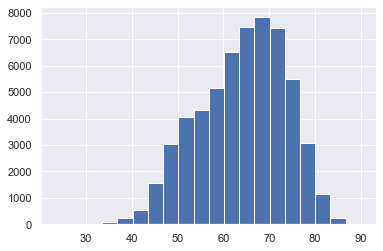

In [42]:
plt.hist(Similarity, bins= 20)

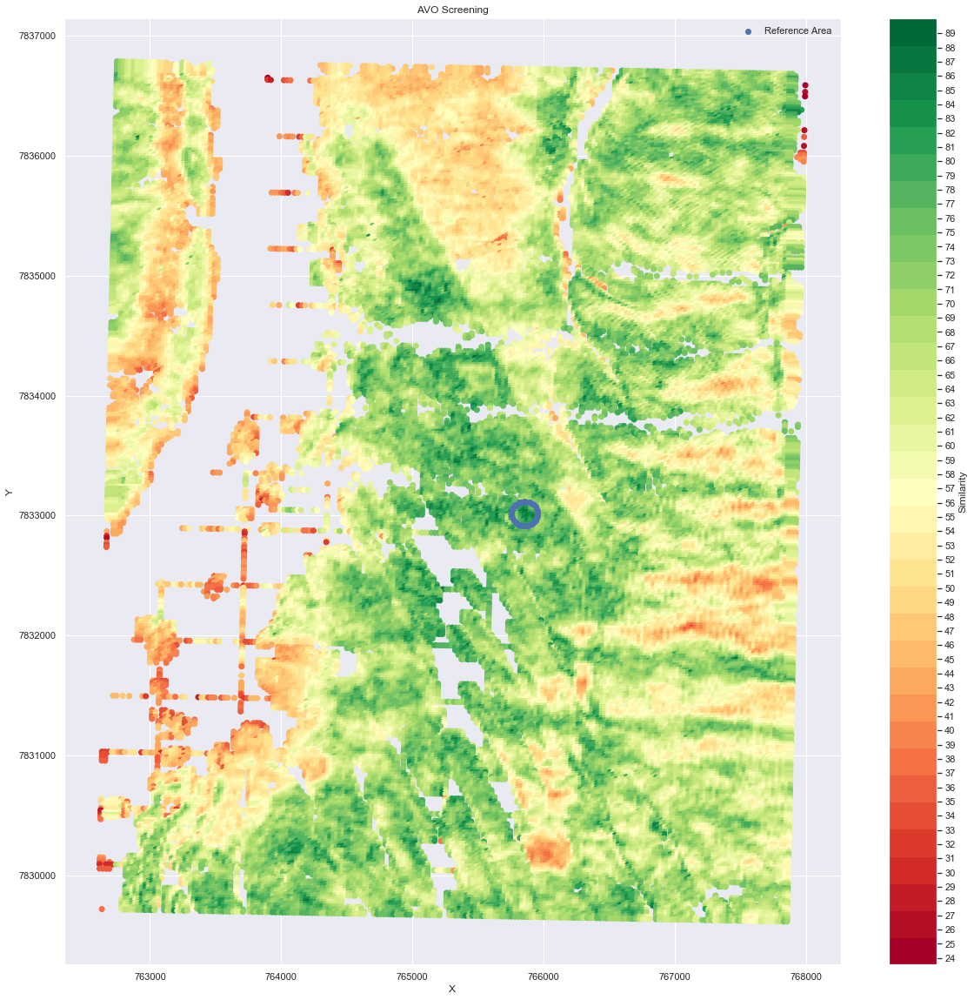

In [43]:
fig = plt.gcf()
fig.set_size_inches(20, 20)

plt.scatter(dfall['X'], dfall['Y'],
            c=dfall['Similarity'], cmap=plt.cm.get_cmap('RdYlGn', 35))

plt.colorbar(ticks=range(90), label='Similarity')
plt.scatter(xw, yw, label='Reference Area')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('AVO Screening')
plt.legend()
plt.clim(9, 90)

In [44]:
# Get names of indexes for which column Age has value 30
indexNames = dfall[ dfall['Similarity'] < 85  ].index
 
# Delete these row indexes from dataFrame
dfall.drop(indexNames , inplace=True)


In [45]:
dfall = dfall.dropna()
dfall

,X,Y,Similarity
1981,767044,7836476,85.445276
2837,767417,7836375,85.487204
3328,767441,7836318,85.928664
5369,762911,7836146,87.484250
5805,766085,7836045,85.196791
5981,766085,7836026,87.585392
6156,766059,7836008,85.700787
15495,764988,7834942,87.797592
15674,765012,7834922,85.911973
15675,765037,7834922,87.033505


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


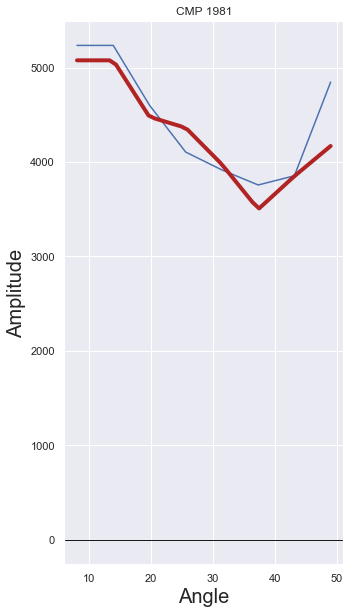

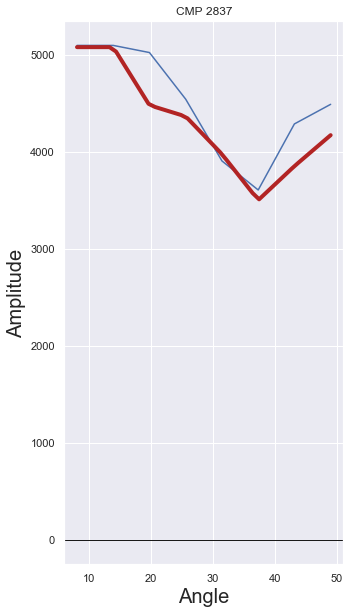

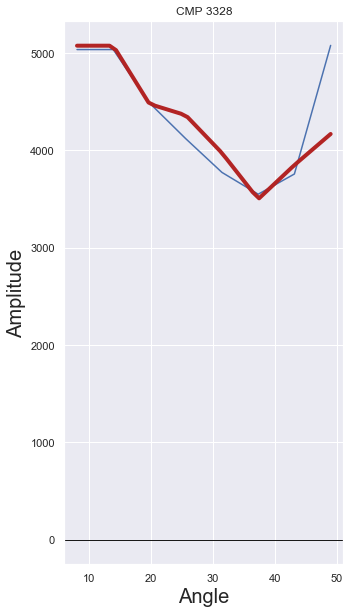

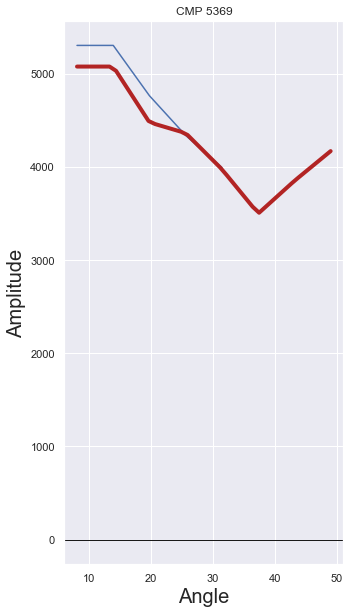

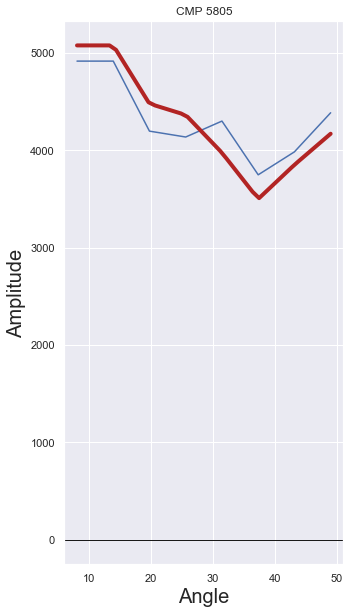

...

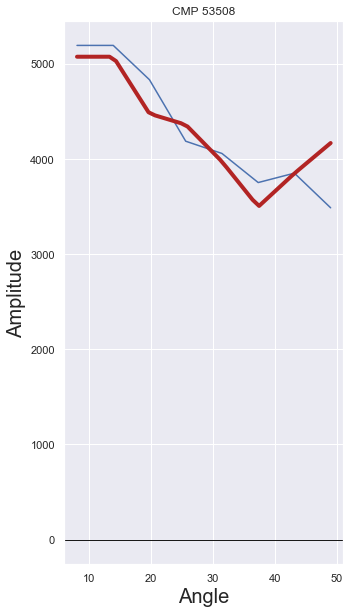

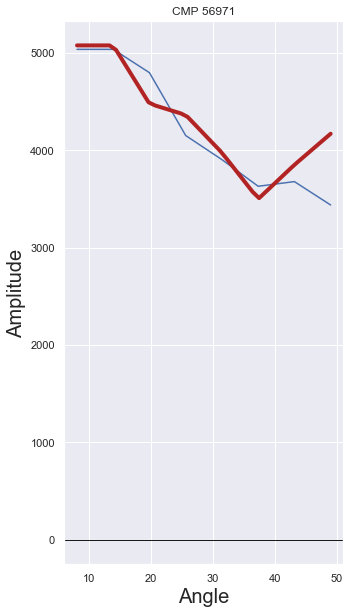

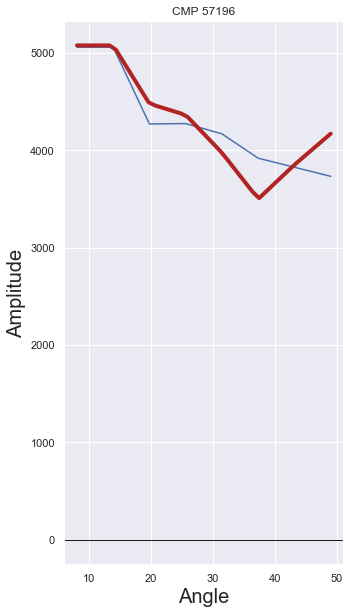

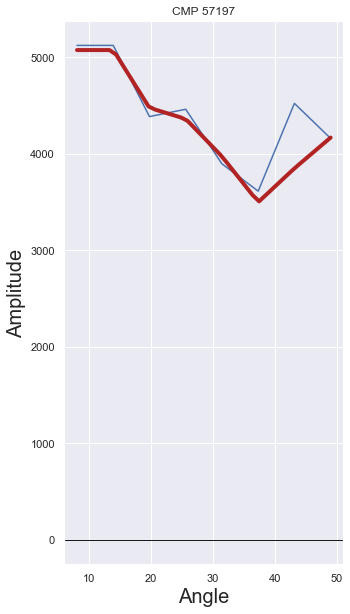

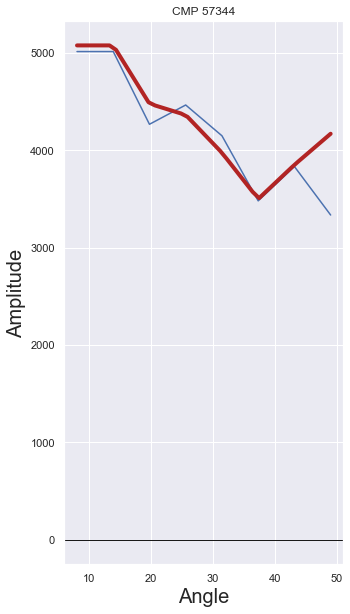

In [46]:
for ind in dfall.index.values:
    plt.figure()
    plt.plot(CMP[ind]['Angle'],CMP[ind]['Amplitude'])
    plt.xlabel('Angle', size=20)
    plt.ylabel('Amplitude', size=20)
    plt.axhline(0, color='k', lw=1)
    plt.title('CMP {}'.format(ind))
    plt.plot(xx, yy, marker='', color='firebrick', ls='-', lw = 4, alpha=3, label='Mean Smooth')
    fig = plt.gcf()
    fig.set_size_inches(5, 10)


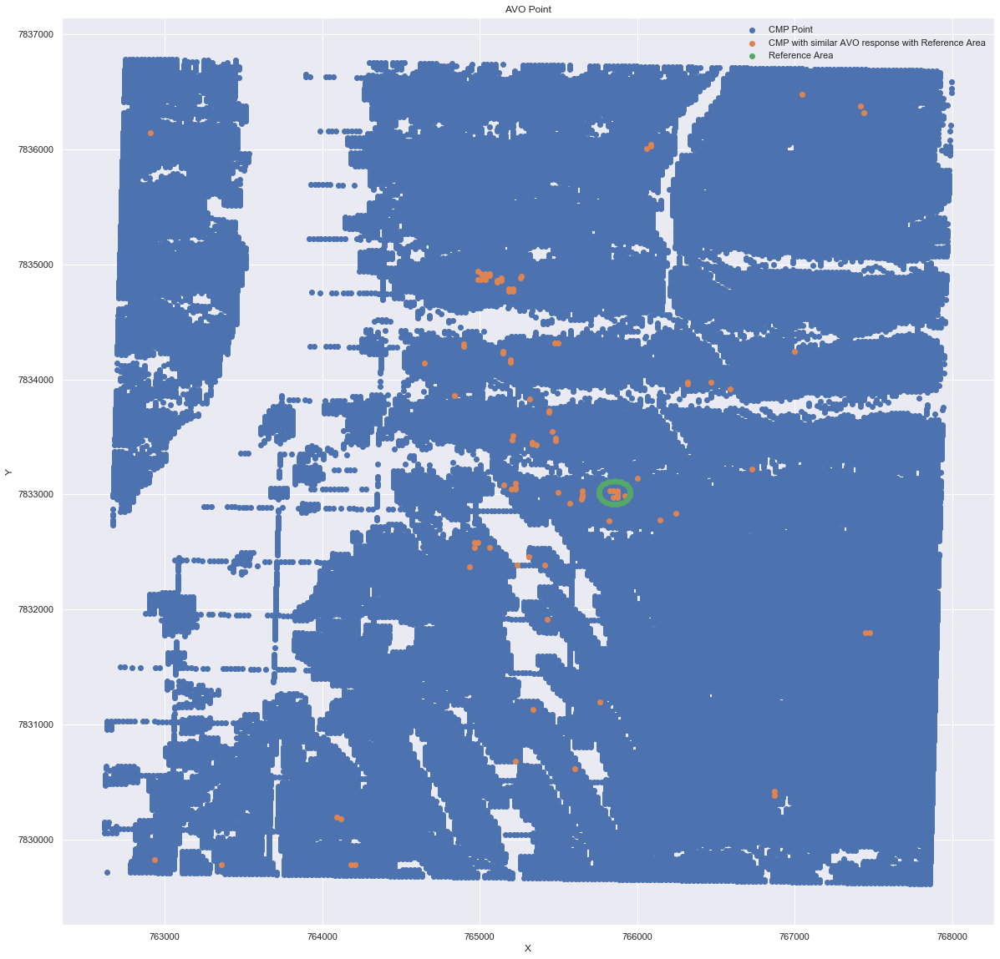

In [47]:
fig = plt.gcf()
fig.set_size_inches(20, 20)
plt.scatter(x, y, label='CMP Point')
plt.scatter(dfall['X'], dfall['Y'], label='CMP with similar AVO response with Reference Area')
plt.scatter(xw, yw, label ='Reference Area')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('AVO Point')
plt.legend()

<img src="Correlation.png" >

<img src="Similarity.png" >

In [48]:
testx = df['X']+10
testy = df['Y']+10

In [49]:
xt = xw+50
yt = yw-40

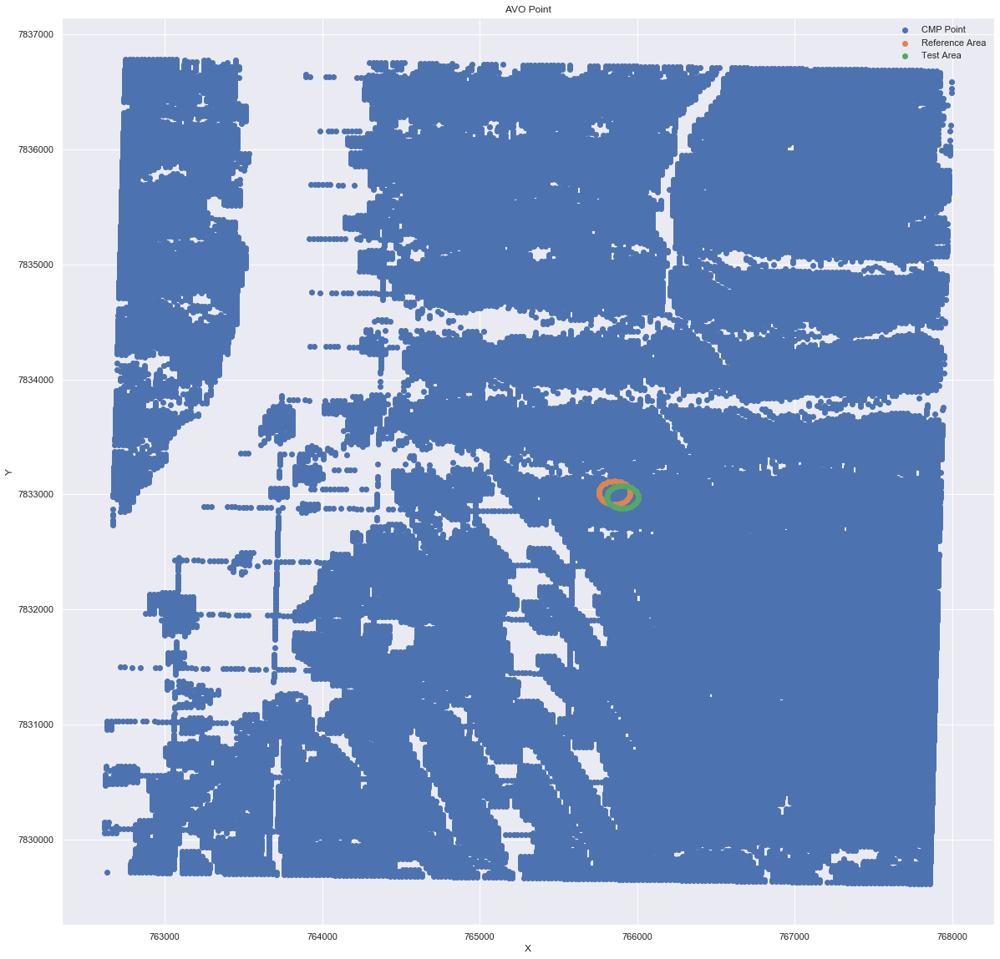

In [50]:
fig = plt.gcf()
fig.set_size_inches(20, 20)
plt.scatter(x, y, label='CMP Point')
plt.scatter(xw, yw, label='Reference Area')
plt.scatter(xt, yt, label='Test Area')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('AVO Point')
plt.legend()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


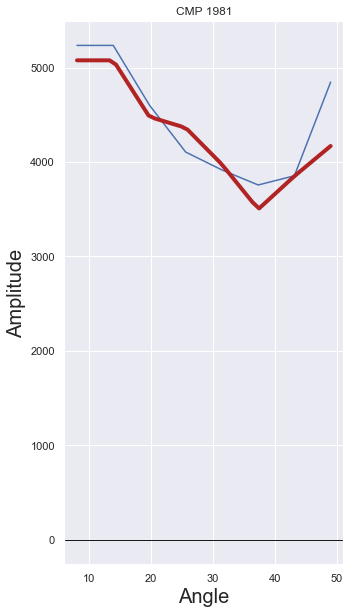

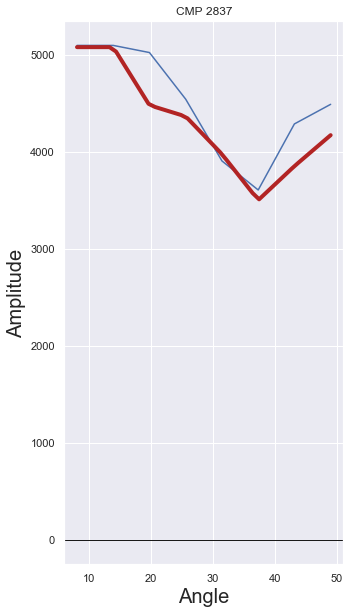

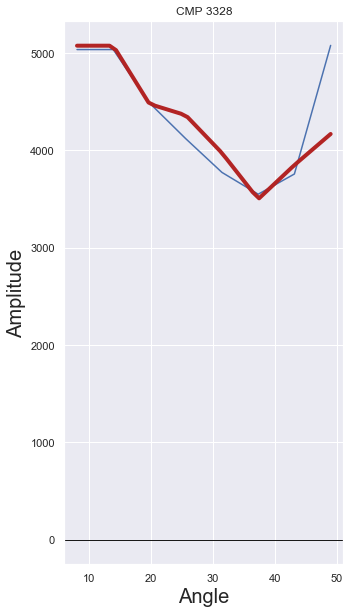

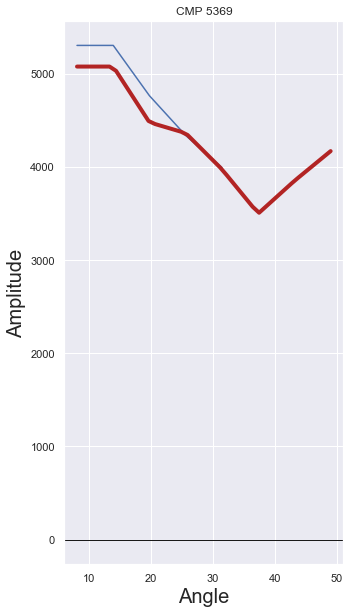

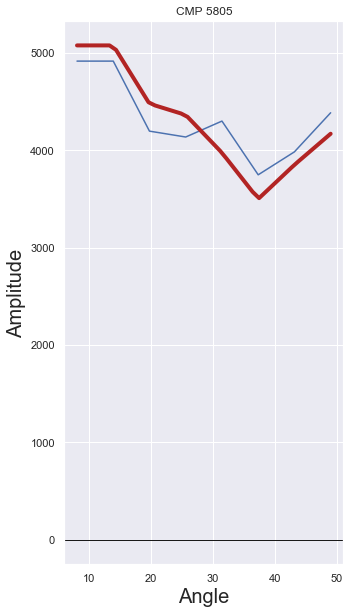

...

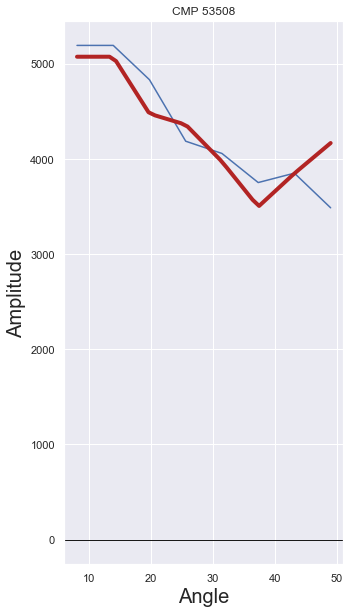

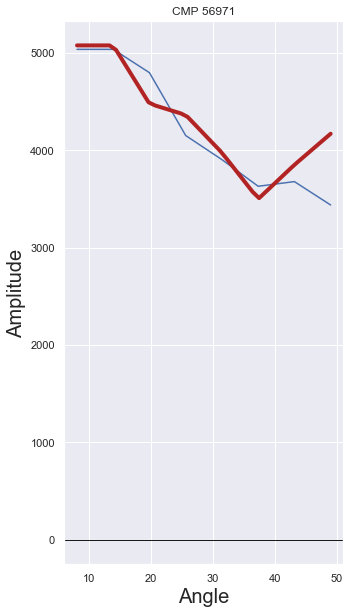

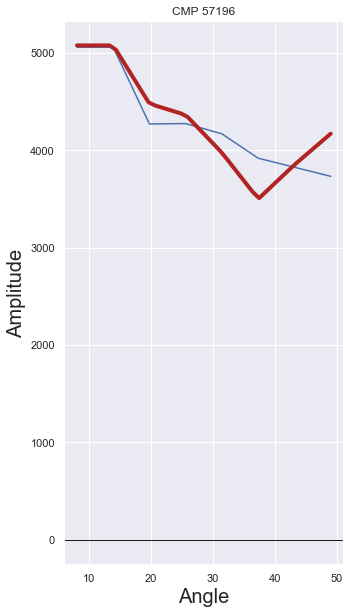

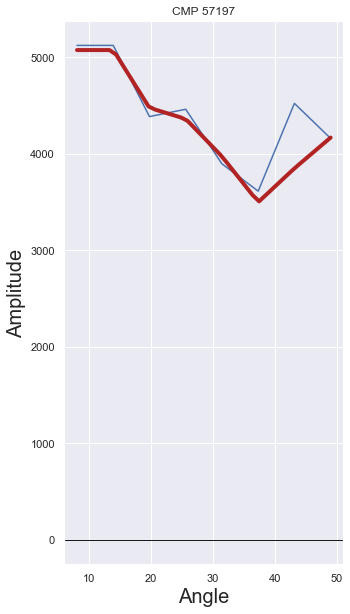

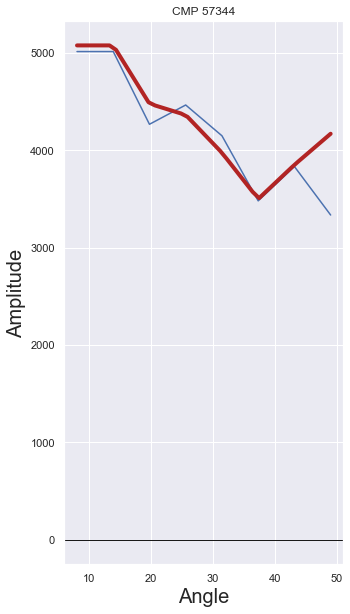

In [51]:
for ind in dfall.index.values:
    plt.figure()
    plt.plot(CMP[ind]['Angle'],CMP[ind]['Amplitude'])
    plt.xlabel('Angle', size=20)
    plt.ylabel('Amplitude', size=20)
    plt.axhline(0, color='k', lw=1)
    plt.title('CMP {}'.format(ind))
    plt.plot(xx, yy, marker='', color='firebrick', ls='-', lw = 4, alpha=3, label='Mean Smooth')
    fig = plt.gcf()
    fig.set_size_inches(5, 10)

In [70]:
print(amean)
print(CMP[0]['Amplitude'].values)

[5076.44 5076.44 4477.42 4362.25 3973.71 3499.01 3849.72 4169.08]
[5835.79 5835.79 5198.11 4197.15 3225.8  2551.6  3239.87 3606.26]


In [71]:
a = abs(amean - CMP[0]['Amplitude'].values)/amean
print(a)

[0.14958317 0.14958317 0.160961   0.03784744 0.18821454 0.27076516
 0.15841412 0.13499861]


In [72]:
sum(a)/8*100

15.62959015602714

In [76]:
mean_absolute_error(amean, CMP[0]['Amplitude'].values)

659.0600000000001

In [80]:
100 - np.sqrt(659.0600000000001)

74.32783608653139

In [64]:
from sklearn.metrics import r2_score
r2_score(amean,CMP[0]['Amplitude'].values, multioutput='variance_weighted')

-0.7415259147779039

In [66]:
from sklearn.metrics import accuracy_score
accuracy_score(amean, CMP[0]['Amplitude'].values)

ValueError: continuous is not supported

In [68]:
from sklearn.metrics import mean_squared_error
mean_squared_error(amean, CMP[0]['Amplitude'].values)

480689.4227750001

In [86]:
# Get names of indexes for which column Age has value 30
indexNames = dfall[ dfall['Similarity'] < 88 ].index
 
# Delete these row indexes from dataFrame
dfall.drop(indexNames , inplace=True)
dfall = dfall.dropna()

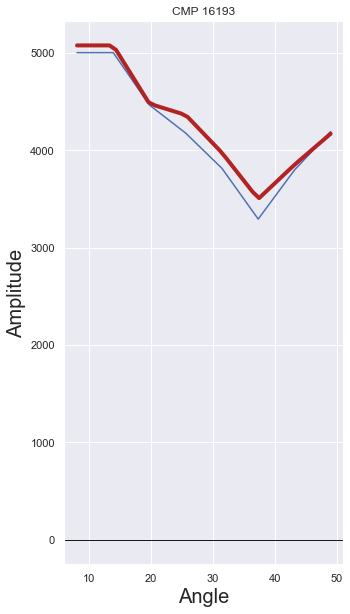

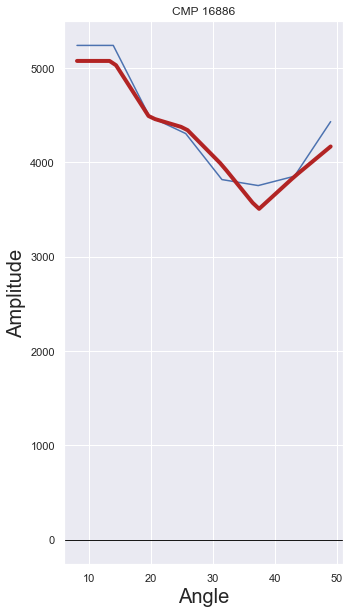

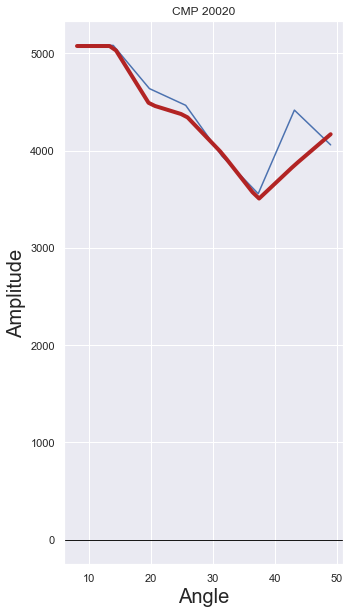

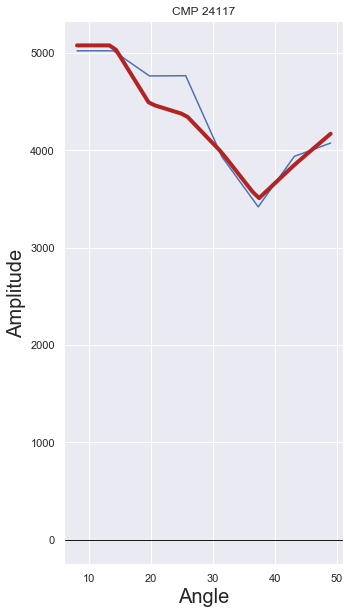

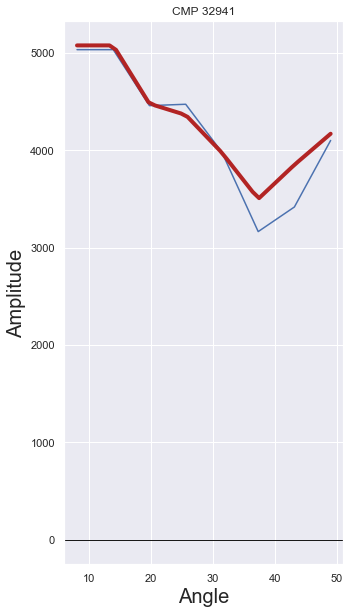

In [87]:
for ind in dfall.index.values:
    plt.figure()
    plt.plot(CMP[ind]['Angle'],CMP[ind]['Amplitude'])
    plt.xlabel('Angle', size=20)
    plt.ylabel('Amplitude', size=20)
    plt.axhline(0, color='k', lw=1)
    plt.title('CMP {}'.format(ind))
    plt.plot(xx, yy, marker='', color='firebrick', ls='-', lw = 4, alpha=3, label='Mean Smooth')
    fig = plt.gcf()
    fig.set_size_inches(5, 10)
    fig, ((ax1, ax2, ax3, ax4, ax5, ax6), (ax7, ax8, ax9, ax10, ax11, ax12), (ax13, ax14, ax15, ax16, ax17, ax18)) \
    = plt.subplots(nrows=3, ncols=6,  figsize=(15, 20))

# C1
ax1.plot(Ang, Amp1,'-k', lw=4)
ax1.axhline(0, color='k', lw=1)
ax1.set_xlabel('angle')
ax1.set_ylabel('amplitude')
ax1.set_title("C1")

# C2
ax2.plot(Ang, Amp2,'-k', lw=4)
ax2.axhline(0, color='k', lw=1)
ax2.set_xlabel('angle')
ax2.set_ylabel('amplitude')
ax2.set_title("C2")

# C3
ax3.plot(Ang, Amp3,'-k', lw=4)
ax3.axhline(0, color='k', lw=1)
ax3.set_xlabel('angle')
ax3.set_ylabel('amplitude')
ax3.set_title("C3")

# C4
ax4.plot(Ang, Amp4,'-k', lw=4)
ax4.axhline(0, color='k', lw=1)
ax4.set_xlabel('angle')
ax4.set_ylabel('amplitude')
ax4.set_title("C4")

# C5
ax5.plot(Ang, Amp5,'-k', lw=4)
ax5.axhline(0, color='k', lw=1)
ax5.set_xlabel('angle')
ax5.set_ylabel('amplitude')
ax5.set_title("C5")

# C6
ax6.plot(Ang, Amp6,'-k', lw=4)
ax6.axhline(0, color='k', lw=1)
ax6.set_xlabel('angle')
ax6.set_ylabel('amplitude')
ax6.set_title("C6")

# C7
ax7.plot(Ang, Amp7,'-k', lw=4)
ax7.axhline(0, color='k', lw=1)
ax7.set_xlabel('angle')
ax7.set_ylabel('amplitude')
ax7.set_title("C7")

# C8
ax8.plot(Ang, Amp8,'-k', lw=4)
ax8.axhline(0, color='k', lw=1)
ax8.set_xlabel('angle')
ax8.set_ylabel('amplitude')
ax8.set_title("C8")

# C9
ax9.plot(Ang, Amp9,'-k', lw=4)
ax9.axhline(0, color='k', lw=1)
ax9.set_xlabel('angle')
ax9.set_ylabel('amplitude')
ax9.set_title("C9")

# C10
ax10.plot(Ang, Amp10,'-k', lw=4)
ax10.axhline(0, color='k', lw=1)
ax10.set_xlabel('angle')
ax10.set_ylabel('amplitude')
ax10.set_title("C10")

# C11
ax11.plot(Ang, Amp11,'-k', lw=4)
ax11.axhline(0, color='k', lw=1)
ax11.set_xlabel('angle')
ax11.set_ylabel('amplitude')
ax11.set_title("C11")

# C12
ax12.plot(Ang, Amp12,'-k', lw=4)
ax12.axhline(0, color='k', lw=1)
ax12.set_xlabel('angle')
ax12.set_ylabel('amplitude')
ax12.set_title("C12")

# C13
ax13.plot(Ang, Amp13,'-k', lw=4)
ax13.axhline(0, color='k', lw=1)
ax13.set_xlabel('angle')
ax13.set_ylabel('amplitude')
ax13.set_title("C13")

# C14
ax14.plot(Ang, Amp14,'-k', lw=4)
ax14.axhline(0, color='k', lw=1)
ax14.set_xlabel('angle')
ax14.set_ylabel('amplitude')
ax14.set_title("C14")

# C5
ax15.plot(Ang, Amp15,'-k', lw=4)
ax15.axhline(0, color='k', lw=1)
ax15.set_xlabel('angle')
ax15.set_ylabel('amplitude')
ax15.set_title("C15")

# C16
ax16.plot(Ang, Amp16,'-k', lw=4)
ax16.axhline(0, color='k', lw=1)
ax16.set_xlabel('angle')
ax16.set_ylabel('amplitude')
ax16.set_title("C16")

# C17
ax17.plot(Ang, Amp17,'-k', lw=4)
ax17.axhline(0, color='k', lw=1)
ax17.set_xlabel('angle')
ax17.set_ylabel('amplitude')
ax17.set_title("C17")

plt.tight_layout()

# ax4.plot(A, B,'ko',ms=10,mfc='none',mew=2)
# ax4.axhline(0, color='k', lw=1), ax4.axvline(0, color='k', lw=1)
# ax4.set_xlabel('intercept'), ax4.set_ylabel('gradient')

# ax4.xaxis.set_label_position('top'), ax4.xaxis.tick_top()
# ax4.yaxis.set_label_position('right'), ax4.yaxis.tick_right()
# ax4.set_xlim(-10e4, 10e4), ax4.set_ylim(-10e6,10e6)

# plt.tight_layout()

In [88]:
print(CMP[0]['Angle'].values)

[ 8.   13.86 19.71 25.57 31.43 37.29 43.14 49.  ]
